<a href="https://colab.research.google.com/github/pacoiniesta/Codigo-Trabajo-Final-de-Master-IA-3/blob/main/TFMDeteccionSecSueloDyReg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



#Importing Libraries.

Loading libraries and specific functions that we are gonna use during code development.



In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import sklearn as skl
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras import regularizers
from keras.datasets import imdb
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.layers import LSTM
from keras.layers import Bidirectional
from keras.layers.embeddings import Embedding
from keras.preprocessing import sequence
from sklearn import cross_decomposition
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from string import ascii_uppercase
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from pylab import rcParams
from sklearn.utils import class_weight

from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import RandomOverSampler
from imblearn.combine import SMOTETomek
from imblearn.ensemble import BalancedBaggingClassifier

from collections import Counter

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.ensemble.bagging module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported fro

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls

drive  sample_data


#Lectura de los datos

In [ ]:


#Definimos los nombres de las columnas de nuestro data frame. Cargamos el archivo Training y 
#realizamos selección previa de las variables de interés (S.T de NDVI y valores de clasificación).
names19=['TARGET_FID', 'COORX', 'COORY', 'SIGPACt', 'CONCAT', 'cERMOT', 'cERMOTt', 'REAL', 'I191', 'I192', 'I193','I194', 'I195', 'I196', 'I197', 'I198', 'I199', 
       'I1910', 'I1911', 'I1912', 'I1913','I1914', 'I1915', 'I1916', 'I1917', 'I1918', 'I1919', 'I1920', 'I1921', 'I1922', 'I1923','I1924', 'I1925', 'I1926',
       'I1927', 'I1928', 'I1929', 'I1930']
names18=['I181' ,'I182' ,'I183' ,'I184' ,'I185' , 'I186','I187' ,'I188' ,'I189' ,'I1810' ,'I1811' ,'I1812' ,'I1813' ,'I1814','I1815' ,
         'I1816','I1817','I1818','I1819','I1820','I1821','I1822','I1823','I1824','class2018', 'class2018t']
names17=['I171','I172','I173','I174','I175','I176','I177','I178','I179','I1710','I1711','I1712',
       'I1713','I1714','I1715','I1716','I1717','I1718','I1719','I1720','I1721','I1722','I1723','class2017','class2017t']


datos_NDVI17=pd.read_excel('/content/drive/MyDrive/Training2017.xlsx', header =0, na_values=['NaN'], index_col=False)
print(datos_NDVI17)
datos_NDVI18=pd.read_excel('/content/drive/MyDrive/Training2018.xlsx', header =0, na_values=['NaN'], index_col=False)
print(datos_NDVI18)
datos_NDVI19=pd.read_excel('/content/drive/MyDrive/Training2019.xlsx', header =0, na_values=['NaN'], index_col=False)
print(datos_NDVI19)


        I170208  I170225  I170310  ...  I171202  Clas2017  Clas2017t
0           128      132      138  ...      122        10    PSecano
1           127      132      136  ...      122        10    PSecano
2           129      134      136  ...      120        10    PSecano
3           140      154      165  ...      121        10    PSecano
4           142      163      174  ...      122        10    PSecano
...         ...      ...      ...  ...      ...       ...        ...
947103      122      123      122  ...      119        11      Suelo
947104      122      123      123  ...      120        11      Suelo
947105      123      123      123  ...      120        11      Suelo
947106      123      122      123  ...      120        10    PSecano
947107      122      123      123  ...      121        10    PSecano

[947108 rows x 25 columns]
        I180121  I180215  I180225  ...  I181205  Clas2018  Clas2018t
0           126      130      133  ...      120        11     Secano
1     

#Normalización de los valores de NDVI entre 0 y 1

In [ ]:
#datos_NDVI17=datos_NDVI17.drop(0)
datos_NDVI17.iloc[:,0:23]=(datos_NDVI17.iloc[:,0:23]-100)/100
datos_NDVI17.head(1)

,I170208,I170225,I170310,I170320,I170406,I170509,I170526,I170615,I170630,I170710,I170718,I170728,I170804,I170814,I170824,I170911,I170918,I171003,I171011,I171023,I171107,I171117,I171202,Clas2017,Clas2017t
0,0.28,0.32,0.38,0.43,0.54,0.6,0.41,0.25,0.24,0.2,0.22,0.21,0.21,0.2,0.19,0.19,0.2,0.18,0.18,0.19,0.22,0.19,0.22,10,PSecano


In [ ]:
#datos_NDVI18=datos_NDVI18.drop(0)
datos_NDVI18.iloc[:,0:24]=(datos_NDVI18.iloc[:,0:24]-100)/100
datos_NDVI18.head(1)

,I180121,I180215,I180225,I180322,I180414,I180426,I180516,I180613,I180620,I180625,I180705,I180713,I180718,I180730,I180814,I180827,I180901,I180916,I180923,I181003,I181016,I181026,I181102,I181205,Clas2018,Clas2018t
0,0.26,0.3,0.33,0.52,0.7,0.66,0.5,0.25,0.23,0.23,0.22,0.22,0.22,0.22,0.21,0.2,0.21,0.18,0.19,0.19,0.2,0.2,0.2,0.2,11,Secano


In [ ]:
#datos_NDVI19=datos_NDVI19.drop(0)
datos_NDVI19.iloc[:,8:39]=(datos_NDVI19.iloc[:,8:39]-100)/100
datos_NDVI19.head(1)

,TARGET_FID,COOR_X,COOR_Y,SIGPACt,CONCAT,cERMOT,cERMOTt,REAL,i190101,i190111,i190121,i190205,i190218,i190225,i190310,i190317,i190327,i190404,i190416,i190429,i190506,i190516,i190531,i190610,i190620,i190628,i190705,i190718,i190728,i190809,i190819,i190827,i190903,i190918,i190928,i191001,i191006,i191016,Training,Count
0,374556,588575,4348015,2 73 0 0 19 30 1,588575 4348015,12,Suelo desnudo,0,0.25,0.26,0.25,0.25,0.29,0.32,0.37,0.36,0.39,0.43,0.5,0.63,0.62,0.66,0.47,0.32,0.29,0.24,0.23,0.22,0.22,0.21,0.21,0.23,0.2,0.2,0.23,0.23,0.2,0.2,-1.0,1


#Correspondencia de leyenda entre nombres de cultivo y número asignado

In [ ]:
print(datos_NDVI17.Clas2017.unique())
print(datos_NDVI17.Clas2017t.unique())

[10 12 15 11 18 13 21 19 24 14  2 16  1  3  6 22  4  9  7  0  5  8 20 17]
['PSecano' 'Improductivo' 'Vinedo Secano' 'Suelo' 'Olivar Secano'
 'Vinedo R' 'FrutoCascara Secano' 'FrutoCascara R' 'Frutal Secano'
 'Vinedo RProb' 'RP' 'Olivar R' 'R Forrajeras' 'RP AChino' 'RV BC y Hort'
 'Frutal R' 'RP AMorado y Hort' 'DC' 'RV AC' 'Undefined' 'RPTardia'
 'R Alfalfa' 'FrutoCascara RProb' 'Olivar RProb']


In [ ]:
print(datos_NDVI18.Clas2018t.unique())
print(datos_NDVI18.Clas2018.unique())

['Secano' 'Improductivo' 'Vinedo Secano' 'Suelo Desnudo' 'Vinedo R'
 'FrutalCascara Secano' 'FrutalCascara R' 'Olivar Secano'
 'FrutalHueso Secano' 'Vinedo RProb' 'Olivar R' 'RP AMorado y Hort' 'RP'
 'FrutalHueso R' 'RP AChino' 'RPTardia' 'RV BC' 'R Alfalfa' 'DC' 'RV AC'
 'R Forrajeras' 'FrutalCascara RProb' 'Olivar RProb']
[11 13 16 12 14 22 20 19 25 15 17  4  2 23  3  6  7  9 10  8  1 21 18]


In [ ]:
print(datos_NDVI19.cERMOT.unique())
print(datos_NDVI19.cERMOTt.unique())

[12 13 15 11 18 21 14 23 20 16 17 19  1  4  8  3  6  9  2  5  7 22]
['Suelo desnudo' 'Improductivo' 'Vi├▒edo Secano' 'Secano'
 'Olivar de Secano' 'Frutal de C├íscara de Secano' 'Vi├▒edo Regad├¡o'
 'Frutal de Hueso de Secano' 'Frutal de C├íscara de Regad├¡o de Apoyo'
 'Olivar de Regad├¡o' 'Olivar de Regad├¡o de Apoyo'
 'Frutal de C├íscara de Regad├¡o' 'Regad├¡o de Primavera Temprana'
 'Regad├¡o de Ajo Morado y hort├¡colas' 'Regad├¡o de Alfalfa'
 'Regad├¡o de Ajo Chino' 'Regad├¡o de Verano Baja Cobertura'
 'Regad├¡o Doble Cosecha' 'Regad├¡o de Primavera'
 'Regad├¡o de Primavera Tard├¡a' 'Regad├¡o de Verano Alta Cobertura'
 'Frutal de Hueso de Regad├¡o']


#Eliminación del cultivo improductivo de los datos

In [ ]:
#17: Improductivo es el 12, suelo es el 11
#18: Improductivo es el 13, suelo es el 12
#19: Improductivo es el 13, suelo es el 12

In [ ]:
print(np.where(datos_NDVI17.Clas2017==12)[0])

print(np.where(datos_NDVI18.Clas2018==13)[0])

print(np.where(datos_NDVI19.cERMOT==13)[0])

[    17     18     19 ... 946896 946897 946898]
[    17     18     19 ... 946896 946897 946898]
[    17     18     19 ... 946896 946897 946898]


Coeficiente de regadío

In [ ]:
#Eliminamos los improductivos:

print(datos_NDVI17)
datos_NDVI17.drop(np.where(datos_NDVI17.Clas2017==12)[0], inplace=True)
print(datos_NDVI17)


print(datos_NDVI18)
datos_NDVI18.drop(np.where(datos_NDVI18.Clas2018==13)[0], inplace=True)
print(datos_NDVI18)


print(datos_NDVI19)
datos_NDVI19.drop(np.where(datos_NDVI19.cERMOT==13)[0], inplace=True)
print(datos_NDVI19)

        I170208  I170225  I170310  ...  I171202  Clas2017  Clas2017t
0          0.28     0.32     0.38  ...     0.22        10    PSecano
1          0.27     0.32     0.36  ...     0.22        10    PSecano
2          0.29     0.34     0.36  ...     0.20        10    PSecano
3          0.40     0.54     0.65  ...     0.21        10    PSecano
4          0.42     0.63     0.74  ...     0.22        10    PSecano
...         ...      ...      ...  ...      ...       ...        ...
947103     0.22     0.23     0.22  ...     0.19        11      Suelo
947104     0.22     0.23     0.23  ...     0.20        11      Suelo
947105     0.23     0.23     0.23  ...     0.20        11      Suelo
947106     0.23     0.22     0.23  ...     0.20        10    PSecano
947107     0.22     0.23     0.23  ...     0.21        10    PSecano

[947108 rows x 25 columns]
        I170208  I170225  I170310  ...  I171202  Clas2017  Clas2017t
0          0.28     0.32     0.38  ...     0.22        10    PSecano
1     

#Generamos columna 'REGADIO' con las 3 clases principales

In [ ]:
datos_NDVI17['REGADIO']=datos_NDVI17.iloc[:,23].replace({0:3, 1:1, 2:1, 3:1 , 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:0, 11:2, 12:0, 13:1, 14:1, 15:0, 16:1, 17:1, 18:0, 19:1, 20:1, 21:0, 22:1, 24:0})

In [ ]:
datos_NDVI18['REGADIO']=datos_NDVI18.iloc[:,24].replace({1:1, 2:1, 3:1 , 4:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:0, 12:2, 13:0, 14:1, 15:1, 16:0, 17:1, 18:1, 19:0, 20:1, 21:1, 22:0, 23:1, 25:0})

In [ ]:
datos_NDVI19['REGADIO']=datos_NDVI19.iloc[:,5].replace({1:1, 2:1, 3:1 , 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 11:0, 12:2, 13:0, 14:1, 15:0, 16:1, 17:1, 18:0, 19:1, 20:1, 21:0, 22:1, 23:0})

#Eliminación de cultivos no definidos en 2017 
Correspondientes al valor 3 en la columna REGADIO.

In [ ]:
datos_NDVI170=datos_NDVI17[datos_NDVI17.REGADIO==0]
print(datos_NDVI170)
datos_NDVI171=datos_NDVI17[datos_NDVI17.REGADIO==1]
print(datos_NDVI171)
datos_NDVI172=datos_NDVI17[datos_NDVI17.REGADIO==2]
print(datos_NDVI172)
datos_NDVI173=datos_NDVI17[datos_NDVI17.REGADIO==3]
print(datos_NDVI173)

datos_NDVI17_U=pd.concat([datos_NDVI170, datos_NDVI171, datos_NDVI172], axis=0)
print(datos_NDVI17_U)

        I170208  I170225  I170310  ...  Clas2017      Clas2017t  REGADIO
0          0.28     0.32     0.38  ...        10        PSecano        0
1          0.27     0.32     0.36  ...        10        PSecano        0
2          0.29     0.34     0.36  ...        10        PSecano        0
3          0.40     0.54     0.65  ...        10        PSecano        0
4          0.42     0.63     0.74  ...        10        PSecano        0
...         ...      ...      ...  ...       ...            ...      ...
947071     0.21     0.21     0.18  ...        15  Vinedo Secano        0
947072     0.21     0.20     0.20  ...        15  Vinedo Secano        0
947092     0.23     0.24     0.23  ...        10        PSecano        0
947106     0.23     0.22     0.23  ...        10        PSecano        0
947107     0.22     0.23     0.23  ...        10        PSecano        0

[494103 rows x 26 columns]
        I170208  I170225  I170310  ...  Clas2017  Clas2017t  REGADIO
111        0.24     0.25   

#Selección de las fechas disponibles para los años de estudio
Que conforman de manera ordenada las series temporales de NDVI de todas las muestras.

In [ ]:
datos_NDVI17X=datos_NDVI17_U.iloc[:,0:23]
print(datos_NDVI17X)
datos_NDVI18X=datos_NDVI18.iloc[:,0:24]
print(datos_NDVI18X)
datos_NDVI19X=datos_NDVI19.iloc[:,8:38]
print(datos_NDVI19X)

        I170208  I170225  I170310  I170320  ...  I171023  I171107  I171117  I171202
0          0.28     0.32     0.38     0.43  ...     0.19     0.22     0.19     0.22
1          0.27     0.32     0.36     0.43  ...     0.18     0.21     0.18     0.22
2          0.29     0.34     0.36     0.39  ...     0.20     0.20     0.19     0.20
3          0.40     0.54     0.65     0.62  ...     0.20     0.22     0.19     0.21
4          0.42     0.63     0.74     0.77  ...     0.20     0.22     0.20     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947101     0.21     0.22     0.22     0.22  ...     0.18     0.19     0.18     0.20
947102     0.21     0.22     0.22     0.23  ...     0.18     0.19     0.18     0.19
947103     0.22     0.23     0.22     0.23  ...     0.18     0.20     0.18     0.19
947104     0.22     0.23     0.23     0.24  ...     0.19     0.20     0.19     0.20
947105     0.23     0.23     0.23     0.24  ...     0.19     0.20     0.19  

#Sustitución de posibles valores 0 ó -1

In [ ]:
datos_NDVI17X.replace(to_replace=0, inplace=True, method='ffill')

print(datos_NDVI17X)

        I170208  I170225  I170310  I170320  ...  I171023  I171107  I171117  I171202
0          0.28     0.32     0.38     0.43  ...     0.19     0.22     0.19     0.22
1          0.27     0.32     0.36     0.43  ...     0.18     0.21     0.18     0.22
2          0.29     0.34     0.36     0.39  ...     0.20     0.20     0.19     0.20
3          0.40     0.54     0.65     0.62  ...     0.20     0.22     0.19     0.21
4          0.42     0.63     0.74     0.77  ...     0.20     0.22     0.20     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947101     0.21     0.22     0.22     0.22  ...     0.18     0.19     0.18     0.20
947102     0.21     0.22     0.22     0.23  ...     0.18     0.19     0.18     0.19
947103     0.22     0.23     0.22     0.23  ...     0.18     0.20     0.18     0.19
947104     0.22     0.23     0.23     0.24  ...     0.19     0.20     0.19     0.20
947105     0.23     0.23     0.23     0.24  ...     0.19     0.20     0.19  

In [ ]:
datos_NDVI17X.replace(to_replace=-1, inplace=True, method='ffill')

print(datos_NDVI17X)

        I170208  I170225  I170310  I170320  ...  I171023  I171107  I171117  I171202
0          0.28     0.32     0.38     0.43  ...     0.19     0.22     0.19     0.22
1          0.27     0.32     0.36     0.43  ...     0.18     0.21     0.18     0.22
2          0.29     0.34     0.36     0.39  ...     0.20     0.20     0.19     0.20
3          0.40     0.54     0.65     0.62  ...     0.20     0.22     0.19     0.21
4          0.42     0.63     0.74     0.77  ...     0.20     0.22     0.20     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947101     0.21     0.22     0.22     0.22  ...     0.18     0.19     0.18     0.20
947102     0.21     0.22     0.22     0.23  ...     0.18     0.19     0.18     0.19
947103     0.22     0.23     0.22     0.23  ...     0.18     0.20     0.18     0.19
947104     0.22     0.23     0.23     0.24  ...     0.19     0.20     0.19     0.20
947105     0.23     0.23     0.23     0.24  ...     0.19     0.20     0.19  

In [ ]:
datos_NDVI18X.replace(to_replace=0, inplace=True, method='ffill')

print(datos_NDVI18X)

        I180121  I180215  I180225  I180322  ...  I181016  I181026  I181102  I181205
0          0.26     0.30     0.33     0.52  ...     0.20     0.20     0.20     0.20
1          0.26     0.30     0.33     0.54  ...     0.19     0.19     0.22     0.24
2          0.25     0.29     0.31     0.44  ...     0.22     0.20     0.21     0.22
3          0.25     0.31     0.33     0.43  ...     0.21     0.20     0.22     0.21
4          0.27     0.31     0.36     0.50  ...     0.25     0.20     0.22     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.27     0.31     0.38  ...     0.20    -1.00     0.18     0.19
947104     0.23     0.28     0.32     0.41  ...     0.19    -1.00     0.18     0.19
947105     0.22     0.28     0.33     0.41  ...     0.18    -1.00     0.18     0.18
947106     0.23     0.28     0.33     0.43  ...     0.19    -1.00     0.18     0.20
947107     0.24     0.27     0.32     0.43  ...     0.19    -1.00     0.19  

In [ ]:
datos_NDVI18X.replace(to_replace=-1, inplace=True, method='ffill')

print(datos_NDVI18X)

        I180121  I180215  I180225  I180322  ...  I181016  I181026  I181102  I181205
0          0.26     0.30     0.33     0.52  ...     0.20     0.20     0.20     0.20
1          0.26     0.30     0.33     0.54  ...     0.19     0.19     0.22     0.24
2          0.25     0.29     0.31     0.44  ...     0.22     0.20     0.21     0.22
3          0.25     0.31     0.33     0.43  ...     0.21     0.20     0.22     0.21
4          0.27     0.31     0.36     0.50  ...     0.25     0.20     0.22     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.27     0.31     0.38  ...     0.20     0.25     0.18     0.19
947104     0.23     0.28     0.32     0.41  ...     0.19     0.25     0.18     0.19
947105     0.22     0.28     0.33     0.41  ...     0.18     0.25     0.18     0.18
947106     0.23     0.28     0.33     0.43  ...     0.19     0.25     0.18     0.20
947107     0.24     0.27     0.32     0.43  ...     0.19     0.25     0.19  

In [ ]:
datos_NDVI19X.replace(to_replace=0, inplace=True, method='ffill')

print(datos_NDVI19X)

        i190101  i190111  i190121  i190205  ...  i190928  i191001  i191006  i191016
0          0.25     0.26     0.25     0.25  ...     0.23     0.23     0.20     0.20
1          0.27     0.26     0.27     0.25  ...     0.23     0.22     0.21     0.20
2          0.25     0.26     0.25     0.21  ...     0.22     0.21     0.21     0.22
3          0.23     0.22     0.21     0.22  ...     0.21     0.22     0.22     0.25
4          0.23     0.23     0.23     0.22  ...     0.22     0.23     0.22     0.24
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.22     0.23     0.22  ...     0.20     0.20     0.20     0.23
947104     0.22     0.23     0.23     0.22  ...     0.20     0.21     0.21     0.23
947105     0.23     0.23     0.22     0.22  ...     0.20     0.21     0.21     0.23
947106     0.22     0.22     0.23     0.23  ...     0.20     0.21     0.21     0.23
947107     0.23     0.22     0.23     0.22  ...     0.20     0.20     0.20  

In [ ]:
datos_NDVI19X.replace(to_replace=-1, inplace=True, method='ffill')

print(datos_NDVI19X)

        i190101  i190111  i190121  i190205  ...  i190928  i191001  i191006  i191016
0          0.25     0.26     0.25     0.25  ...     0.23     0.23     0.20     0.20
1          0.27     0.26     0.27     0.25  ...     0.23     0.22     0.21     0.20
2          0.25     0.26     0.25     0.21  ...     0.22     0.21     0.21     0.22
3          0.23     0.22     0.21     0.22  ...     0.21     0.22     0.22     0.25
4          0.23     0.23     0.23     0.22  ...     0.22     0.23     0.22     0.24
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.22     0.23     0.22  ...     0.20     0.20     0.20     0.23
947104     0.22     0.23     0.23     0.22  ...     0.20     0.21     0.21     0.23
947105     0.23     0.23     0.22     0.22  ...     0.20     0.21     0.21     0.23
947106     0.22     0.22     0.23     0.23  ...     0.20     0.21     0.21     0.23
947107     0.23     0.22     0.23     0.22  ...     0.20     0.20     0.20  

#Selección de variable respuesta


In [ ]:
datos_NDVI17Y=datos_NDVI17_U.REGADIO
datos_NDVI18Y=datos_NDVI18.REGADIO
datos_NDVI19Y=datos_NDVI19.REGADIO

#Preparación de las covariables

Seleccionamos las fechas que utilizaremos, 22 para cada año de estudio.

In [ ]:
datos_NDVI17X_S=datos_NDVI17X.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,12,13,14,15,16,17,18,19,20,21,22]]
print(datos_NDVI17X_S)

        I170208  I170225  I170310  I170320  ...  I171023  I171107  I171117  I171202
0          0.28     0.32     0.38     0.43  ...     0.19     0.22     0.19     0.22
1          0.27     0.32     0.36     0.43  ...     0.18     0.21     0.18     0.22
2          0.29     0.34     0.36     0.39  ...     0.20     0.20     0.19     0.20
3          0.40     0.54     0.65     0.62  ...     0.20     0.22     0.19     0.21
4          0.42     0.63     0.74     0.77  ...     0.20     0.22     0.20     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947101     0.21     0.22     0.22     0.22  ...     0.18     0.19     0.18     0.20
947102     0.21     0.22     0.22     0.23  ...     0.18     0.19     0.18     0.19
947103     0.22     0.23     0.22     0.23  ...     0.18     0.20     0.18     0.19
947104     0.22     0.23     0.23     0.24  ...     0.19     0.20     0.19     0.20
947105     0.23     0.23     0.23     0.24  ...     0.19     0.20     0.19  

In [ ]:
datos_NDVI17X_S.head(1)

,I170208,I170225,I170310,I170320,I170406,I170509,I170526,I170615,I170630,I170710,I170718,I170804,I170814,I170824,I170911,I170918,I171003,I171011,I171023,I171107,I171117,I171202
0,0.28,0.32,0.38,0.43,0.54,0.6,0.41,0.25,0.24,0.2,0.22,0.21,0.2,0.19,0.19,0.2,0.18,0.18,0.19,0.22,0.19,0.22


In [ ]:
datos_NDVI18X_S=datos_NDVI18X.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21]]
print(datos_NDVI18X_S)

        I180121  I180215  I180225  I180322  ...  I180923  I181003  I181016  I181026
0          0.26     0.30     0.33     0.52  ...     0.19     0.19     0.20     0.20
1          0.26     0.30     0.33     0.54  ...     0.19     0.21     0.19     0.19
2          0.25     0.29     0.31     0.44  ...     0.19     0.25     0.22     0.20
3          0.25     0.31     0.33     0.43  ...     0.21     0.22     0.21     0.20
4          0.27     0.31     0.36     0.50  ...     0.22     0.24     0.25     0.20
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.27     0.31     0.38  ...     0.18     0.19     0.20     0.25
947104     0.23     0.28     0.32     0.41  ...     0.18     0.20     0.19     0.25
947105     0.22     0.28     0.33     0.41  ...     0.17     0.19     0.18     0.25
947106     0.23     0.28     0.33     0.43  ...     0.18     0.19     0.19     0.25
947107     0.24     0.27     0.32     0.43  ...     0.17     0.19     0.19  

In [ ]:
datos_NDVI18X_S.head(1)

,I180121,I180215,I180225,I180322,I180414,I180426,I180516,I180613,I180620,I180625,I180705,I180713,I180718,I180730,I180814,I180827,I180901,I180916,I180923,I181003,I181016,I181026
0,0.26,0.3,0.33,0.52,0.7,0.66,0.5,0.25,0.23,0.23,0.22,0.22,0.22,0.22,0.21,0.2,0.21,0.18,0.19,0.19,0.2,0.2


In [ ]:
datos_NDVI19X_S=datos_NDVI19X.iloc[:,[2,4,5,8,10,11,13,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29]]
print(datos_NDVI19X_S)

        i190121  i190218  i190225  i190327  ...  i190928  i191001  i191006  i191016
0          0.25     0.29     0.32     0.39  ...     0.23     0.23     0.20     0.20
1          0.27     0.29     0.32     0.35  ...     0.23     0.22     0.21     0.20
2          0.25     0.26     0.25     0.29  ...     0.22     0.21     0.21     0.22
3          0.21     0.22     0.24     0.28  ...     0.21     0.22     0.22     0.25
4          0.23     0.25     0.25     0.30  ...     0.22     0.23     0.22     0.24
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.23     0.22     0.24     0.27  ...     0.20     0.20     0.20     0.23
947104     0.23     0.23     0.25     0.27  ...     0.20     0.21     0.21     0.23
947105     0.22     0.24     0.25     0.27  ...     0.20     0.21     0.21     0.23
947106     0.23     0.24     0.25     0.28  ...     0.20     0.21     0.21     0.23
947107     0.23     0.24     0.25     0.28  ...     0.20     0.20     0.20  

In [ ]:
datos_NDVI19X_S.head(1)

,i190121,i190218,i190225,i190327,i190416,i190429,i190516,i190610,i190620,i190628,i190705,i190718,i190728,i190809,i190819,i190827,i190903,i190918,i190928,i191001,i191006,i191016
0,0.25,0.29,0.32,0.39,0.5,0.63,0.66,0.32,0.29,0.24,0.23,0.22,0.22,0.21,0.21,0.23,0.2,0.2,0.23,0.23,0.2,0.2


#Incorporación de nuevas covariables en forma de parámetros estadísticos

Generamos estas covariables únicamente para los modelos que entienden las covariables como variables independientes. Es decir, **para ejecutar los modelos CNN-1D y 2-BiLSTM no debemos incorporar estas columnas**.

In [ ]:
#2017
datos_NDVI17X_S['STD']=datos_NDVI17X_S.iloc[:, 0:23].std(axis=1)
datos_NDVI17X_S['MEAN']=datos_NDVI17X_S.iloc[:, 0:23].mean(axis=1)
datos_NDVI17X_S['MAX']=datos_NDVI17X_S.iloc[:, 0:23].max(axis=1)
datos_NDVI17X_S['MIN']=datos_NDVI17X_S.iloc[:, 0:23].min(axis=1)

#2018
datos_NDVI18X_S['STD']=datos_NDVI18X_S.iloc[:, 0:23].std(axis=1)
datos_NDVI18X_S['MEAN']=datos_NDVI18X_S.iloc[:, 0:23].mean(axis=1)
datos_NDVI18X_S['MAX']=datos_NDVI18X_S.iloc[:, 0:23].max(axis=1)
datos_NDVI18X_S['MIN']=datos_NDVI18X_S.iloc[:, 0:23].min(axis=1)

#2019
datos_NDVI19X_S['STD']=datos_NDVI19X_S.iloc[:, 0:23].std(axis=1)
datos_NDVI19X_S['MEAN']=datos_NDVI19X_S.iloc[:, 0:23].mean(axis=1)
datos_NDVI19X_S['MAX']=datos_NDVI19X_S.iloc[:, 0:23].max(axis=1)
datos_NDVI19X_S['MIN']=datos_NDVI19X_S.iloc[:, 0:23].min(axis=1)

print(datos_NDVI17X_S)
print(datos_NDVI18X_S)
print(datos_NDVI19X_S)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

        I170208  I170225  I170310  I170320  ...       STD      MEAN   MAX       MIN
0          0.28     0.32     0.38     0.43  ...  0.121527  0.267892  0.60  0.121527
1          0.27     0.32     0.36     0.43  ...  0.118542  0.262980  0.59  0.118542
2          0.29     0.34     0.36     0.39  ...  0.093429  0.249280  0.48  0.093429
3          0.40     0.54     0.65     0.62  ...  0.167096  0.289874  0.65  0.160000
4          0.42     0.63     0.74     0.77  ...  0.211650  0.318767  0.77  0.170000
...         ...      ...      ...      ...  ...       ...       ...   ...       ...
947101     0.21     0.22     0.22     0.22  ...  0.048842  0.203428  0.36  0.048842
947102     0.21     0.22     0.22     0.23  ...  0.050933  0.206128  0.38  0.050933
947103     0.22     0.23     0.22     0.23  ...  0.050948  0.209172  0.38  0.050948
947104     0.22     0.23     0.23     0.24  ...  0.053711  0.213640  0.40  0.053711
947105     0.23     0.23     0.23     0.24  ...  0.057253  0.215533  0.40  0

#Partición datasets ENTRENAMIENTO Y VALIDACIÓN

El 5% del terreno se usa para entrenar y el 95% restante se usa para validar los modelos.


In [ ]:
train_X175, val_X175, train_Y175, val_Y175=train_test_split(datos_NDVI17X_S, datos_NDVI17Y, test_size=0.95,shuffle=True, random_state=14)

In [ ]:
train_X185, val_X185, train_Y185, val_Y185=train_test_split(datos_NDVI18X_S, datos_NDVI18Y, test_size=0.95,shuffle=True, random_state=14)

In [ ]:
train_X195, val_X195, train_Y195, val_Y195=train_test_split(datos_NDVI19X_S, datos_NDVI19Y, test_size=0.95,shuffle=True, random_state=14)

#PESOS DE LAS CLASES
Generamos estos pesos puesto que la clasificación está algo desbalanceada y puede servirnos de ayuda para conseguir desarrollar clasificadores más robustos.


In [ ]:
class_weight175 = class_weight.compute_class_weight('balanced' ,np.unique(train_Y175) ,train_Y175)
print(class_weight175)

[0.59956815 1.28330445 1.80866308]


In [ ]:
class_weight185 = class_weight.compute_class_weight('balanced' ,np.unique(train_Y185) ,train_Y185)
print(class_weight185)

[0.69771057 1.3081611  1.24640242]


In [ ]:
class_weight195 = class_weight.compute_class_weight('balanced' ,np.unique(train_Y195) ,train_Y195)
print(class_weight195)

[0.94358876 1.26639333 0.86913276]


#DICCIONARIOS DE PESOS DE LAS CLASES

In [ ]:
class_dictW175={0: class_weight175[0], 1: class_weight175[1], 2:class_weight175[2]+1}
print(class_dictW175)

{0: 0.5995681511470985, 1: 1.2833044482957827, 2: 2.808663084188243}


In [ ]:
class_dictW185={0: class_weight185[0], 1: class_weight185[1], 2: class_weight185[2]+1}
print(class_dictW185)

{0: 0.6977105709440362, 1: 1.3081611022787494, 2: 2.2464024236303963}


In [ ]:
class_dictW195={0: class_weight195[0], 1: class_weight195[1], 2:class_weight195[2]+1}
print(class_dictW195)

{0: 0.9435887644263408, 1: 1.266393325930355, 2: 1.8691327627310743}


#Preparación de los datos de entrenamiento y validación para la CNN-1D

In [ ]:
train_Xnp175=np.array(train_X175)
train_Xnps175=train_Xnp175.reshape([train_X175.shape[0], train_X175.shape[1], 1])
print(train_Xnps175)

train_Xnp185=np.array(train_X185)
train_Xnps185=train_Xnp185.reshape([train_X185.shape[0], train_X185.shape[1], 1])
print(train_Xnps185)

train_Xnp195=np.array(train_X195)
train_Xnps195=train_Xnp195.reshape([train_X195.shape[0], train_X195.shape[1], 1])
print(train_Xnps195)

[[[0.22]
  [0.21]
  [0.22]
  ...
  [0.2 ]
  [0.18]
  [0.19]]

 [[0.23]
  [0.28]
  [0.36]
  ...
  [0.2 ]
  [0.19]
  [0.21]]

 [[0.32]
  [0.41]
  [0.49]
  ...
  [0.21]
  [0.2 ]
  [0.22]]

 ...

 [[0.19]
  [0.28]
  [0.39]
  ...
  [0.26]
  [0.26]
  [0.3 ]]

 [[0.29]
  [0.31]
  [0.31]
  ...
  [0.19]
  [0.19]
  [0.19]]

 [[0.21]
  [0.26]
  [0.38]
  ...
  [0.2 ]
  [0.18]
  [0.19]]]
[[[0.19]
  [0.21]
  [0.24]
  ...
  [0.26]
  [0.23]
  [0.22]]

 [[0.2 ]
  [0.22]
  [0.26]
  ...
  [0.3 ]
  [0.3 ]
  [0.21]]

 [[0.18]
  [0.22]
  [0.27]
  ...
  [0.19]
  [0.18]
  [0.17]]

 ...

 [[0.19]
  [0.21]
  [0.22]
  ...
  [0.19]
  [0.18]
  [0.22]]

 [[0.17]
  [0.18]
  [0.22]
  ...
  [0.3 ]
  [0.31]
  [0.29]]

 [[0.24]
  [0.25]
  [0.26]
  ...
  [0.26]
  [0.24]
  [0.24]]]
[[[0.23]
  [0.22]
  [0.21]
  ...
  [0.27]
  [0.28]
  [0.28]]

 [[0.21]
  [0.21]
  [0.2 ]
  ...
  [0.27]
  [0.28]
  [0.27]]

 [[0.21]
  [0.19]
  [0.2 ]
  ...
  [0.26]
  [0.25]
  [0.25]]

 ...

 [[0.23]
  [0.26]
  [0.28]
  ...
  [0.23]
  [0.22]
 

In [ ]:
val_Xnp175=np.array(val_X175)
val_Xnps175=val_Xnp175.reshape([val_X175.shape[0], val_X175.shape[1], 1])
print(val_Xnps175)


val_Xnp185=np.array(val_X185)
val_Xnps185=val_Xnp185.reshape([val_X185.shape[0], val_X185.shape[1], 1])
print(val_Xnps185)

val_Xnp195=np.array(val_X195)
val_Xnps195=val_Xnp195.reshape([val_X195.shape[0], val_X195.shape[1], 1])
print(val_Xnps195)


[[[0.25]
  [0.28]
  [0.31]
  ...
  [0.21]
  [0.2 ]
  [0.21]]

 [[0.22]
  [0.21]
  [0.24]
  ...
  [0.21]
  [0.21]
  [0.23]]

 [[0.27]
  [0.38]
  [0.5 ]
  ...
  [0.19]
  [0.21]
  [0.22]]

 ...

 [[0.2 ]
  [0.22]
  [0.24]
  ...
  [0.19]
  [0.16]
  [0.19]]

 [[0.24]
  [0.32]
  [0.38]
  ...
  [0.2 ]
  [0.2 ]
  [0.2 ]]

 [[0.3 ]
  [0.39]
  [0.48]
  ...
  [0.21]
  [0.2 ]
  [0.22]]]
[[[0.2 ]
  [0.25]
  [0.28]
  ...
  [0.19]
  [0.19]
  [0.19]]

 [[0.17]
  [0.19]
  [0.21]
  ...
  [0.36]
  [0.31]
  [0.26]]

 [[0.18]
  [0.19]
  [0.21]
  ...
  [0.25]
  [0.2 ]
  [0.21]]

 ...

 [[0.27]
  [0.33]
  [0.36]
  ...
  [0.24]
  [0.24]
  [0.23]]

 [[0.2 ]
  [0.22]
  [0.21]
  ...
  [0.2 ]
  [0.18]
  [0.18]]

 [[0.19]
  [0.19]
  [0.22]
  ...
  [0.27]
  [0.29]
  [0.19]]]
[[[0.24]
  [0.24]
  [0.26]
  ...
  [0.24]
  [0.25]
  [0.26]]

 [[0.27]
  [0.24]
  [0.26]
  ...
  [0.22]
  [0.23]
  [0.21]]

 [[0.22]
  [0.21]
  [0.21]
  ...
  [0.2 ]
  [0.21]
  [0.2 ]]

 ...

 [[0.2 ]
  [0.19]
  [0.19]
  ...
  [0.32]
  [0.3 ]
 

#1D-Convolutional Neural Network Model

##Arquitectura modelo CNN-1D 2017

In [ ]:
from keras.layers import Convolution1D, ZeroPadding1D, MaxPooling1D, BatchNormalization, Activation, Dropout, Flatten

k_s=5
dt=0.8
lr=0.001
batch_size=64
num_classes=3
epochs=35
input_shape=(train_Xnps175.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model_C1D175= Sequential()


model_C1D175.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model_C1D175.add(BatchNormalization())
model_C1D175.add(MaxPooling1D(pool_size=(2)))
model_C1D175.add(Convolution1D(128, kernel_size=3, activation='relu'))
model_C1D175.add(BatchNormalization())
model_C1D175.add(Flatten())
model_C1D175.add(Dense(128, activation='tanh'))
model_C1D175.add(Dropout(dt))
model_C1D175.add(Dense(64, activation='relu'))
model_C1D175.add(Dropout(dt))
model_C1D175.add(Dense(3, activation='softmax'))

model_C1D175.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model_C1D175.summary()




Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 18, 256)           1536      
_________________________________________________________________
batch_normalization (BatchNo (None, 18, 256)           1024      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 9, 256)            0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 7, 128)            98432     
_________________________________________________________________
batch_normalization_1 (Batch (None, 7, 128)            512       
_________________________________________________________________
flatten (Flatten)            (None, 896)               0         
_________________________________________________________________
dense (Dense)                (None, 128)               1

##Arquitectura modelo CNN-1D 2018

In [ ]:
from keras.layers import Convolution1D, ZeroPadding1D, MaxPooling1D, BatchNormalization, Activation, Dropout, Flatten

k_s=5
dt=0.4
lr=0.001
batch_size=64
num_classes=3
epochs=35
input_shape=(train_Xnps185.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model_C1D185= Sequential()


model_C1D185.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model_C1D185.add(BatchNormalization())
model_C1D185.add(MaxPooling1D(pool_size=(2)))
model_C1D185.add(Convolution1D(128, kernel_size=3, activation='relu'))
model_C1D185.add(BatchNormalization())
model_C1D185.add(Flatten())
model_C1D185.add(Dense(128, activation='tanh'))
model_C1D185.add(Dropout(dt))
model_C1D185.add(Dense(64, activation='relu'))
model_C1D185.add(Dropout(dt))
model_C1D185.add(Dense(3, activation='softmax'))

model_C1D185.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model_C1D185.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_2 (Conv1D)            (None, 18, 256)           1536      
_________________________________________________________________
batch_normalization_2 (Batch (None, 18, 256)           1024      
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 9, 256)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 7, 128)            98432     
_________________________________________________________________
batch_normalization_3 (Batch (None, 7, 128)            512       
_________________________________________________________________
flatten_1 (Flatten)          (None, 896)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)              

##Arquitectura modelo CNN-1D 2019

In [ ]:
from keras.layers import Convolution1D, ZeroPadding1D, MaxPooling1D, BatchNormalization, Activation, Dropout, Flatten

k_s=5
dt=0.4
lr=0.001
batch_size=64
num_classes=3
epochs=35
input_shape=(train_Xnps195.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model_C1D195= Sequential()


model_C1D195.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model_C1D195.add(BatchNormalization())
model_C1D195.add(MaxPooling1D(pool_size=(2)))
model_C1D195.add(Convolution1D(128, kernel_size=3, activation='relu'))
model_C1D195.add(BatchNormalization())
model_C1D195.add(Flatten())
model_C1D195.add(Dense(128, activation='tanh'))
model_C1D195.add(Dropout(dt))
model_C1D195.add(Dense(64, activation='relu'))
model_C1D195.add(Dropout(dt))
model_C1D195.add(Dense(3, activation='softmax'))

model_C1D195.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model_C1D195.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_4 (Conv1D)            (None, 18, 256)           1536      
_________________________________________________________________
batch_normalization_4 (Batch (None, 18, 256)           1024      
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 9, 256)            0         
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 7, 128)            98432     
_________________________________________________________________
batch_normalization_5 (Batch (None, 7, 128)            512       
_________________________________________________________________
flatten_2 (Flatten)          (None, 896)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)              

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os


seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps
Y = train_Y.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=3, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model_C1D.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps, dtype=float), pd.get_dummies(val_Y)), 
                                batch_size=batch_size, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW
                            )
 # evaluate the model
 scores = model_C1D.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model_C1D.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (numpy.mean(cvscores), numpy.std(cvscores)))

Epoch 1/30
1480/1480 [==============================] - 72s 49ms/step - loss: 0.1384 - accuracy: 0.9442 - val_loss: 0.1419 - val_accuracy: 0.9426
Epoch 2/30
1480/1480 [==============================] - 75s 51ms/step - loss: 0.1370 - accuracy: 0.9447 - val_loss: 0.1403 - val_accuracy: 0.9448
Epoch 3/30
1480/1480 [==============================] - 77s 52ms/step - loss: 0.1365 - accuracy: 0.9447 - val_loss: 0.1755 - val_accuracy: 0.9292
Epoch 4/30
1480/1480 [==============================] - 77s 52ms/step - loss: 0.1359 - accuracy: 0.9451 - val_loss: 0.1868 - val_accuracy: 0.9173
Epoch 5/30
1480/1480 [==============================] - 77s 52ms/step - loss: 0.1350 - accuracy: 0.9449 - val_loss: 0.1284 - val_accuracy: 0.9522
Epoch 6/30
1480/1480 [==============================] - 77s 52ms/step - loss: 0.1338 - accuracy: 0.9456 - val_loss: 0.1426 - val_accuracy: 0.9496
Epoch 7/30
1480/1480 [==============================] - 77s 52ms/step - loss: 0.1336 - accuracy: 0.9453 - val_loss: 0.1431 -

NameError: ignored

In [ ]:
 print("%s: %.2f%%" % (model_C1D.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

accuracy: 95.74%
94.75% (+/- 1.04%)


In [ ]:
TX_val175=tf.convert_to_tensor(val_Xnps175, dtype=float, dtype_hint=None, name=None)

TX_train175=tf.convert_to_tensor(train_Xnps175,dtype=float, dtype_hint=None, name=None)
print(TX_train175)


TX_val185=tf.convert_to_tensor(val_Xnps185, dtype=float, dtype_hint=None, name=None)

TX_train185=tf.convert_to_tensor(train_Xnps185,dtype=float, dtype_hint=None, name=None)
print(TX_train185)


TX_val195=tf.convert_to_tensor(val_Xnps195, dtype=float, dtype_hint=None, name=None)

TX_train195=tf.convert_to_tensor(train_Xnps195,dtype=float, dtype_hint=None, name=None)
print(TX_train195)

tf.Tensor(
[[[0.22]
  [0.21]
  [0.22]
  ...
  [0.2 ]
  [0.18]
  [0.19]]

 [[0.23]
  [0.28]
  [0.36]
  ...
  [0.2 ]
  [0.19]
  [0.21]]

 [[0.32]
  [0.41]
  [0.49]
  ...
  [0.21]
  [0.2 ]
  [0.22]]

 ...

 [[0.19]
  [0.28]
  [0.39]
  ...
  [0.26]
  [0.26]
  [0.3 ]]

 [[0.29]
  [0.31]
  [0.31]
  ...
  [0.19]
  [0.19]
  [0.19]]

 [[0.21]
  [0.26]
  [0.38]
  ...
  [0.2 ]
  [0.18]
  [0.19]]], shape=(44428, 22, 1), dtype=float32)
tf.Tensor(
[[[0.19]
  [0.21]
  [0.24]
  ...
  [0.26]
  [0.23]
  [0.22]]

 [[0.2 ]
  [0.22]
  [0.26]
  ...
  [0.3 ]
  [0.3 ]
  [0.21]]

 [[0.18]
  [0.22]
  [0.27]
  ...
  [0.19]
  [0.18]
  [0.17]]

 ...

 [[0.19]
  [0.21]
  [0.22]
  ...
  [0.19]
  [0.18]
  [0.22]]

 [[0.17]
  [0.18]
  [0.22]
  ...
  [0.3 ]
  [0.31]
  [0.29]]

 [[0.24]
  [0.25]
  [0.26]
  ...
  [0.26]
  [0.24]
  [0.24]]], shape=(44433, 22, 1), dtype=float32)
tf.Tensor(
[[[0.23]
  [0.22]
  [0.21]
  ...
  [0.27]
  [0.28]
  [0.28]]

 [[0.21]
  [0.21]
  [0.2 ]
  ...
  [0.27]
  [0.28]
  [0.27]]

 [[0.21]
  

In [ ]:
from matplotlib.ticker import MaxNLocator
from IPython.display import clear_output

def grafica_entrenamiento(tr_acc, val_acc):
    ax=plt.figure(figsize=(10,4)).gca()
    plt.plot(1+np.arange(len(tr_acc)), 100*np.array(tr_acc))
    plt.plot(1+np.arange(len(val_acc)), 100*np.array(val_acc))
    plt.title('tasa de acierto del modelo (%)', fontsize=18)
    plt.ylabel('tasa de acierto (%)', fontsize=18)
    plt.xlabel('epoca', fontsize=18)
    plt.legend(['entrenamiento', 'validacion'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

acum_tr_acc = []
acum_val_acc = []

## Entrenamiento y resultados obtenidos con CNN sobre los datos de 2017

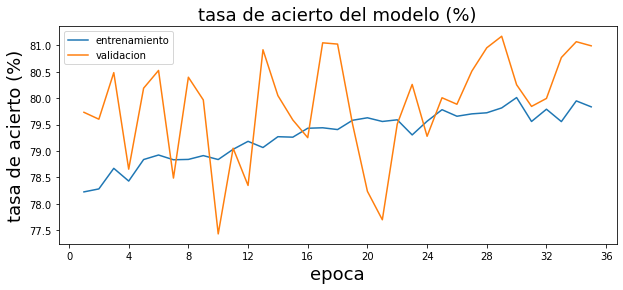

In [ ]:
import os

acum_tr_acc = []
acum_val_acc = []

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]
    
    for e in range(epochs):
        history = model_C1D175.fit(TX_train175, pd.get_dummies(train_Y175), 
                                validation_data=(TX_val175, pd.get_dummies(val_Y175)), 
                                batch_size=batch_size, 
                                epochs=1, verbose=1,
                                callbacks=callbacks_list)
        
        acum_tr_acc = acum_tr_acc + history.history['accuracy']
        acum_val_acc = acum_val_acc + history.history['val_accuracy']
        
        if len(acum_tr_acc) > 1:
            clear_output()
            grafica_entrenamiento(acum_tr_acc, acum_val_acc)

In [ ]:
#Tdatos_TST=tf.convert_to_tensor(test_Xnps, dtype=float, dtype_hint=None, name=None)
#y_pred=model_C1D.predict(Tdatos_TST)
y_pred_vl=model_C1D175.predict(TX_val175)
print(y_pred_vl)

#y_pred_am=np.argmax(y_pred, axis=1)
y_pred_val_am=np.argmax(y_pred_vl, axis=1)
print(y_pred_val_am)

[[0.1402325  0.0229663  0.8368012 ]
 [0.1706836  0.6022269  0.22708939]
 [0.6145033  0.19849055 0.18700606]
 ...
 [0.58864343 0.08241273 0.3289438 ]
 [0.17159285 0.772976   0.05543124]
 [0.97131    0.00281107 0.02587885]]
[2 1 0 ... 0 1 0]


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(val_Y175, y_pred_val_am))
#print(classification_report(test_Y, y_pred_am))

              precision    recall  f1-score   support

           0       0.78      0.95      0.85    469403
           1       0.91      0.81      0.86    219765
           2       0.80      0.38      0.52    154969

    accuracy                           0.81    844137
   macro avg       0.83      0.72      0.74    844137
weighted avg       0.82      0.81      0.79    844137



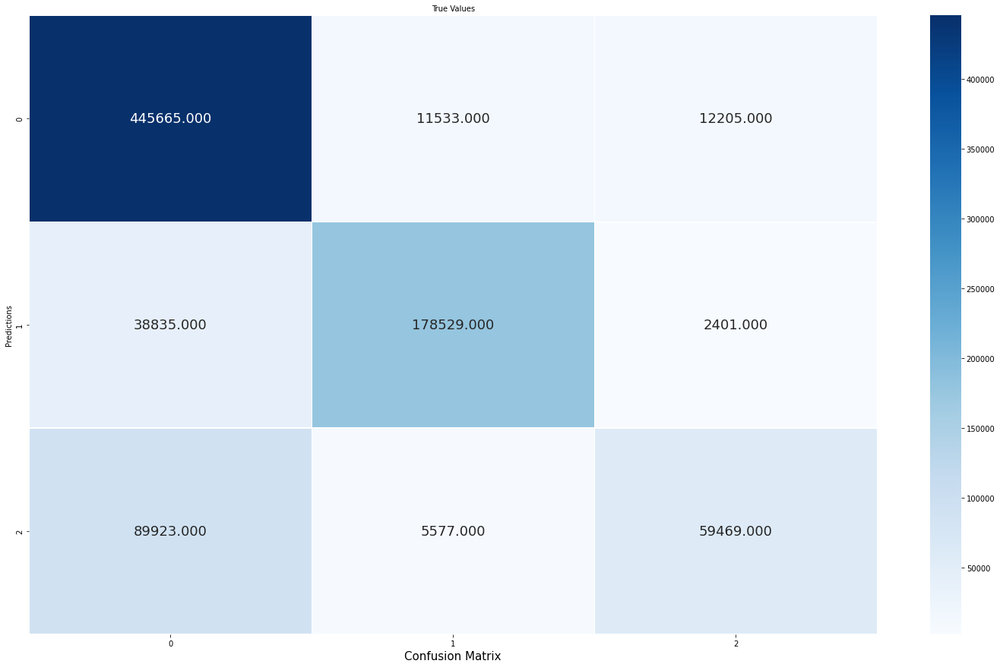

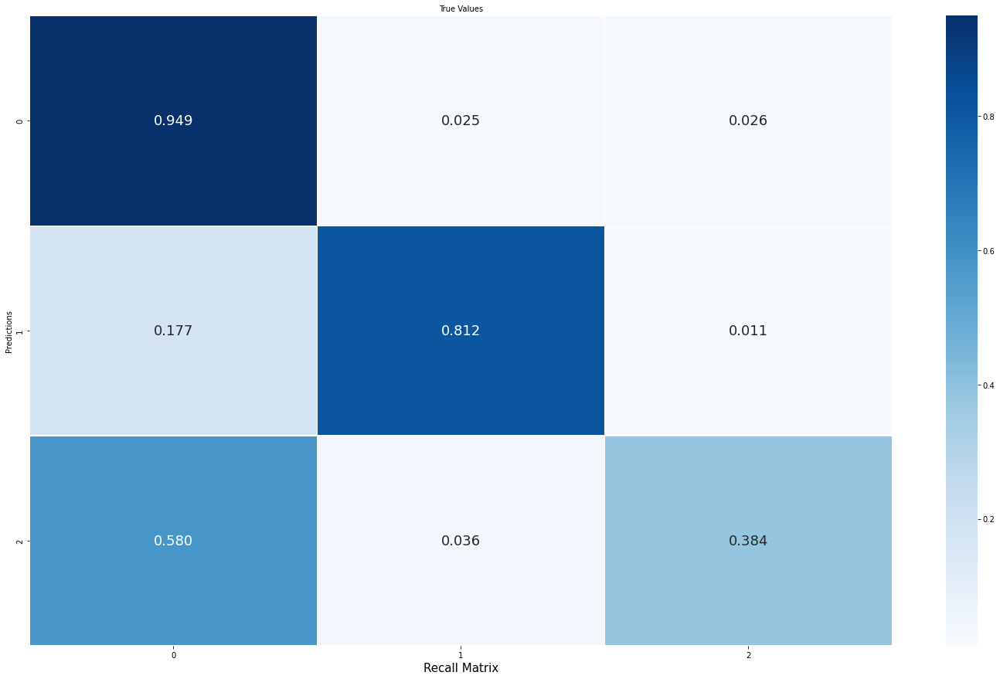

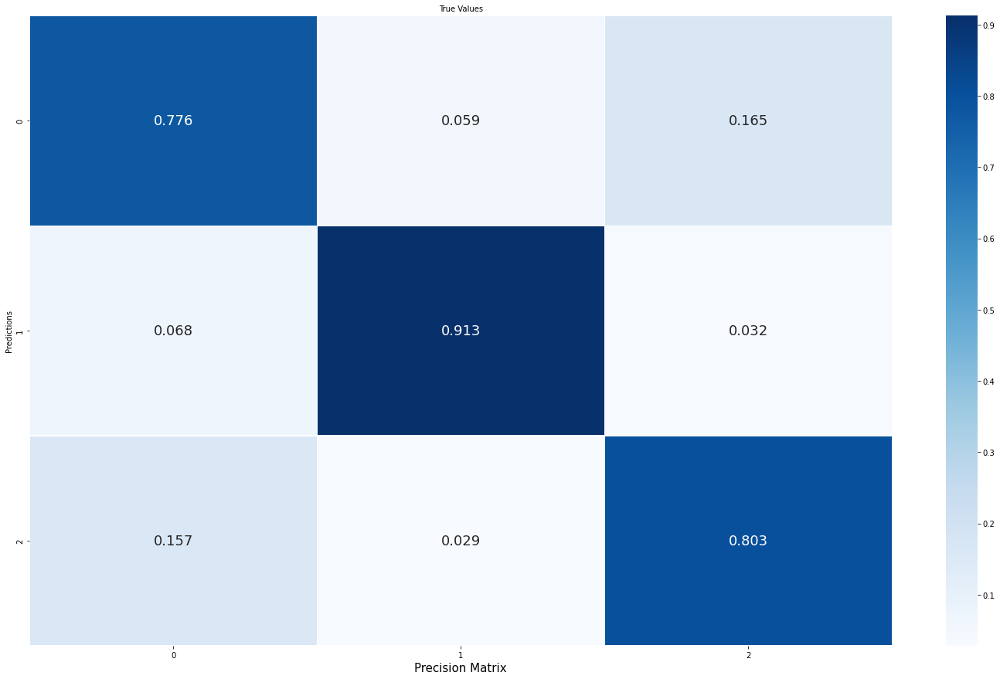

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y175, y_pred_val_am)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

## Entrenamiento y resultados obtenidos con CNN sobre los datos de 2018

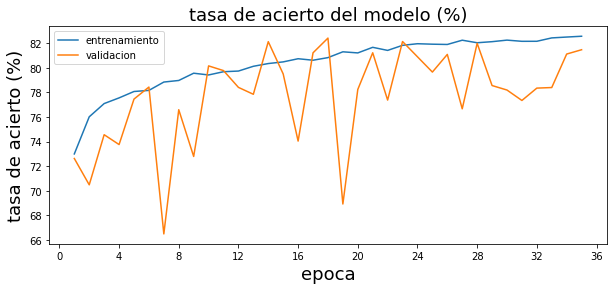

In [ ]:
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

acum_tr_acc1=[]
acum_val_acc1=[]

LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]
    
    for e in range(epochs):
        history = model_C1D185.fit(TX_train185, pd.get_dummies(train_Y185), 
                                validation_data=(TX_val185, pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=1, verbose=1,
                                class_weight=class_dictW185,
                                callbacks=callbacks_list)
        
        acum_tr_acc1 = acum_tr_acc1 + history.history['accuracy']
        acum_val_acc1 = acum_val_acc1 + history.history['val_accuracy']
        
        if len(acum_tr_acc1) > 1:
            clear_output()
            grafica_entrenamiento(acum_tr_acc1, acum_val_acc1)

In [ ]:
#Tdatos_TST=tf.convert_to_tensor(test_Xnps, dtype=float, dtype_hint=None, name=None)
#y_pred=model_C1D.predict(Tdatos_TST)
y_pred_vl=model_C1D185.predict(TX_val185)
print(y_pred_vl)

#y_pred_am=np.argmax(y_pred, axis=1)
y_pred_val_am=np.argmax(y_pred_vl, axis=1)
print(y_pred_val_am)

[[9.9393702e-01 3.1630886e-03 2.8998656e-03]
 [2.4442707e-01 7.5534117e-01 2.3181694e-04]
 [2.7920306e-01 1.0013477e-03 7.1979558e-01]
 ...
 [9.9936134e-01 6.1021250e-04 2.8467453e-05]
 [1.0751288e-01 2.4744640e-03 8.9001268e-01]
 [3.6943663e-02 3.9105534e-04 9.6266520e-01]]
[0 1 2 ... 0 2 2]


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(val_Y185, y_pred_val_am))
#print(classification_report(test_Y, y_pred_am))

              precision    recall  f1-score   support

           0       0.91      0.72      0.80    399993
           1       0.84      0.88      0.86    215755
           2       0.70      0.93      0.79    228493

    accuracy                           0.81    844241
   macro avg       0.82      0.84      0.82    844241
weighted avg       0.83      0.81      0.81    844241



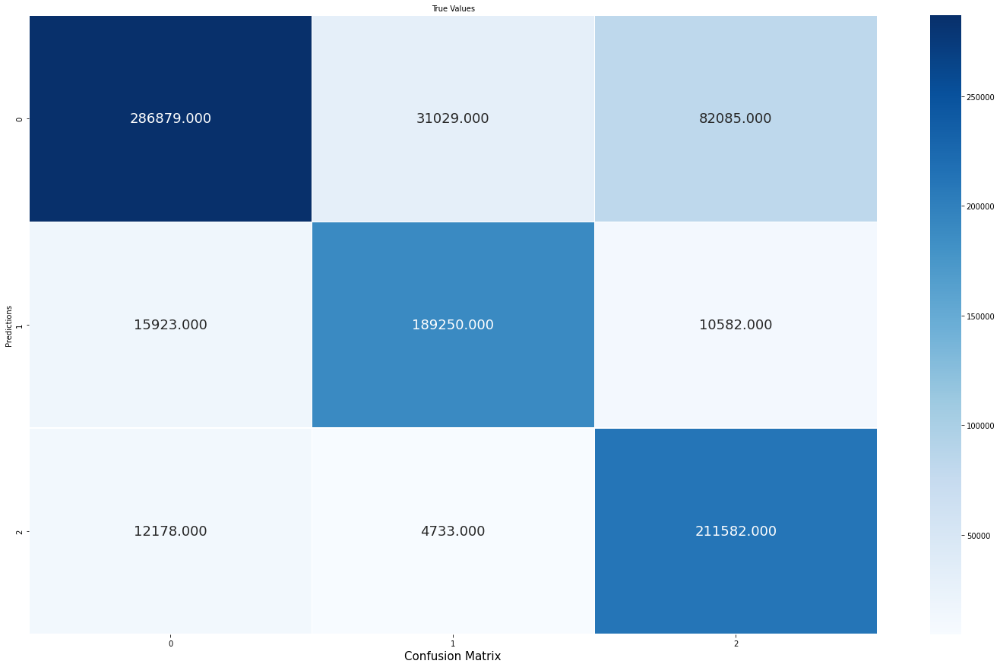

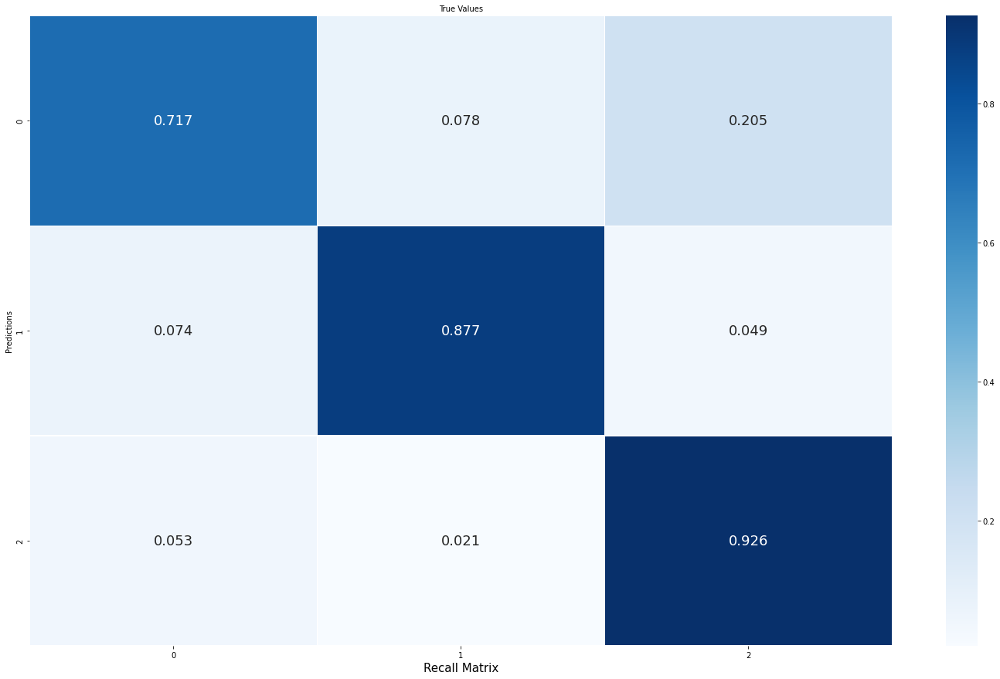

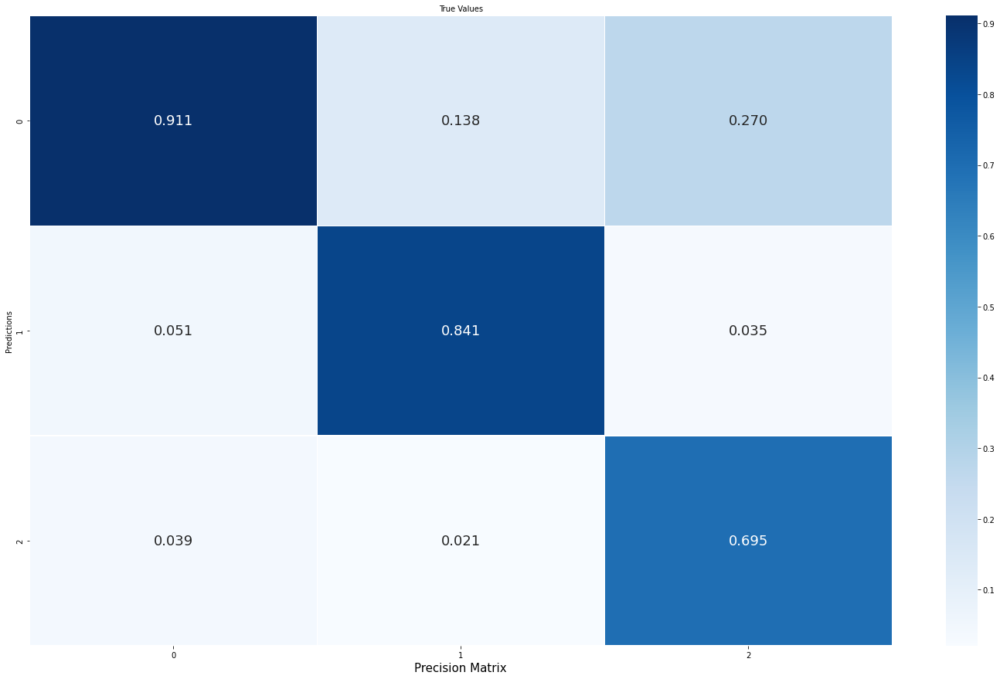

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y185, y_pred_val_am)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

## Entrenamiento y resultados obtenidos con CNN sobre los datos de 2019

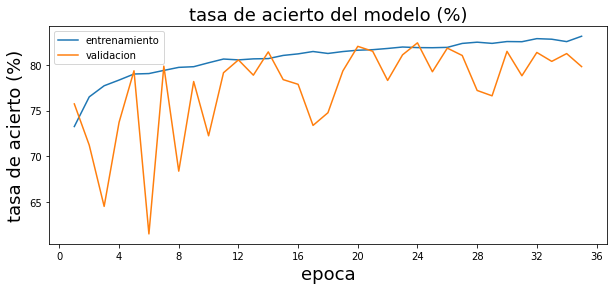

In [ ]:
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

acum_tr_acc=[]
acum_val_acc=[]


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]
    
    for e in range(epochs):
        history = model_C1D195.fit(TX_train195, pd.get_dummies(train_Y195), 
                                validation_data=(TX_val195, pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=1, verbose=1,
                                class_weight=class_dictW195,
                                callbacks=callbacks_list)
        
        acum_tr_acc = acum_tr_acc + history.history['accuracy']
        acum_val_acc = acum_val_acc + history.history['val_accuracy']
        
        if len(acum_tr_acc) > 1:
            clear_output()
            grafica_entrenamiento(acum_tr_acc, acum_val_acc)

In [ ]:
#Tdatos_TST=tf.convert_to_tensor(test_Xnps, dtype=float, dtype_hint=None, name=None)
#y_pred=model_C1D.predict(Tdatos_TST)
y_pred_vl=model_C1D195.predict(TX_val195)
print(y_pred_vl)

#y_pred_am=np.argmax(y_pred, axis=1)
y_pred_val_am=np.argmax(y_pred_vl, axis=1)
print(y_pred_val_am)

[[3.21961269e-02 4.83972626e-03 9.62964177e-01]
 [4.08071876e-02 1.54412200e-03 9.57648695e-01]
 [7.65217049e-03 1.06620579e-03 9.91281629e-01]
 ...
 [5.16095996e-01 4.70432758e-01 1.34712085e-02]
 [9.97451365e-01 8.89032206e-04 1.65953441e-03]
 [4.80089903e-01 2.38627866e-02 4.96047407e-01]]
[2 2 2 ... 0 0 2]


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(val_Y195, y_pred_val_am))
#print(classification_report(test_Y, y_pred_am))

              precision    recall  f1-score   support

           0       0.89      0.57      0.69    299737
           1       0.83      0.88      0.85    220733
           2       0.74      0.96      0.83    324605

    accuracy                           0.80    845075
   macro avg       0.82      0.80      0.79    845075
weighted avg       0.82      0.80      0.79    845075



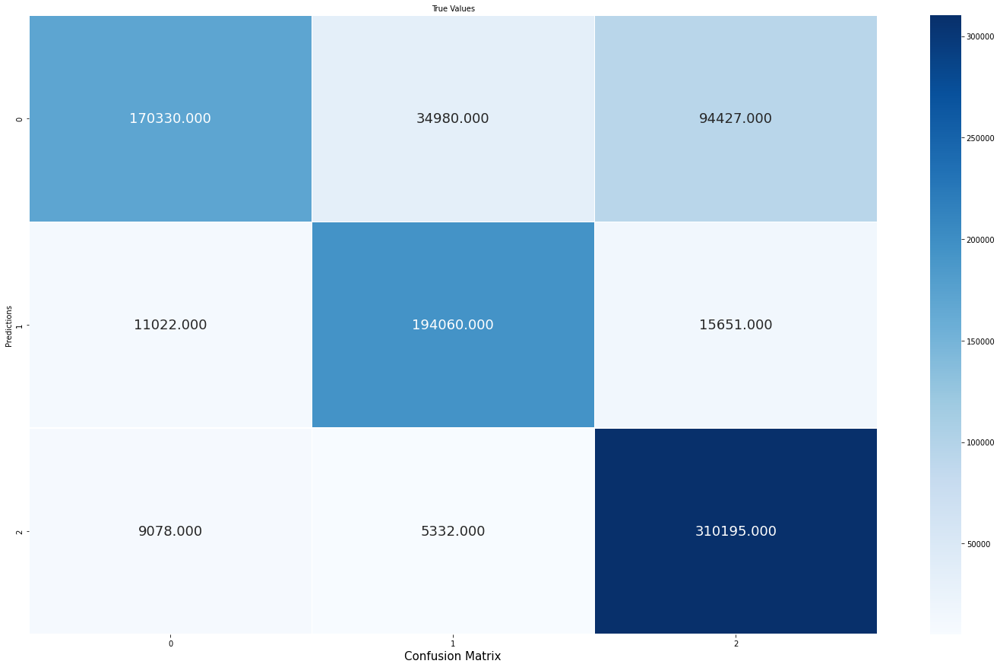

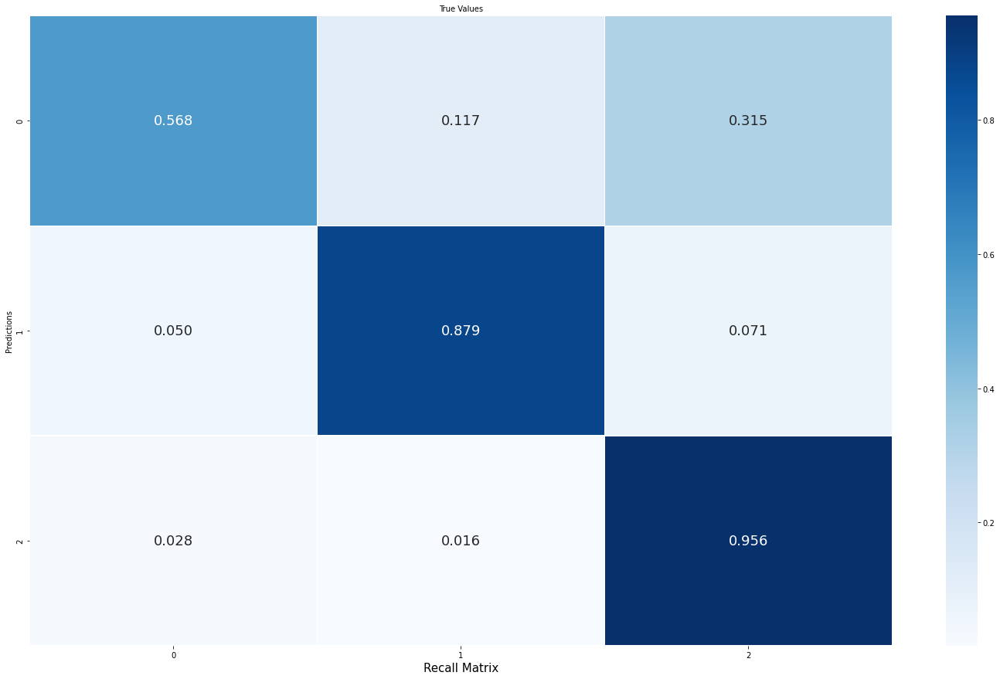

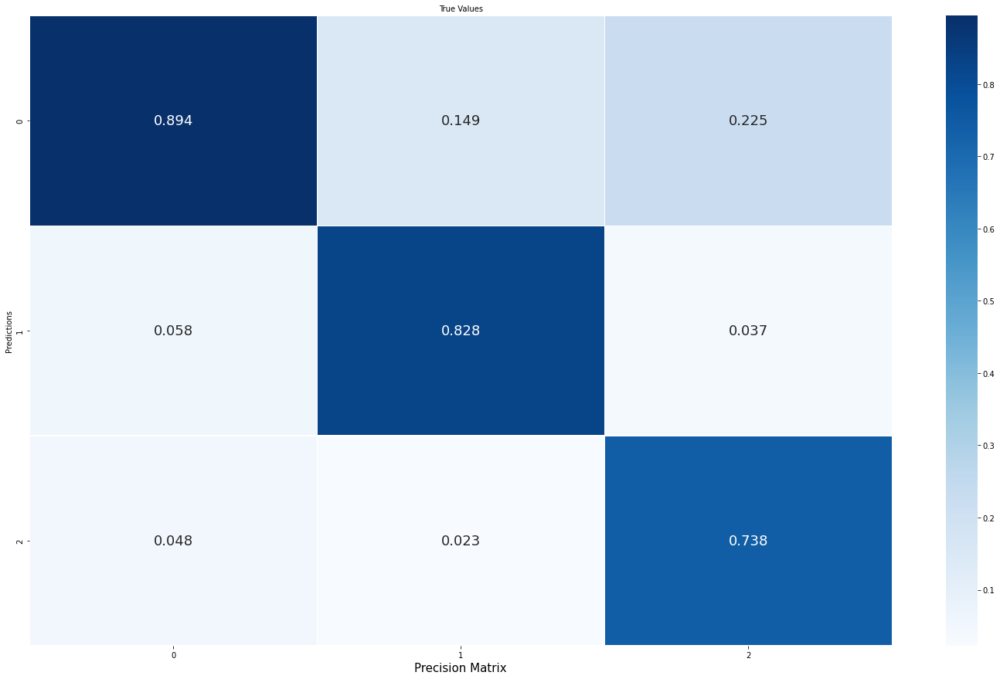

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y195, y_pred_val_am)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

#Modelo Light Gradient Boosting Classifier

##Random Grid Search con LGBC sobre datos de 2017

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from matplotlib import pyplot

# Number of trees in random forest
n_estimators = [100, 200, 300, 400]
# Number of features to consider at every split
class_weight=[None, class_weight175]

# Maximum number of levels in tree
max_depth = [-1, 10,15,20,25,30,35]

#Learning rate
learning_rate=[0.1, 0.05, 0.01, 0.001]

#num leaves
num_leaves=[30, 35, 40, 45, 50, 55, 60]

#subsample for bin
subsample_for_bin=[1000, 5000, 10000, 15000, 20000, 25000]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'class_weight': class_weight,
               'max_depth': max_depth,
               'learning_rate': learning_rate,
               'num_leaves': num_leaves,
               'subsample_for_bin': subsample_for_bin}

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
lgbc = LGBMClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
lgbc_random17= RandomizedSearchCV(estimator = lgbc, param_distributions = random_grid, scoring='balanced_accuracy' ,n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbc_random17.fit(train_X175, train_Y175)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   37.6s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 11.9min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective=None,
                                            random_state=None, reg_alpha=0.0,
                                            reg_lambda=0.0, sile...
                                                         array([0.59956815, 1.28330445, 1.80866308])],
                      

In [ ]:
lgbc_random17.best_params_

{'class_weight': None,
 'learning_rate': 0.1,
 'max_depth': 35,
 'n_estimators': 300,
 'num_leaves': 55,
 'subsample_for_bin': 5000}

In [ ]:
lgbc_random17.cv_results_

In [ ]:
lgbc_random17.best_estimator_

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from matplotlib import pyplot

model=LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

model.fit(train_X175, train_Y175)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
model=lgbc_random17.best_estimator_
model.fit(train_X175, train_Y175)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
lgbc_random17.best_score_

0.7670867862663469

In [ ]:
#y_pred=model.predict(np.array(ttrain_X))
#y_pred_train=model.predict(np.array(ttrain_X))
y_pred_val=model.predict(np.array(val_X175))
#y_pred_test=model.predict(np.array(test_X))

##Resultados obtenidos sobre los datos de 2017

In [ ]:
from sklearn.metrics import classification_report
#print(classification_report(ttrain_Y, y_pred_train))
print(classification_report(val_Y175, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.82      0.91      0.86    469403
           1       0.90      0.86      0.88    219765
           2       0.75      0.54      0.63    154969

    accuracy                           0.83    844137
   macro avg       0.82      0.77      0.79    844137
weighted avg       0.83      0.83      0.82    844137



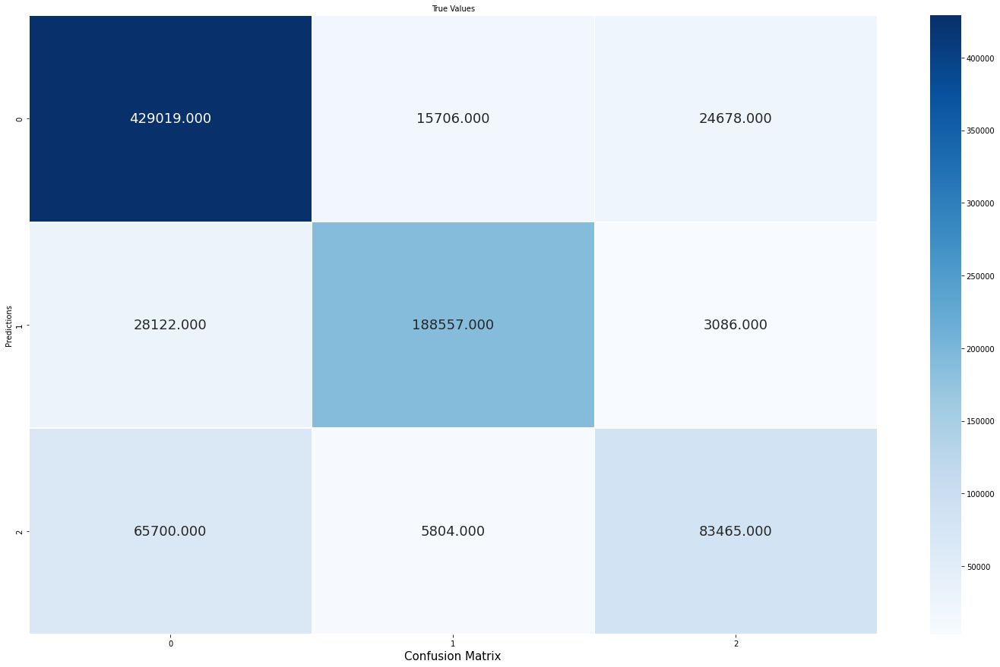

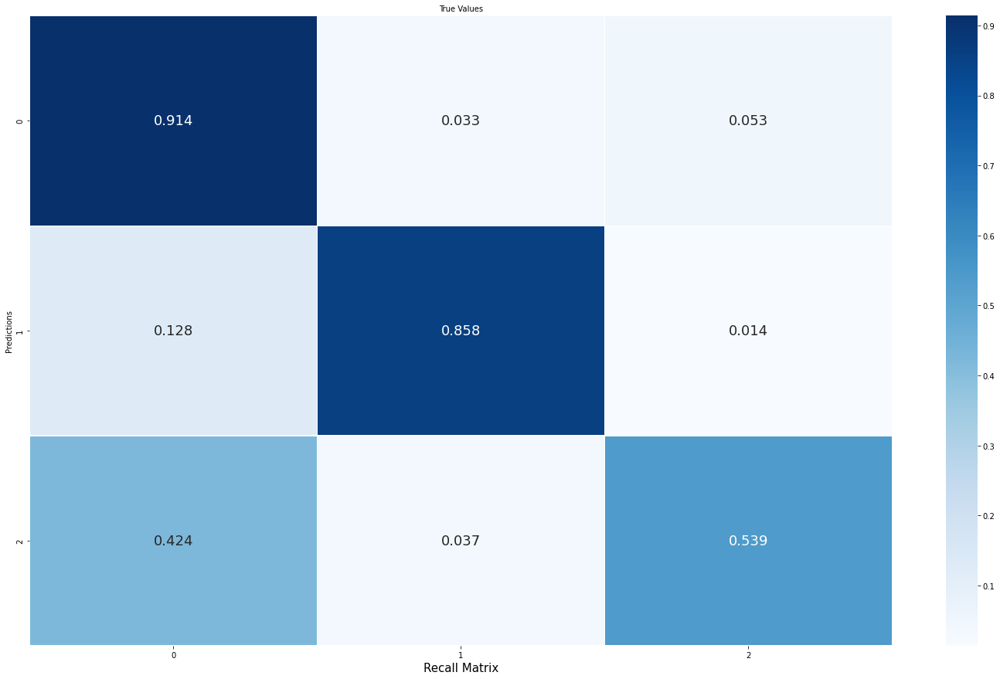

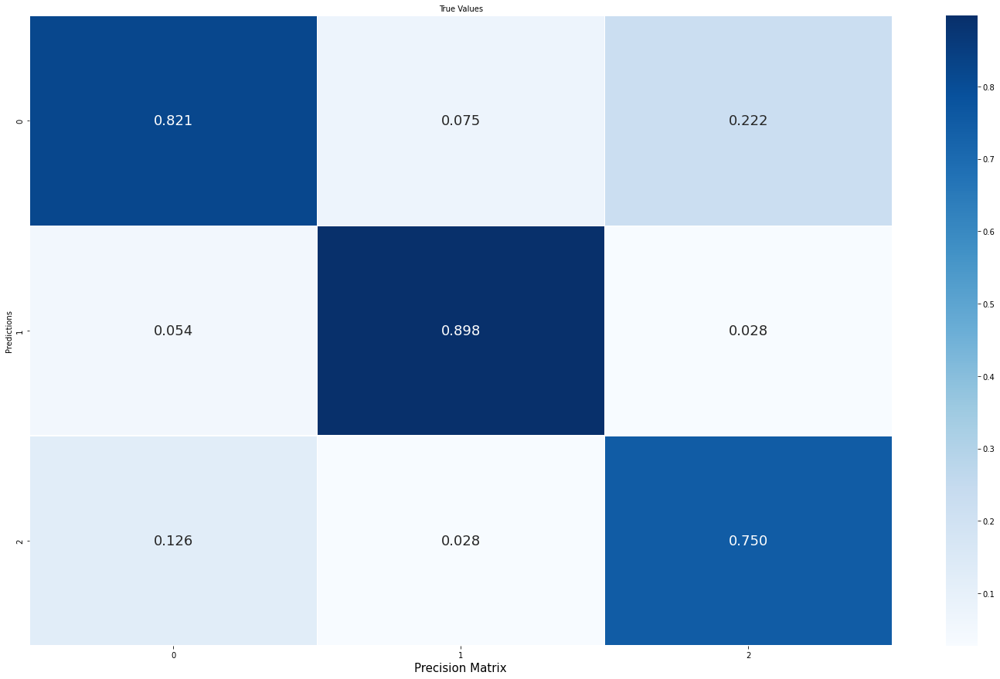

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y175, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Importancia de características en LGBC sobre datos de 2017

In [ ]:
!pip install eli5

In [ ]:
for i in range(22):
  val_X175.iloc[:,i]=pd.to_numeric(val_X175.iloc[:,i])

In [ ]:
import eli5

from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state=1).fit(train_X175, train_Y175)

eli5.show_weights(perm, feature_names= val_X175.columns.tolist())

Weight,Feature
0.0862 ± 0.0024,I170509
0.0681 ± 0.0015,I170615
0.0660 ± 0.0011,I170526
0.0465 ± 0.0013,I170630
0.0433 ± 0.0017,I170406
0.0408 ± 0.0022,I170208
0.0397 ± 0.0013,I170320
0.0290 ± 0.0019,I171003
0.0264 ± 0.0021,I170911
0.0263 ± 0.0016,I170814


In [ ]:
!pip install pdpbox

     |████████████████████████████████| 34.0 MB 67 kB/s 
     |████████████████████████████████| 13.1 MB 32.1 MB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.1-py3-none-any.whl size=35758225 sha256=d84c0efcef367f01fa3b7b0fdce9a0018f48b65c3a7e3ee1cc10a4a658c92b9c
  Stored in directory: /root/.cache/pip/wheels/f4/d0/1a/b80035625c53131f52906a6fc4dd690d8efd2bf8af6a4015eb
Successfully built pdpbox
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


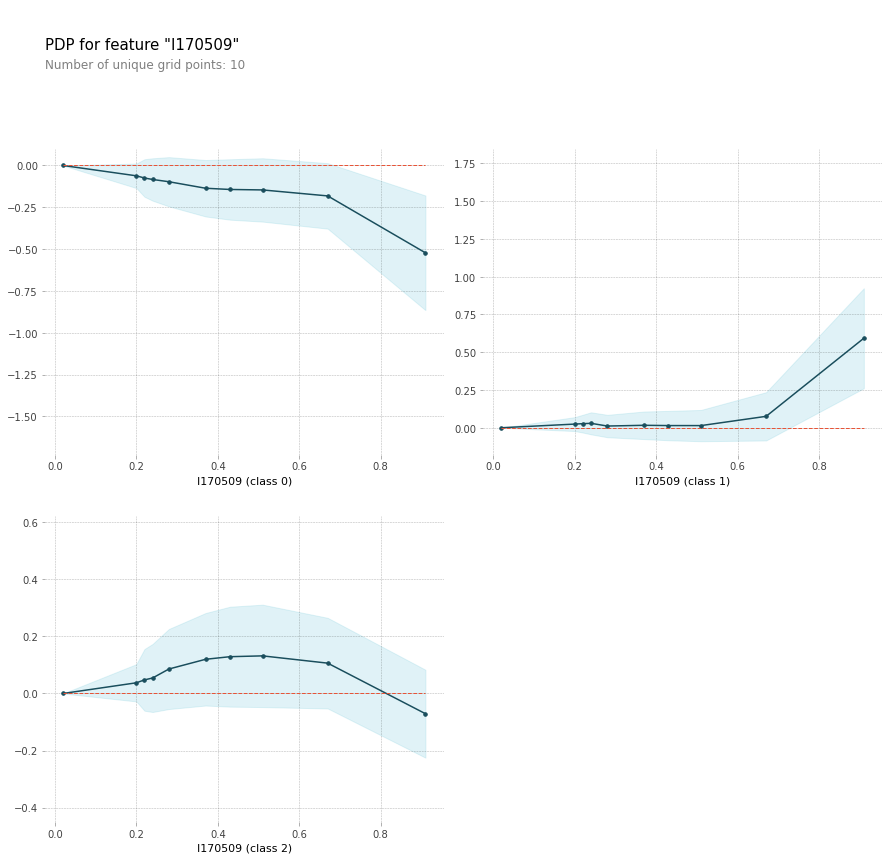

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='I170509'
feature_names=val_X175.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X175, model_features=val_X175.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

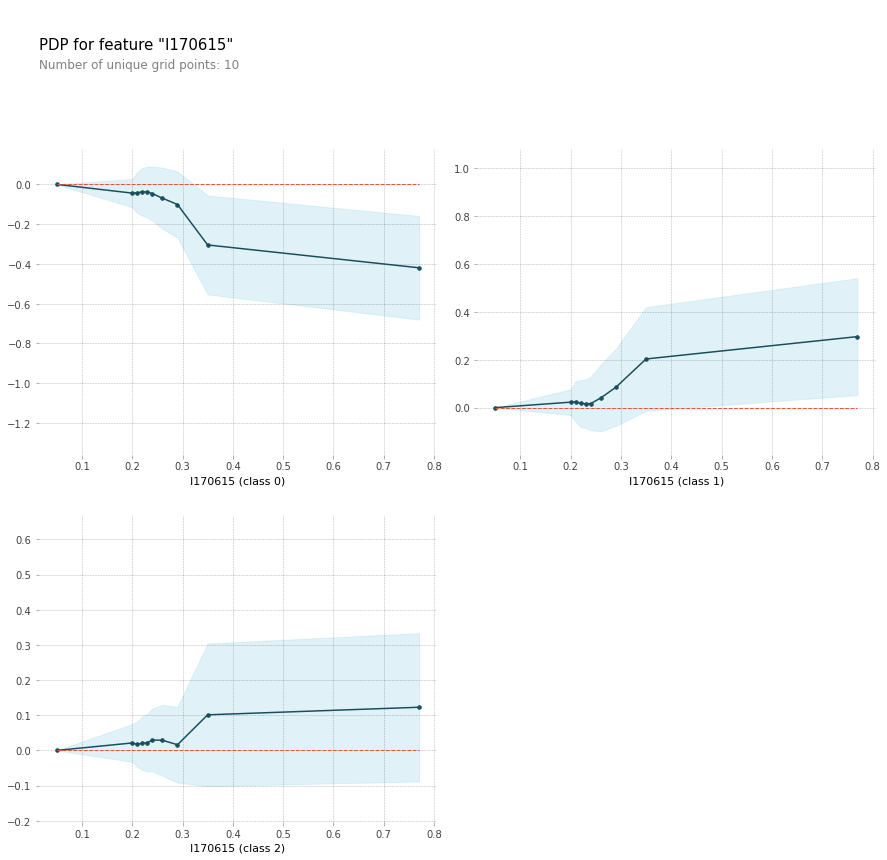

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='I170615'
feature_names=val_X175.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X175, model_features=val_X175.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

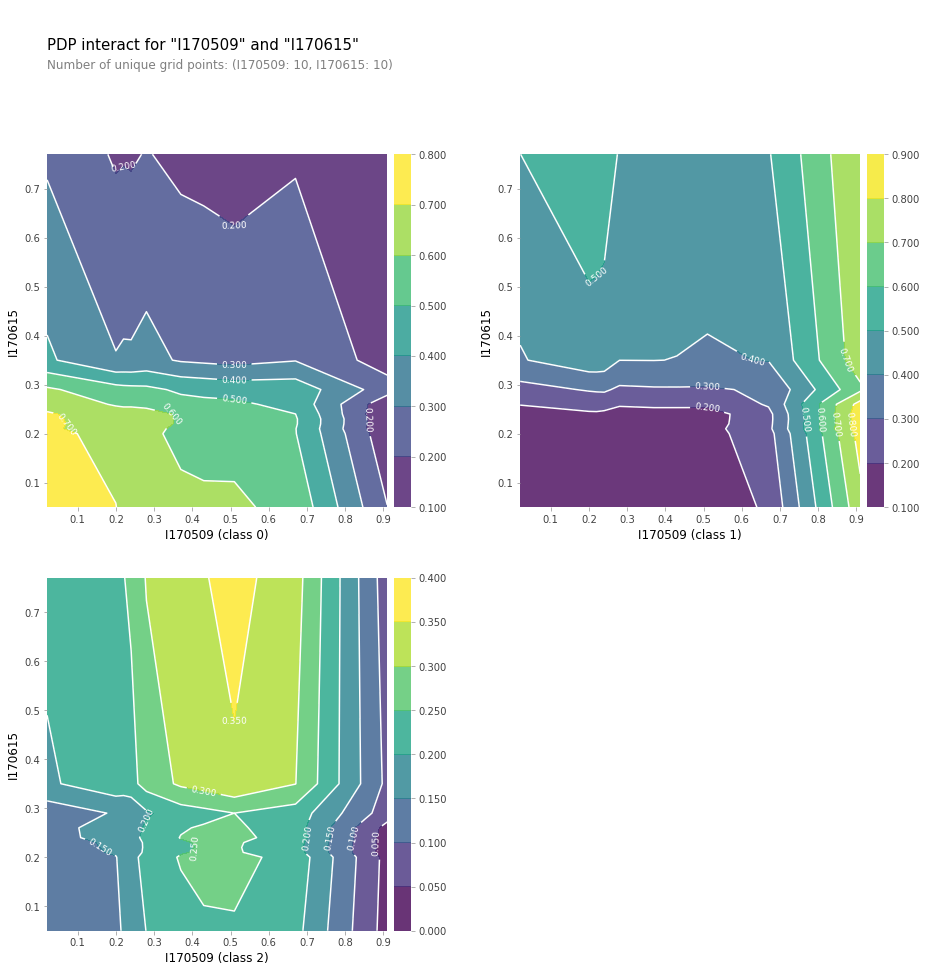

In [ ]:
features_to_plot=['I170509', 'I170615']
inter1=pdp.pdp_interact(model=model, dataset=val_X175, model_features=feature_names, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot)
plt.show()

##Explicabilidad con LGBC sobre los datos de 2017

In [ ]:
!pip install shap

     |████████████████████████████████| 356 kB 5.1 MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491654 sha256=cfc1207b5fd496b92a17106f20dadff3264f7426a9abd6e60d8520459c2ed715
  Stored in directory: /root/.cache/pip/wheels/ca/25/8f/6ae5df62c32651cd719e972e738a8aaa4a87414c4d2b14c9c0
Successfully built shap


In [ ]:
import shap

row_to_show = 14

data_for_prediction=val_X175.iloc[row_to_show]
data_for_prediction_array = data_for_prediction.values.reshape(1,-1)
print(model.predict_proba(data_for_prediction_array))



[[0.13685192 0.51545934 0.34768873]]


In [ ]:
k_explainer= shap.KernelExplainer(model.predict_proba, train_X175.iloc[0:50, :])
k_shap_values=k_explainer.shap_values(data_for_prediction)


In [ ]:
#Sobre Clase de Secano
shap.initjs()
shap.force_plot(k_explainer.expected_value[0], k_shap_values[0], data_for_prediction)

In [ ]:
#Sobre Clase de Regadío
shap.initjs()
shap.force_plot(k_explainer.expected_value[1], k_shap_values[1], data_for_prediction)


In [ ]:
#Sobre Clase de Suelo
shap.initjs()
shap.force_plot(k_explainer.expected_value[2], k_shap_values[2], data_for_prediction)

  0%|          | 0/1500 [00:00<?, ?it/s]

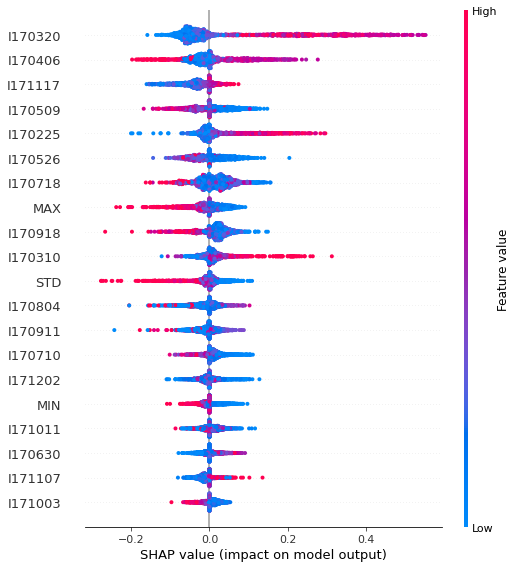

In [ ]:
#Sobre clase Secano

shap.initjs()

shap_values=k_explainer.shap_values(val_X175.iloc[0:1500, :])
shap.summary_plot(shap_values[0], val_X175.iloc[0:1500, :])

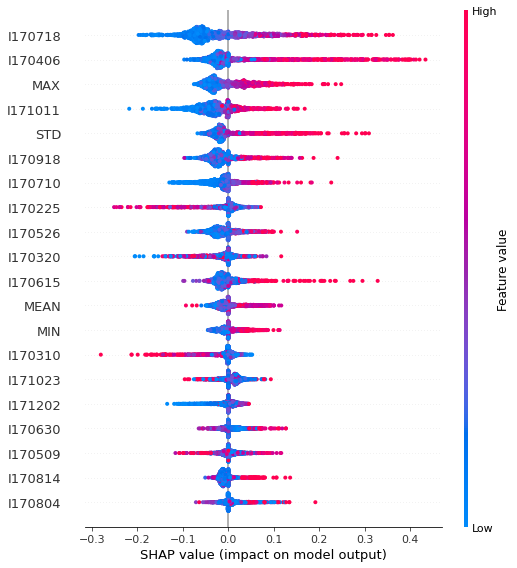

In [ ]:
#Sobre Clase Regadío
shap.initjs()


shap.summary_plot(shap_values[1], val_X175.iloc[0:1500, :])

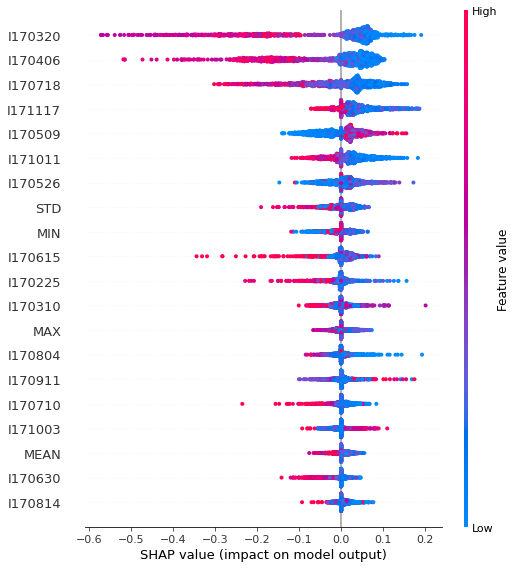

In [ ]:
#Sobre clase Suelo

shap.initjs()

#shap_values=k_explainer.shap_values(val_X175.iloc[0:1500, :])
shap.summary_plot(shap_values[2], val_X175.iloc[0:1500, :])

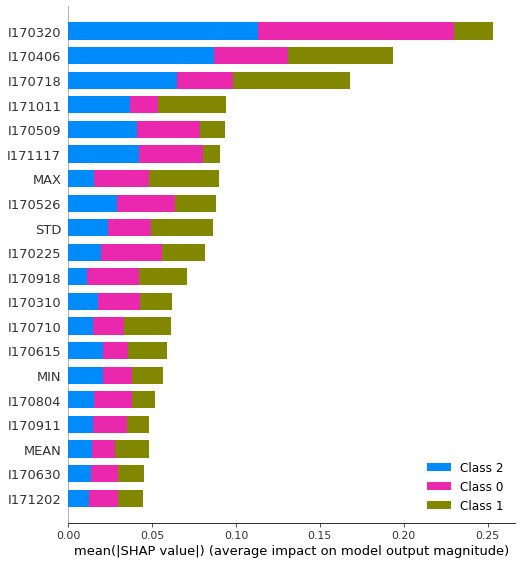

In [ ]:
shap.summary_plot(shap_values, val_X175, plot_type='bar')

#shap.dependence_plot('I170526', shap_values, val_X175.iloc[0:805031,:])

##Random Grid Search con LGBC sobre los datos de 2018

In [ ]:
# Number of trees in random forest
n_estimators = [100, 200, 300, 400]
# Number of features to consider at every split
class_weight=[None, class_weight185]

# Maximum number of levels in tree
max_depth = [-1, 10,15,20,25,30,35]

#Learning rate
learning_rate=[0.1, 0.05, 0.01, 0.001]

#num leaves
num_leaves=[30, 35, 40, 45, 50, 55, 60]

#subsample for bin
subsample_for_bin=[1000, 5000, 10000, 15000, 20000, 25000]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'class_weight': class_weight,
               'max_depth': max_depth,
               'learning_rate': learning_rate,
               'num_leaves': num_leaves,
               'subsample_for_bin': subsample_for_bin}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Use the random grid to search for best hyperparameters
# First create the base model to tune
lgbc = LGBMClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
lgbc_random18= RandomizedSearchCV(estimator = lgbc, param_distributions = random_grid, scoring='balanced_accuracy' ,n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbc_random18.fit(train_X185, train_Y185)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  41 tasks      | elapsed:   55.9s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 365 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 13.3min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective=None,
                                            random_state=None, reg_alpha=0.0,
                                            reg_lambda=0.0, sile...
                                                         array([0.69771057, 1.3081611 , 1.24640242])],
                      

In [ ]:
lgbc_random18.best_params_

{'class_weight': None,
 'learning_rate': 0.1,
 'max_depth': 35,
 'n_estimators': 300,
 'num_leaves': 55,
 'subsample_for_bin': 5000}

In [ ]:
lgbc_random18.best_estimator_

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
model = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)
model.fit(np.array(train_X185, dtype=float), train_Y185)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
y_pred_val=model.predict(val_X185)

##Resultados obtenidos sobre los datos de 2018

In [ ]:
from sklearn.metrics import classification_report
#print(classification_report(ttrain_Y, y_pred_train))
print(classification_report(val_Y185, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.85      0.87      0.86    399993
           1       0.91      0.85      0.87    215755
           2       0.82      0.82      0.82    228493

    accuracy                           0.85    844241
   macro avg       0.86      0.85      0.85    844241
weighted avg       0.85      0.85      0.85    844241



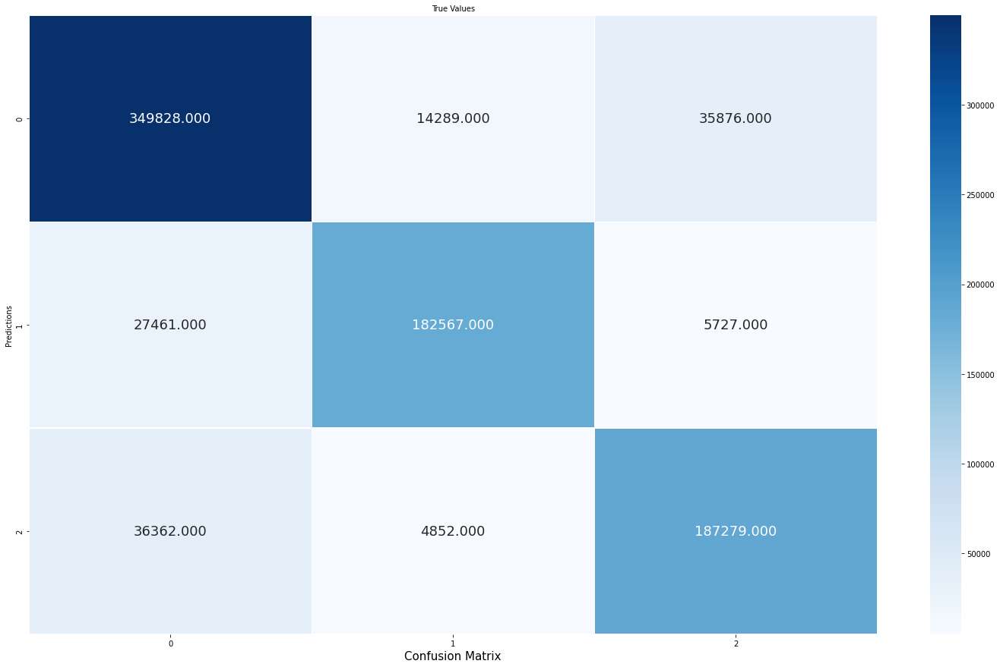

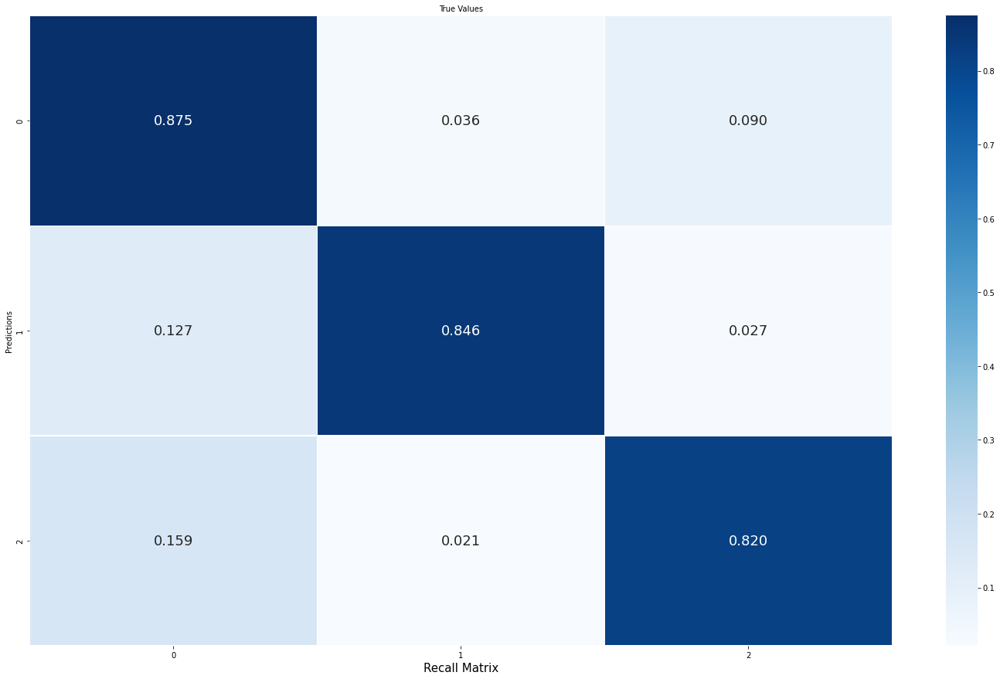

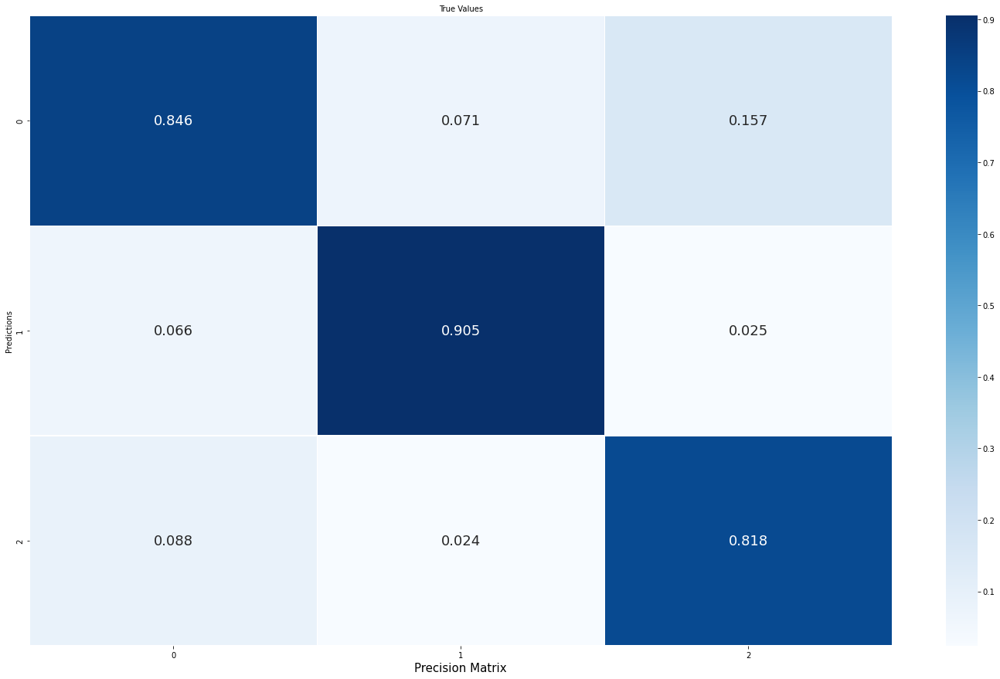

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y185, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Importancia de características en LGBC sobre datos de 2018

In [ ]:
!pip install eli5

     |████████████████████████████████| 106 kB 5.1 MB/s 


In [ ]:
for i in range(22):
  val_X185.iloc[:,i]=pd.to_numeric(val_X185.iloc[:,i])

In [ ]:
import eli5

from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state=1).fit(train_X185, train_Y185)

eli5.show_weights(perm, feature_names= val_X185.columns.tolist())

Weight,Feature
0.1438 ± 0.0016,I180516
0.1050 ± 0.0009,I180414
0.0638 ± 0.0018,I180426
0.0344 ± 0.0008,I180901
0.0340 ± 0.0016,I180730
0.0319 ± 0.0018,I180613
0.0317 ± 0.0006,I180705
0.0306 ± 0.0009,I181016
0.0304 ± 0.0011,I180718
0.0287 ± 0.0016,I180322


In [ ]:
!pip install pdpbox

     |████████████████████████████████| 34.0 MB 89 kB/s 
     |████████████████████████████████| 13.1 MB 42.6 MB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.1-py3-none-any.whl size=35758225 sha256=0ea2a68f3e19a47323b1d40c4eb111ded55f5aae1216522a8d6a552aa755d2f4
  Stored in directory: /root/.cache/pip/wheels/f4/d0/1a/b80035625c53131f52906a6fc4dd690d8efd2bf8af6a4015eb
Successfully built pdpbox
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


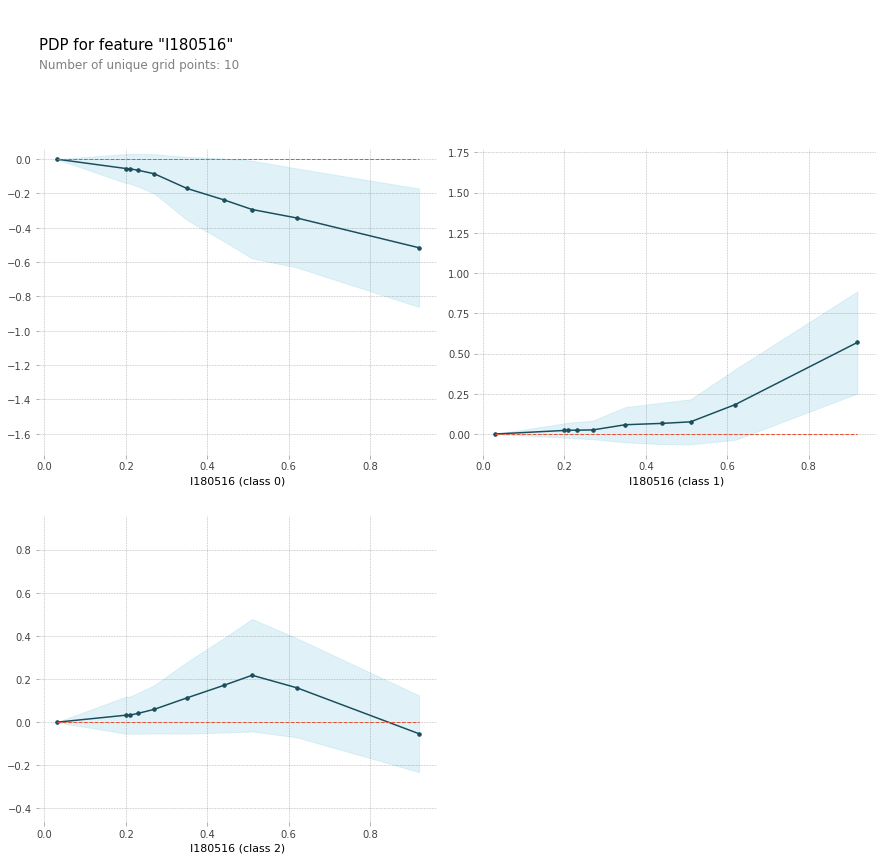

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='I180516'
feature_names=val_X185.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X185, model_features=val_X185.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

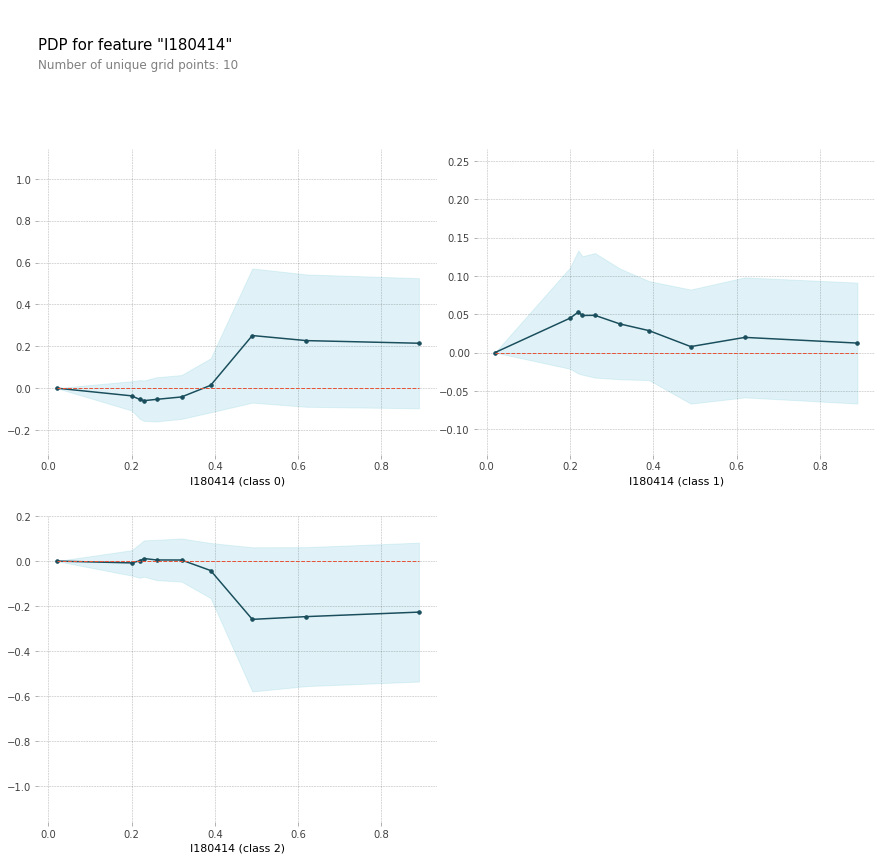

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='I180414'
feature_names=val_X185.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X185, model_features=val_X185.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

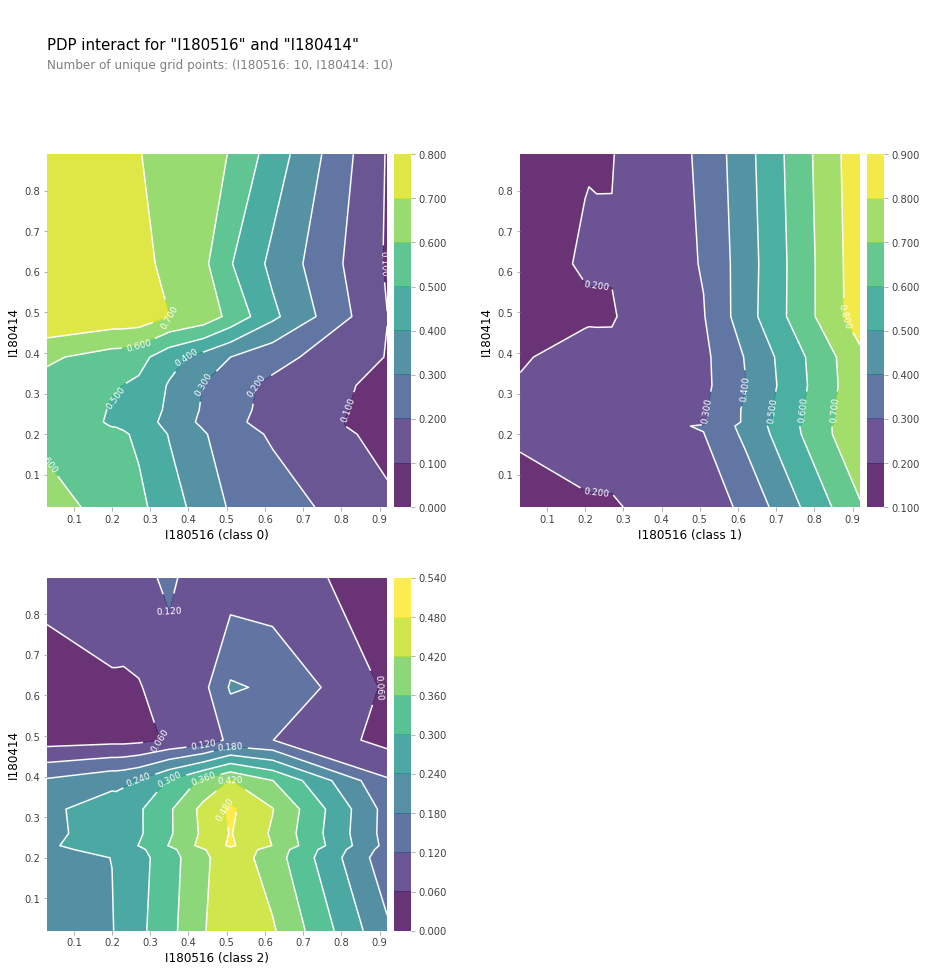

In [ ]:
features_to_plot=['I180516', 'I180414']
inter1=pdp.pdp_interact(model=model, dataset=val_X185, model_features=feature_names, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot)
plt.show()

##Explicabilidad con LGBC sobre los datos de 2018

In [ ]:
import shap

row_to_show = 30

data_for_prediction=val_X185.iloc[row_to_show]
data_for_prediction_array = data_for_prediction.values.reshape(1,-1)
print(model.predict_proba(data_for_prediction_array))

[[9.98647861e-01 1.32587739e-03 2.62618382e-05]]


In [ ]:
k_explainer= shap.KernelExplainer(model.predict_proba, train_X185.iloc[0:50, :])
k_shap_values=k_explainer.shap_values(data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[0], k_shap_values[0], data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[1], k_shap_values[1], data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[2], k_shap_values[2], data_for_prediction)

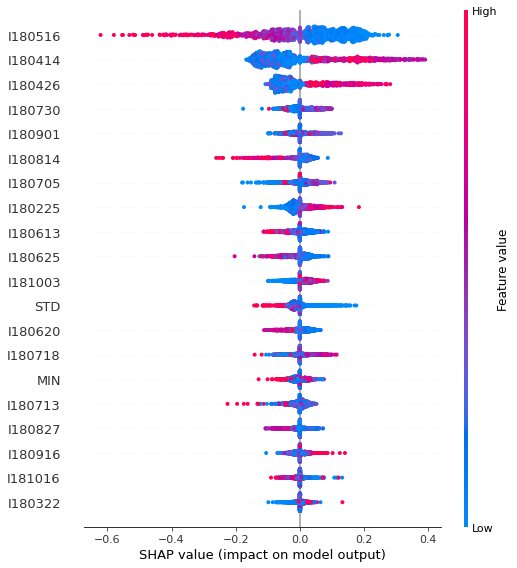

In [ ]:
shap.initjs()

#shap_values=k_explainer.shap_values(val_X185.iloc[0:1500, :])
shap.summary_plot(shap_values[0], val_X185.iloc[0:1500, :])

  0%|          | 0/1500 [00:00<?, ?it/s]

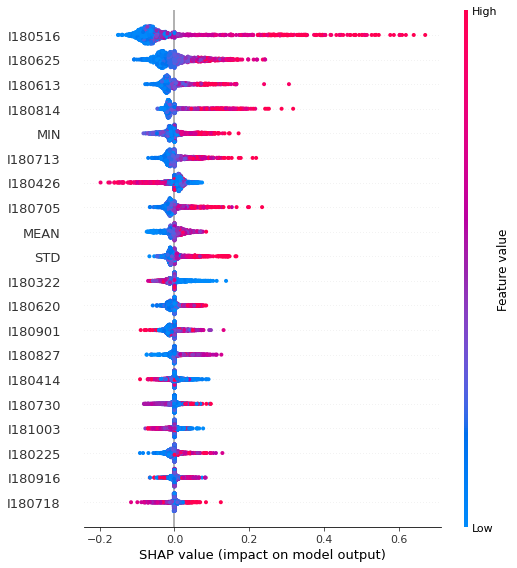

In [ ]:
shap.initjs()

shap_values=k_explainer.shap_values(val_X185.iloc[0:1500, :])
shap.summary_plot(shap_values[1], val_X185.iloc[0:1500, :])

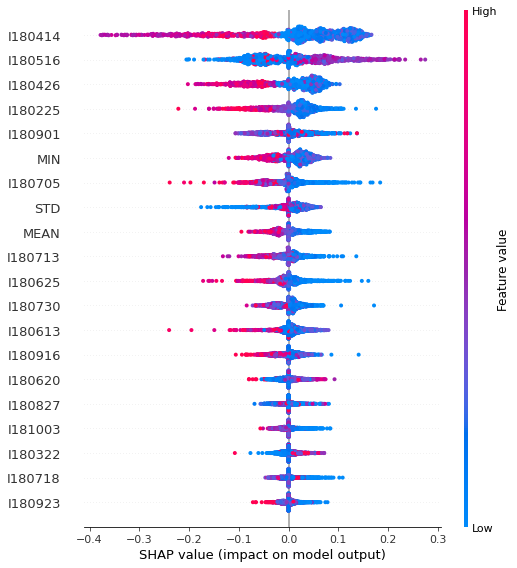

In [ ]:
shap.initjs()

#shap_values=k_explainer.shap_values(val_X185.iloc[0:1500, :])
shap.summary_plot(shap_values[2], val_X185.iloc[0:1500, :])

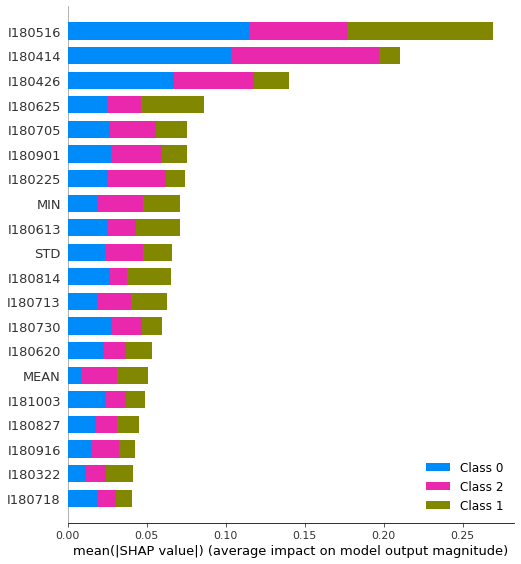

In [ ]:
shap.initjs()

shap.summary_plot(shap_values, val_X185, plot_type='bar')

##Random Grid Search con LGBC sobre datos de 2019

In [ ]:
# Number of trees in random forest
n_estimators = [100, 200, 300, 400]
# Number of features to consider at every split
class_weight=[None, class_weight195]

# Maximum number of levels in tree
max_depth = [-1, 10,15,20,25,30,35]

#Learning rate
learning_rate=[0.1, 0.05, 0.01, 0.001]

#num leaves
num_leaves=[30, 35, 40, 45, 50, 55, 60]

#subsample for bin
subsample_for_bin=[1000, 5000, 10000, 15000, 20000, 25000]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'class_weight': class_weight,
               'max_depth': max_depth,
               'learning_rate': learning_rate,
               'num_leaves': num_leaves,
               'subsample_for_bin': subsample_for_bin}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Use the random grid to search for best hyperparameters
# First create the base model to tune
lgbc = LGBMClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
lgbc_random19= RandomizedSearchCV(estimator = lgbc, param_distributions = random_grid, scoring='balanced_accuracy' ,n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbc_random19.fit(train_X195, train_Y195)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   44.2s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 13.6min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective=None,
                                            random_state=None, reg_alpha=0.0,
                                            reg_lambda=0.0, sile...
                                                         array([0.94358876, 1.26639333, 0.86913276])],
                      

In [ ]:
lgbc_random19.best_params_

{'class_weight': None,
 'learning_rate': 0.1,
 'max_depth': 35,
 'n_estimators': 300,
 'num_leaves': 55,
 'subsample_for_bin': 5000}

In [ ]:
lgbc_random19.best_estimator_

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
model = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)
model.fit(train_X195, train_Y195)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
y_pred_val=model.predict(val_X195)

##Resultados obtenidos sobre los datos de 2019

In [ ]:
from sklearn.metrics import classification_report
#print(classification_report(ttrain_Y, y_pred_train))
print(classification_report(val_Y195, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.80      0.81      0.80    299737
           1       0.90      0.84      0.87    220733
           2       0.85      0.87      0.86    324605

    accuracy                           0.84    845075
   macro avg       0.85      0.84      0.84    845075
weighted avg       0.84      0.84      0.84    845075



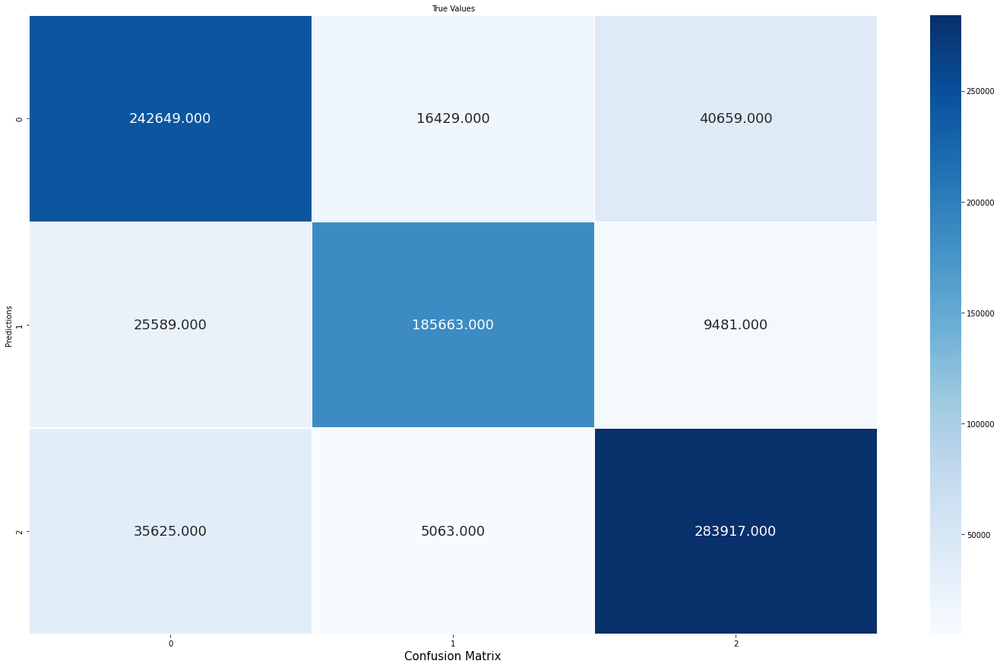

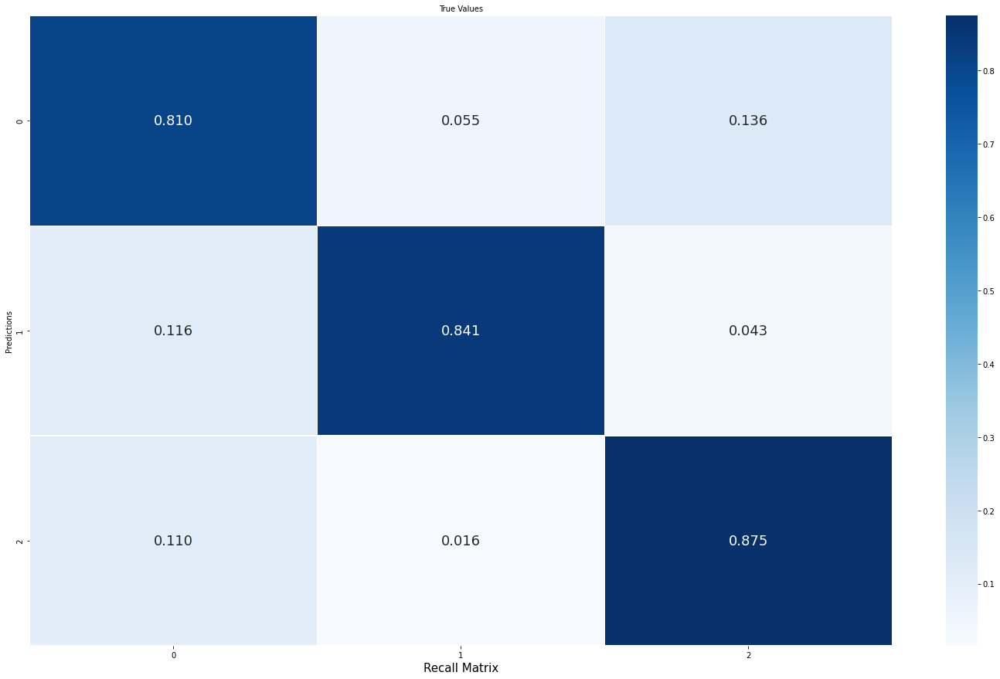

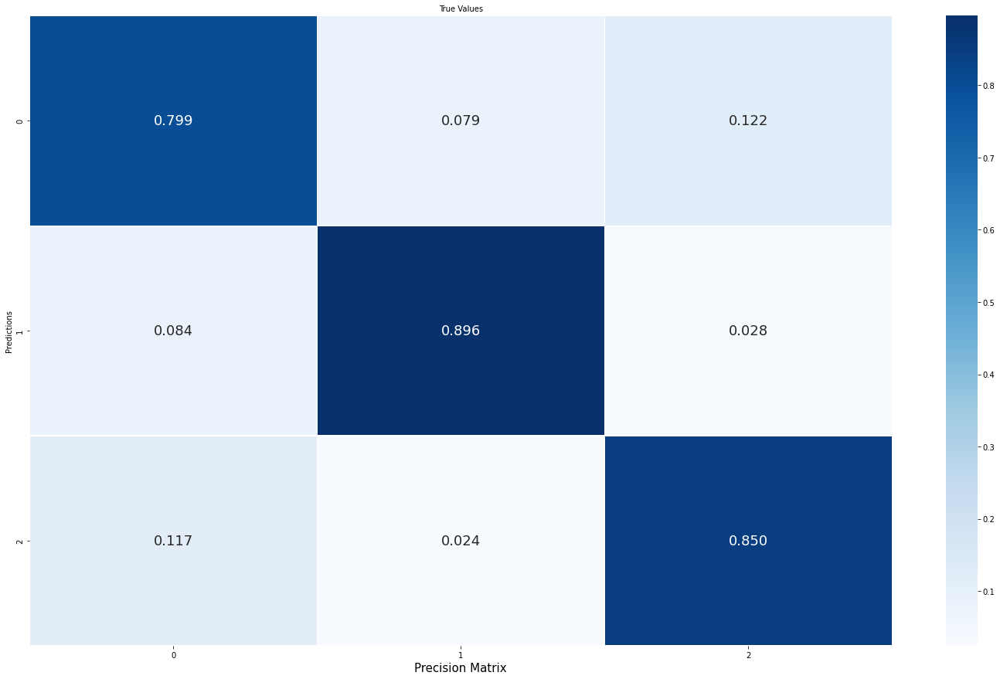

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y195, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Importancia de características en LGBC sobre datos de 2019

In [ ]:
for i in range(22):
  val_X195.iloc[:,i]=pd.to_numeric(val_X195.iloc[:,i])

In [ ]:
import eli5

from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state=1).fit(train_X195, train_Y195)

eli5.show_weights(perm, feature_names= val_X195.columns.tolist())

Weight,Feature
0.0946 ± 0.0018,i190327
0.0796 ± 0.0019,i190516
0.0750 ± 0.0026,i190416
0.0741 ± 0.0012,i190705
0.0605 ± 0.0031,i190827
0.0446 ± 0.0019,i190429
0.0415 ± 0.0016,i190718
0.0414 ± 0.0021,i190610
0.0380 ± 0.0014,i190218
0.0374 ± 0.0009,i190918


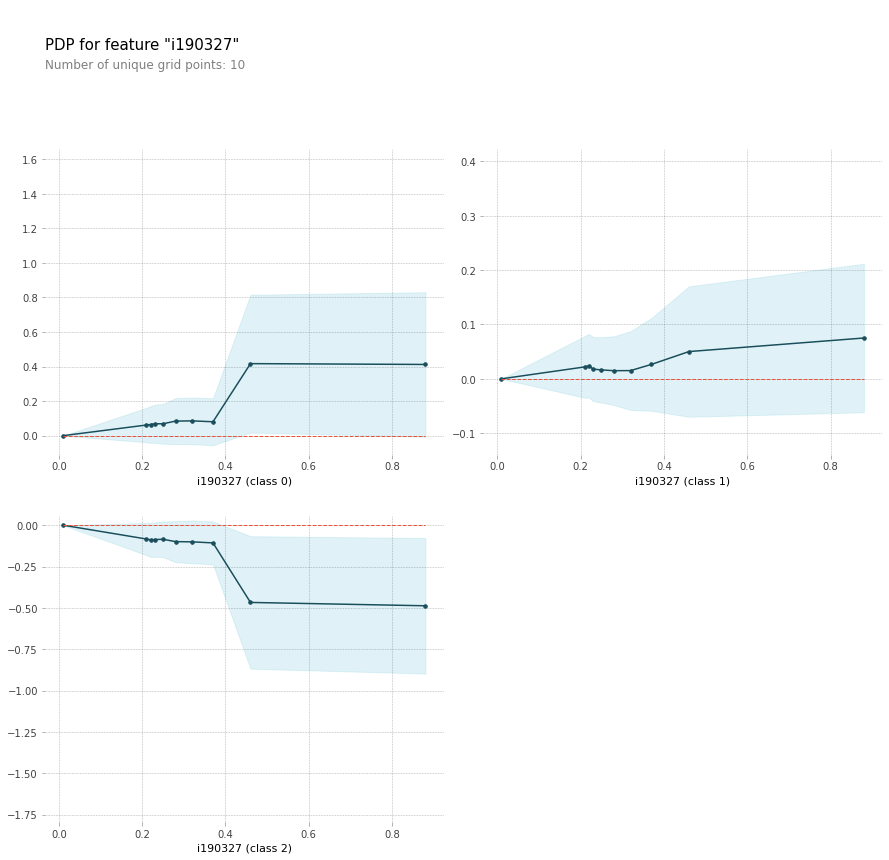

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='i190327'
feature_names=val_X195.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X195, model_features=val_X195.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

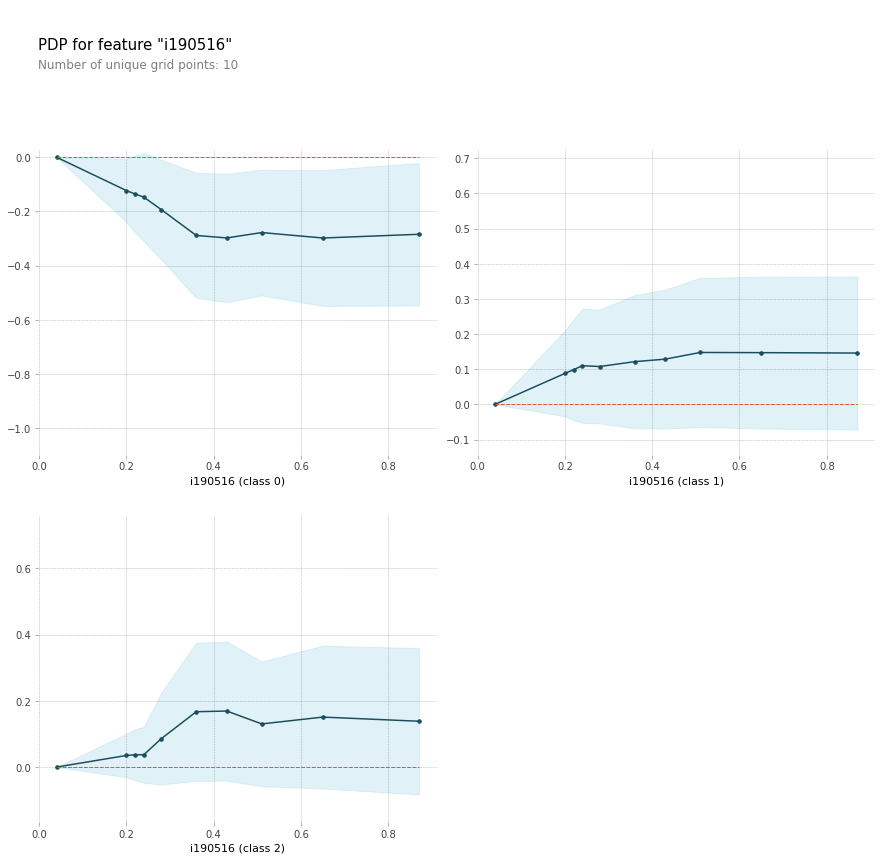

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='i190516'
feature_names=val_X195.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X195, model_features=val_X195.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

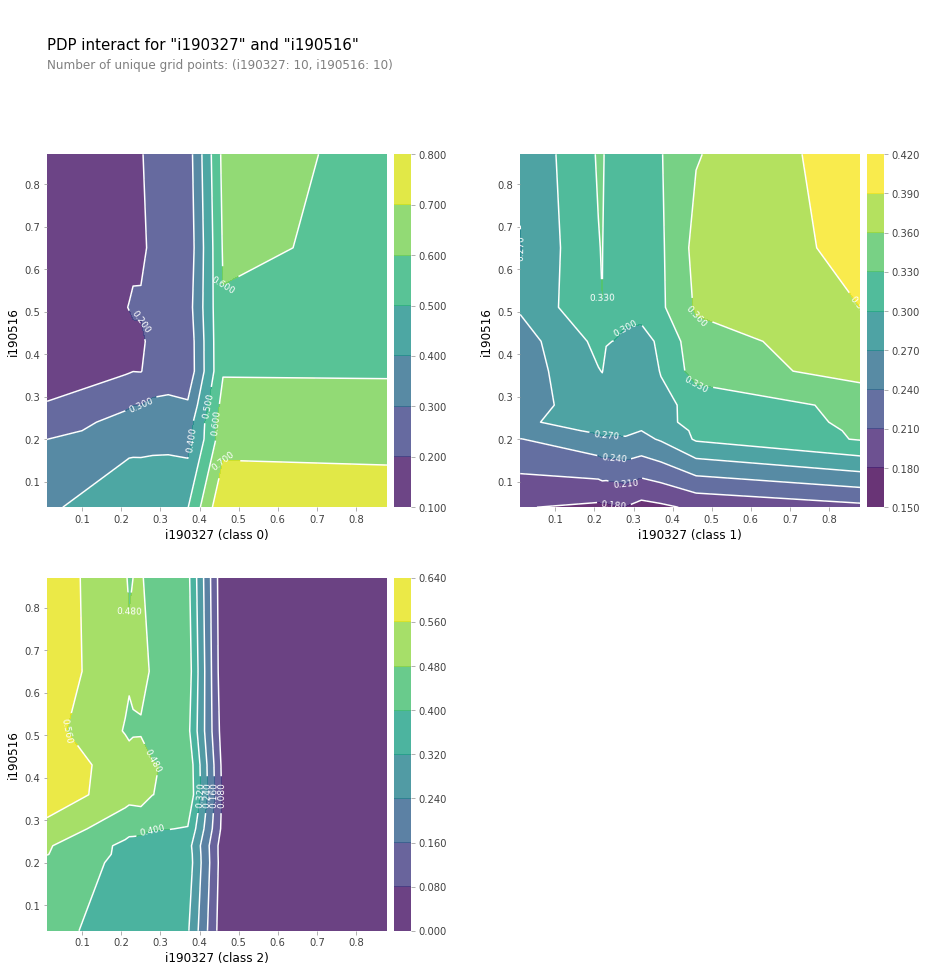

In [ ]:
features_to_plot=['i190327', 'i190516']
inter1=pdp.pdp_interact(model=model, dataset=val_X195, model_features=feature_names, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot)
plt.show()

##Explicabilidad con LGBC sobre los datos de 2019

In [ ]:
import shap

row_to_show = 120

data_for_prediction=val_X195.iloc[row_to_show]
data_for_prediction_array = data_for_prediction.values.reshape(1,-1)
print(model.predict_proba(data_for_prediction_array))

[[0.00164366 0.99146608 0.00689026]]


In [ ]:
k_explainer= shap.KernelExplainer(model.predict_proba, train_X195.iloc[0:50, :])
k_shap_values=k_explainer.shap_values(data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[0], k_shap_values[0], data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[1], k_shap_values[1], data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[2], k_shap_values[2], data_for_prediction)

  0%|          | 0/1500 [00:00<?, ?it/s]

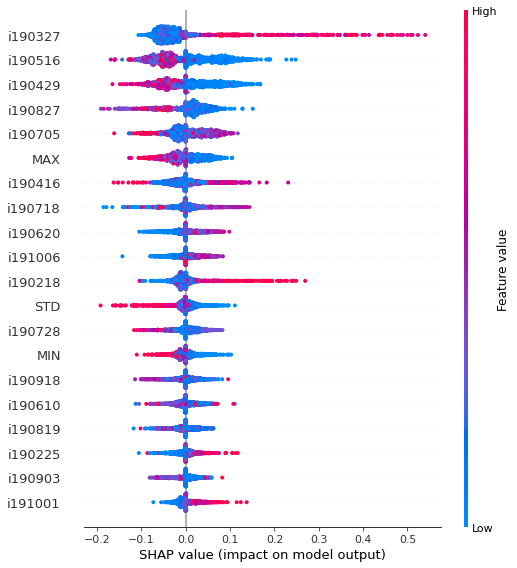

In [ ]:
shap.initjs()

shap_values=k_explainer.shap_values(val_X195.iloc[0:1500, :])
shap.summary_plot(shap_values[0], val_X195.iloc[0:1500, :])

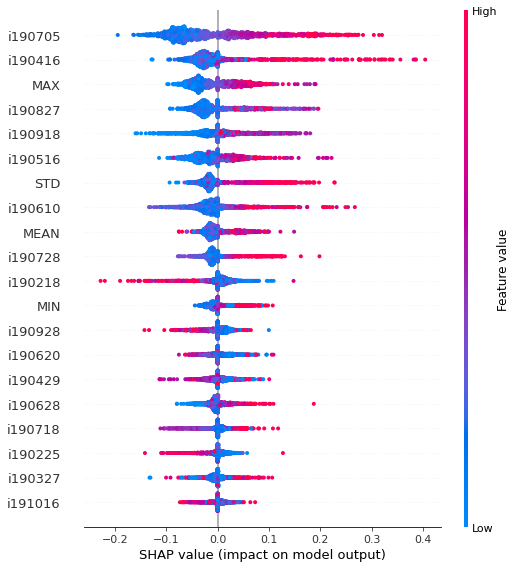

In [ ]:
shap.initjs()

shap.summary_plot(shap_values[1], val_X195.iloc[0:1500, :])

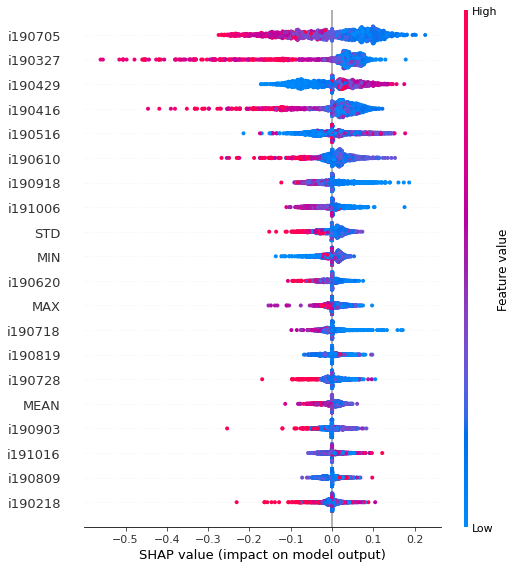

In [ ]:
shap.initjs()

shap.summary_plot(shap_values[2], val_X195.iloc[0:1500, :])

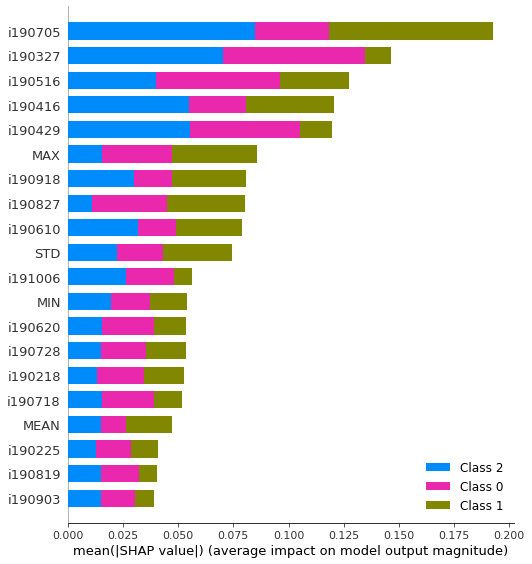

In [ ]:
shap.summary_plot(shap_values, val_X195, plot_type='bar')

#Modelo Gradient Boosting Classifier 

## Random Grid Search con GBC con los datos de 2017

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

from numpy import mean
from numpy import std

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RepeatedStratifiedKFold

# Number of trees in gradient boosting
n_estimators = [100, 200, 300]
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 10, 20]
# Maximum number of levels in tree
max_depth = [10,14,18,20]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
tol=[0.001, 0.0001, 0.000001]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'tol':tol}

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
gbc = GradientBoostingClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
gbc_random17= RandomizedSearchCV(estimator = gbc, param_distributions = random_grid, scoring='balanced_accuracy' ,n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
gbc_random17.fit(train_X175, train_Y175)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 31.6min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 157.2min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 397.6min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 601.3min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=GradientBoostingClassifier(ccp_alpha=0.0,
                                                        criterion='friedman_mse',
                                                        init=None,
                                                        learning_rate=0.1,
                                                        loss='deviance',
                                                        max_depth=3,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                    

In [ ]:
gbc_random17.best_params_

NameError: ignored

In [ ]:
gbc_random17.best_model_

In [ ]:
#print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))


model_gb_clf=GradientBoostingClassifier(learning_rate=0.01, n_estimators=400, min_samples_split=100, max_depth=20, max_features=20, tol=0.00001)
model_gb_clf.fit(train_X175, train_Y175)

y_pred_train=model_gb_clf.predict(train_X175)
y_pred_val=model_gb_clf.predict(val_X175)
#y_pred_test=model_gb_clf.predict(test_X)


##Resultados obtenidos con GBC sobre los datos de 2017

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(train_Y175, y_pred_train))
print(classification_report(val_Y175, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97     24700
           1       0.99      0.97      0.98     11540
           2       0.98      0.91      0.94      8188

    accuracy                           0.97     44428
   macro avg       0.98      0.95      0.96     44428
weighted avg       0.97      0.97      0.97     44428

              precision    recall  f1-score   support

           0       0.82      0.92      0.87    469403
           1       0.90      0.86      0.88    219765
           2       0.76      0.54      0.63    154969

    accuracy                           0.83    844137
   macro avg       0.83      0.77      0.79    844137
weighted avg       0.83      0.83      0.83    844137



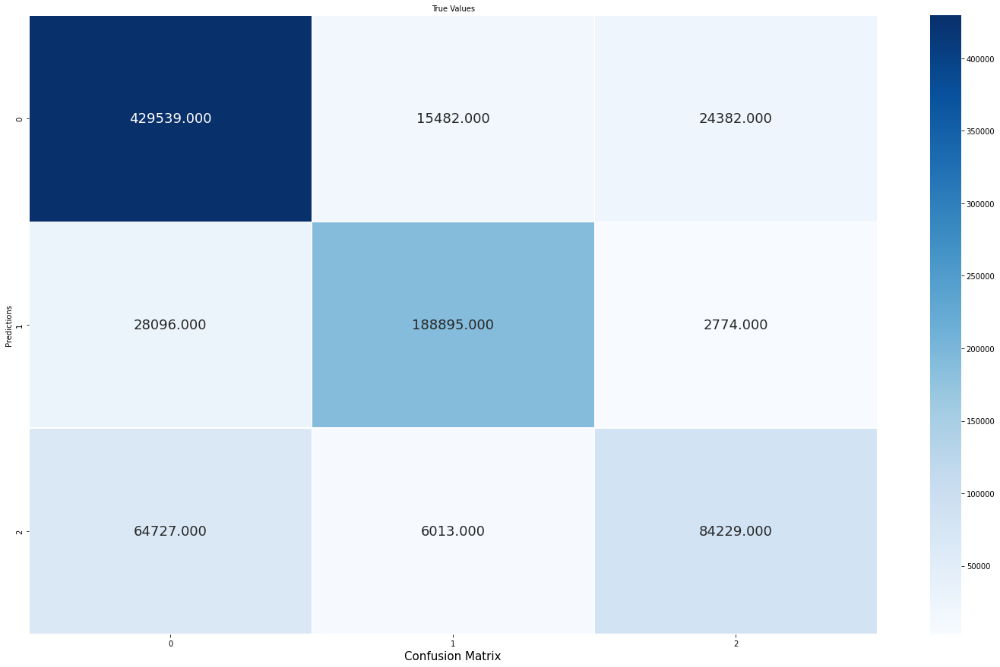

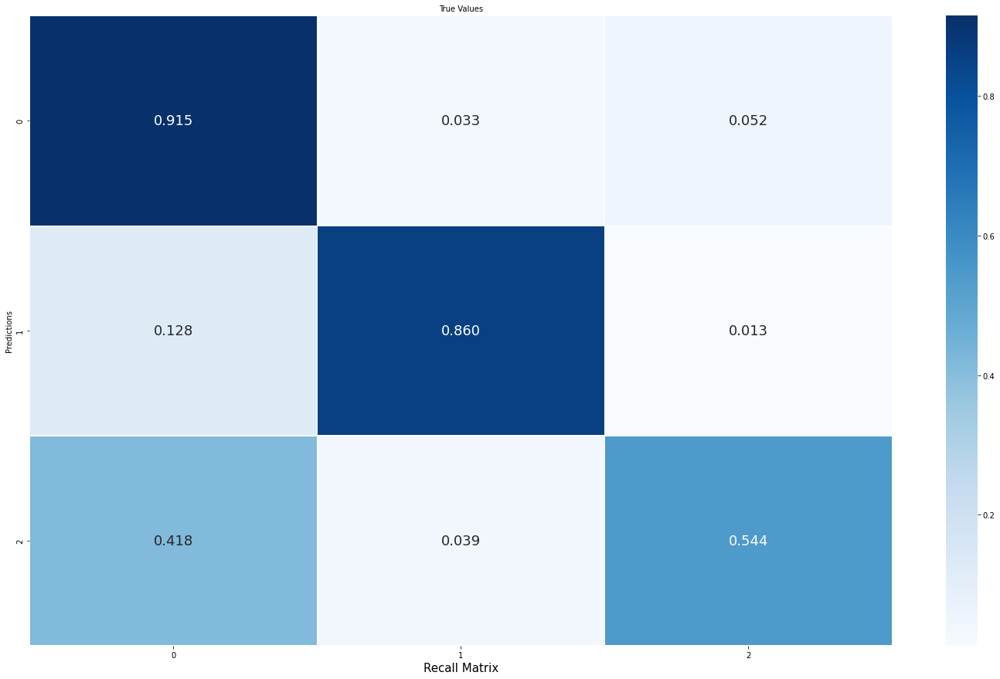

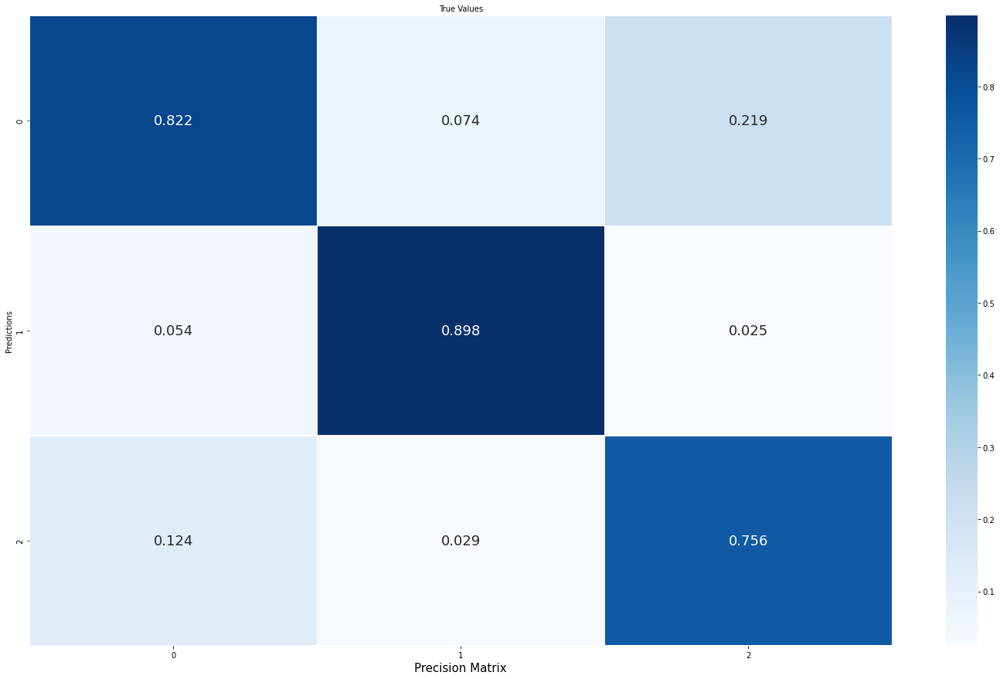

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y175, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Random Grid Search con GBC con los datos de 2018

In [ ]:
model_gb_clf=GradientBoostingClassifier(learning_rate=0.01, n_estimators=400, min_samples_split=100, max_depth=20, max_features=20, tol=0.00001)
model_gb_clf.fit(train_X185, train_Y185)

y_pred_train=model_gb_clf.predict(train_X185)
y_pred_val=model_gb_clf.predict(val_X185)
#y_pred_test=model_gb_clf.predict(test_X)

##Resultados obtenidos con GBC con los datos de 2018

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(train_Y185, y_pred_train))
print(classification_report(val_Y185, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     21228
           1       1.00      0.98      0.99     11322
           2       0.98      0.98      0.98     11883

    accuracy                           0.98     44433
   macro avg       0.99      0.98      0.98     44433
weighted avg       0.98      0.98      0.98     44433

              precision    recall  f1-score   support

           0       0.85      0.87      0.86    399993
           1       0.91      0.85      0.88    215755
           2       0.82      0.82      0.82    228493

    accuracy                           0.85    844241
   macro avg       0.86      0.85      0.85    844241
weighted avg       0.85      0.85      0.85    844241



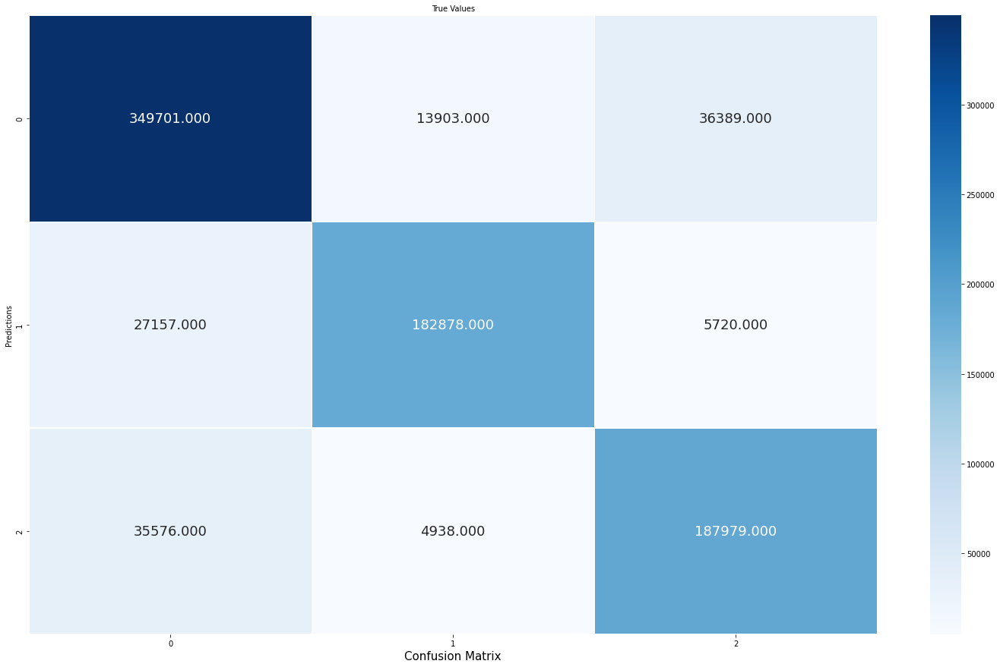

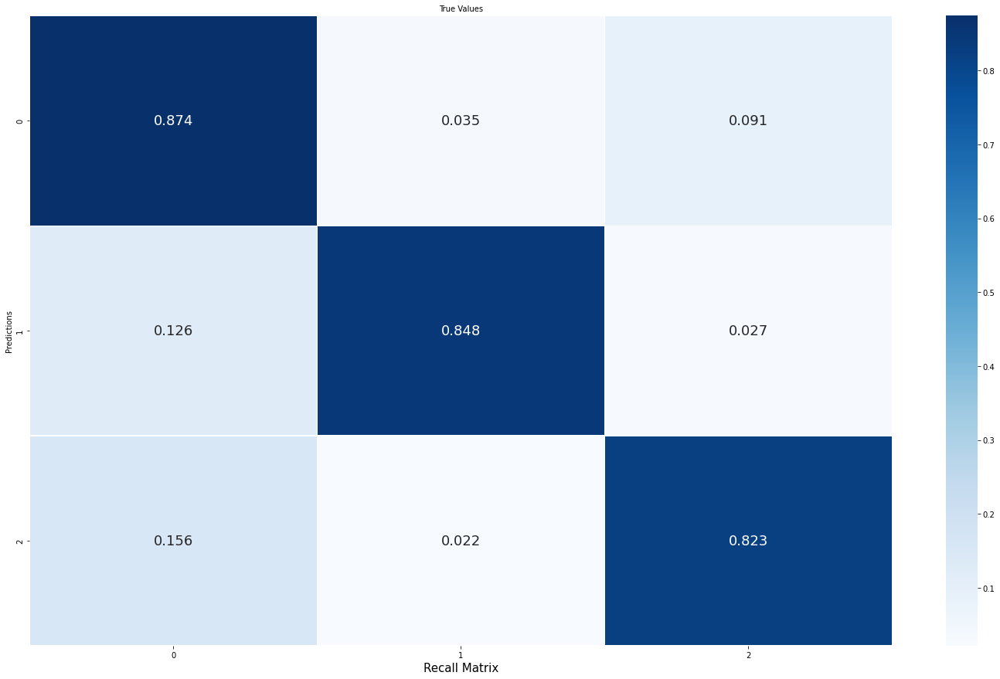

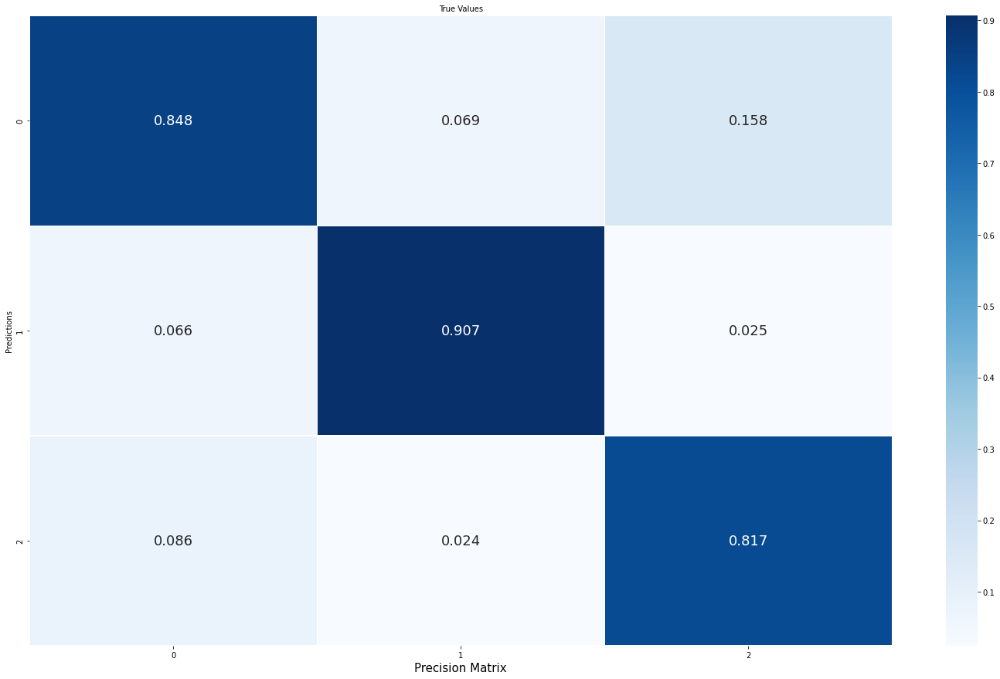

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y185, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Random Grid Search con GBC con los datos de 2019

In [ ]:
model_gb_clf=GradientBoostingClassifier(learning_rate=0.01, n_estimators=400, min_samples_split=100, max_depth=20, max_features=20, tol=0.00001)
model_gb_clf.fit(train_X195, train_Y195)

y_pred_train=model_gb_clf.predict(train_X195)
y_pred_val=model_gb_clf.predict(val_X195)
#y_pred_test=model_gb_clf.predict(test_X)

#Resultados obtenidos con GBC sobre los datos de 2019

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(train_Y195, y_pred_train))
print(classification_report(val_Y195, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98     15712
           1       0.99      0.97      0.98     11707
           2       0.98      0.99      0.98     17058

    accuracy                           0.98     44477
   macro avg       0.98      0.98      0.98     44477
weighted avg       0.98      0.98      0.98     44477

              precision    recall  f1-score   support

           0       0.80      0.81      0.81    299737
           1       0.90      0.84      0.87    220733
           2       0.85      0.88      0.86    324605

    accuracy                           0.84    845075
   macro avg       0.85      0.84      0.85    845075
weighted avg       0.84      0.84      0.84    845075



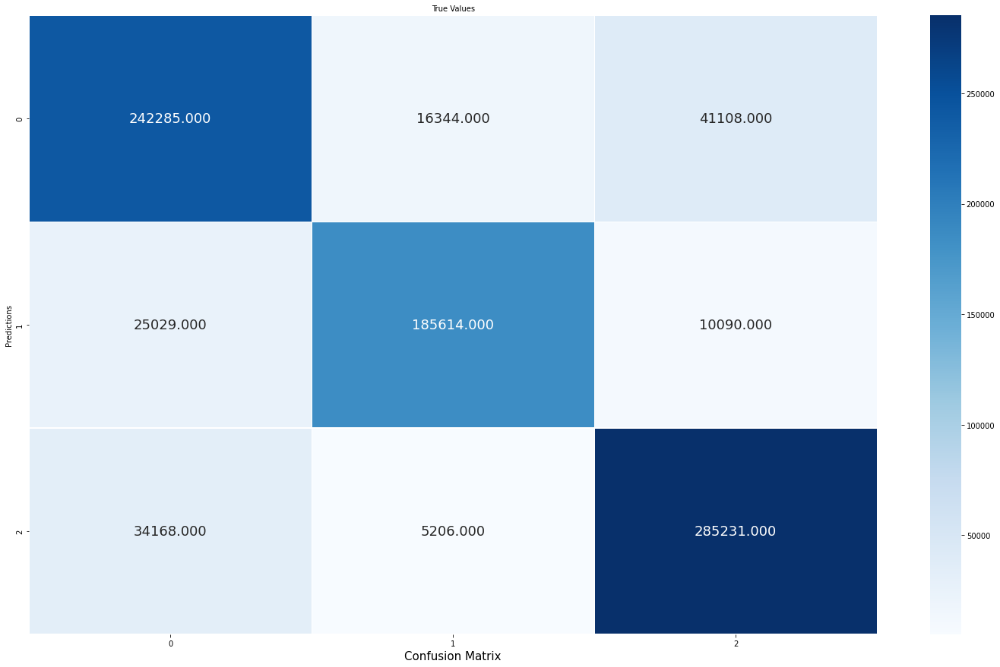

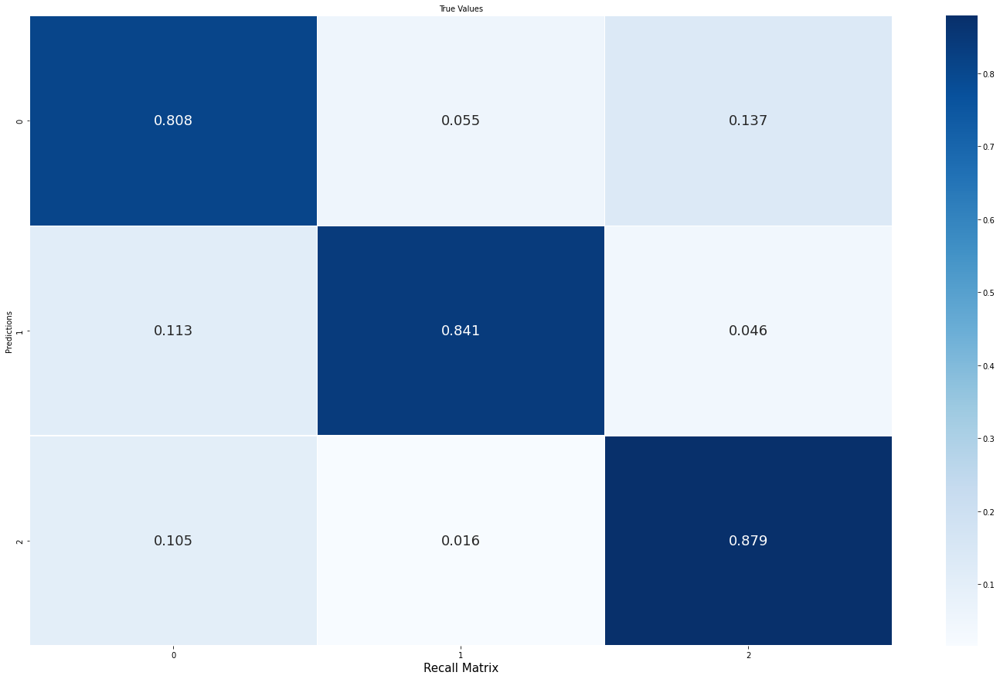

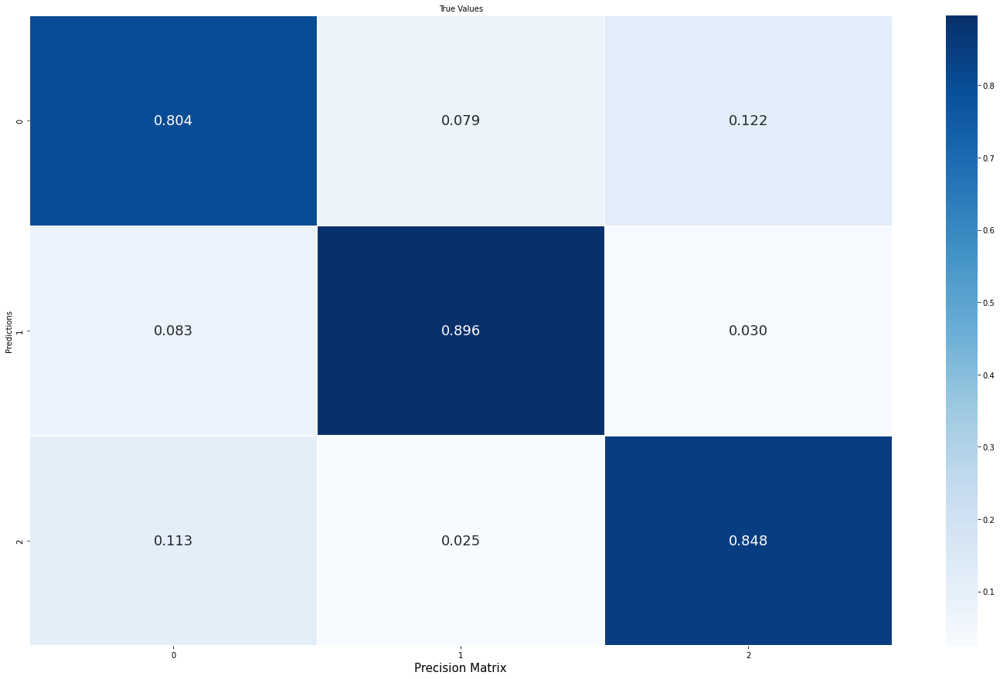

In [ ]:
confm=pd.crosstab(val_Y195, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

#Random Forest Model


##Random Grid Search en clasificador RF sobre datos de 2017

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [100, 200, 300]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [10,12,14,16,18]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(train_X175, train_Y175)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 50.1min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 115.7min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 149.5min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rf_random.best_estimator_

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=18, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

model_rf=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight='balanced_subsample',
                       criterion='gini', max_depth=18, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
model_rf.fit(train_X175, train_Y175)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='auto', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=300, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

##Resultados obtenidos en RF sobre datos de 2017

In [ ]:
from sklearn.metrics import classification_report

y_predrf_tr17=model_rf.predict(train_X175)
y_predrf_vl17=model_rf.predict(val_X175)
#y_predrf_test=model_rf.predict(test_X)

print(classification_report(train_Y175, y_predrf_tr17))
print(classification_report(val_Y175, y_predrf_vl17))
#print(classification_report(test_Y, y_predrf_test))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98     24700
           1       0.99      0.98      0.99     11540
           2       0.93      0.99      0.96      8188

    accuracy                           0.98     44428
   macro avg       0.97      0.98      0.97     44428
weighted avg       0.98      0.98      0.98     44428

              precision    recall  f1-score   support

           0       0.83      0.88      0.86    469403
           1       0.90      0.86      0.88    219765
           2       0.68      0.61      0.65    154969

    accuracy                           0.82    844137
   macro avg       0.80      0.78      0.79    844137
weighted avg       0.82      0.82      0.82    844137



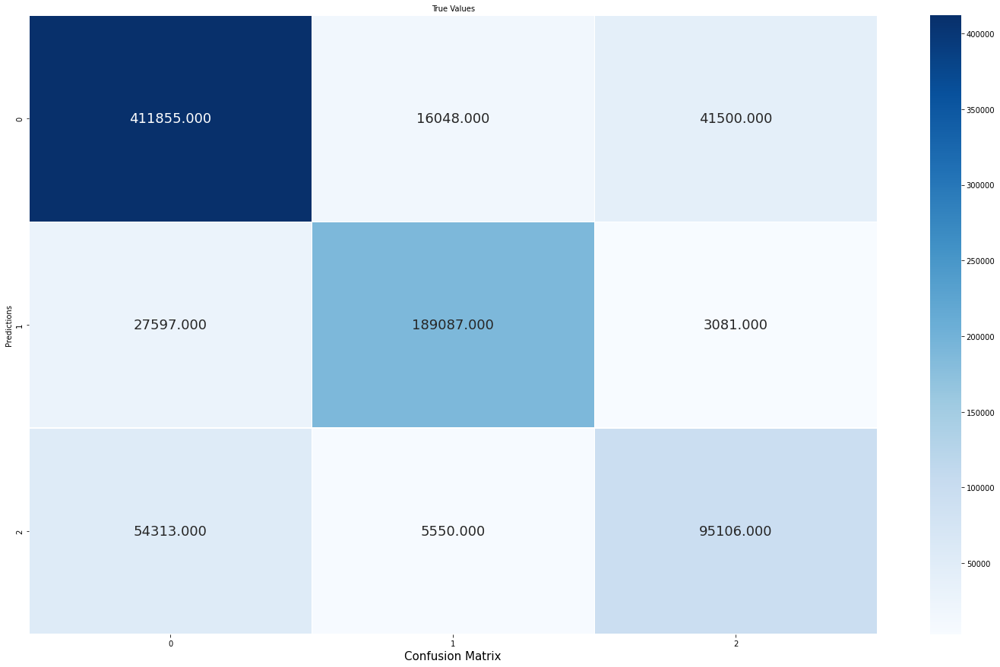

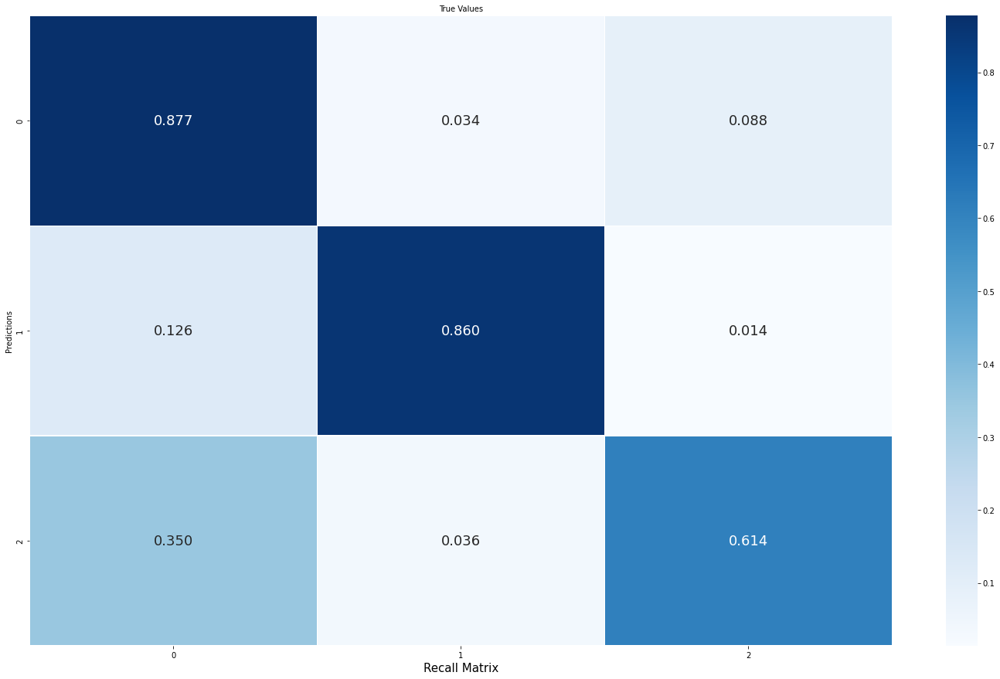

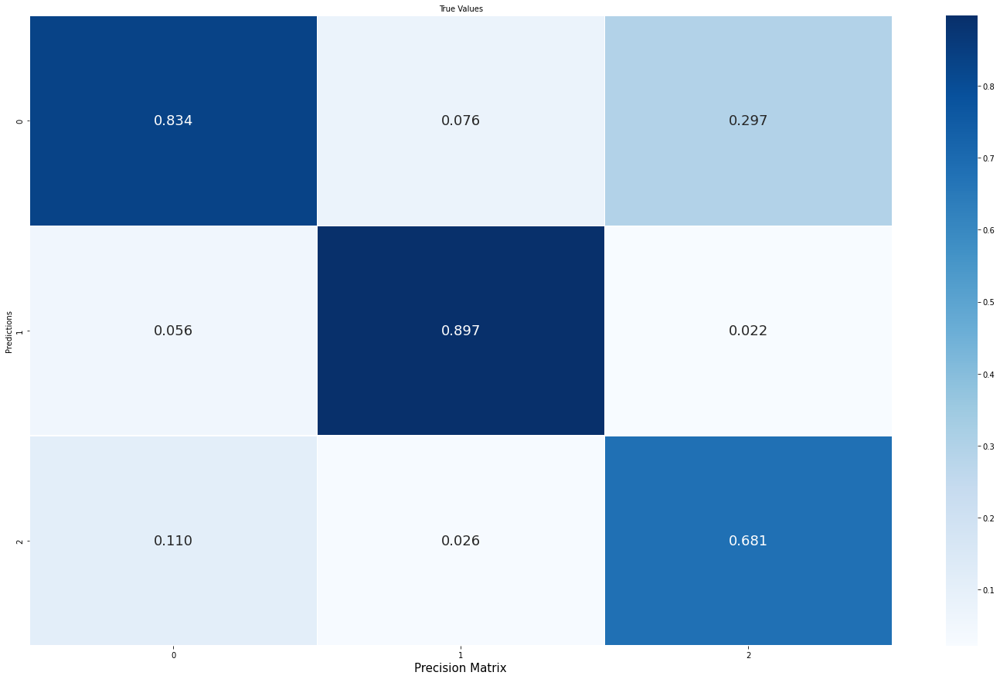

In [ ]:
confm=pd.crosstab(val_Y175, y_predrf_vl17)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Random Grid Search en clasificador RF sobre datos de 2018

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from numpy import mean
from numpy import std
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(train_X185, train_Y185)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 49.4min
/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 114.8min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 149.3min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rf_random.best_estimator_

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=18, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
rf_random.cv_results_

{'mean_fit_time': array([ 67.60365782,  50.19902802, 147.37586389,  75.44950728,
         90.12026372,  74.81578507,  30.60069437,  80.67314668,
         35.52230086, 120.82188439,  21.69388304,  28.23559079,
        121.36802006,  25.16990614,  90.98082261,  31.33157301,
        145.82280273,  74.69220171,  98.11261744,  50.46266961,
         71.25640035,  93.0574482 ,  60.84138398,  94.44031601,
        134.35403652,  65.47684526,  31.72314305,  36.25144868,
         43.3772553 ,  89.94643016, 105.17022409,  92.92349834,
        101.06985435, 134.1614851 ,  70.22772393, 144.81630535,
         40.97841682,  25.21795917,  63.6868361 ,  66.80018034,
         30.31343756, 146.97424941,  85.01172004,  89.07046099,
         94.7283957 ,  50.16463909, 106.52374792,  40.89028158,
        143.65452085,  21.73019891,  66.04818878,  95.5434598 ,
        145.03344707,  21.52475801,  48.698102  ,  70.65278878,
         74.18528948, 133.61311078,  71.25767708,  83.91647077,
         33.50191016,  

In [ ]:
model_rf=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight='balanced_subsample',
                       criterion='gini', max_depth=18, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
model_rf.fit(train_X185, train_Y185)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='auto', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

##Resultados obtenidos en RF sobre datos de 2018

In [ ]:
from sklearn.metrics import classification_report

y_predrf_tr18=model_rf.predict(train_X185)
y_predrf_vl18=model_rf.predict(val_X185)

print(classification_report(train_Y185, y_predrf_tr18))
print(classification_report(val_Y185, y_predrf_vl18))


              precision    recall  f1-score   support

           0       0.99      0.97      0.98     21228
           1       1.00      0.99      0.99     11322
           2       0.95      0.99      0.97     11883

    accuracy                           0.98     44433
   macro avg       0.98      0.98      0.98     44433
weighted avg       0.98      0.98      0.98     44433

              precision    recall  f1-score   support

           0       0.85      0.85      0.85    399993
           1       0.90      0.85      0.88    215755
           2       0.79      0.84      0.82    228493

    accuracy                           0.85    844241
   macro avg       0.85      0.85      0.85    844241
weighted avg       0.85      0.85      0.85    844241



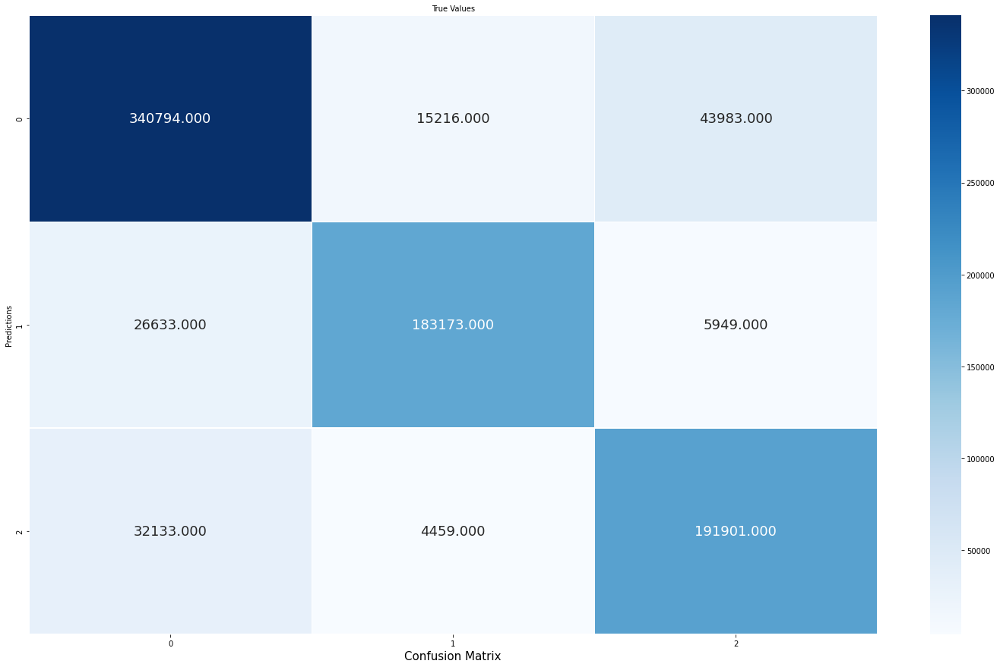

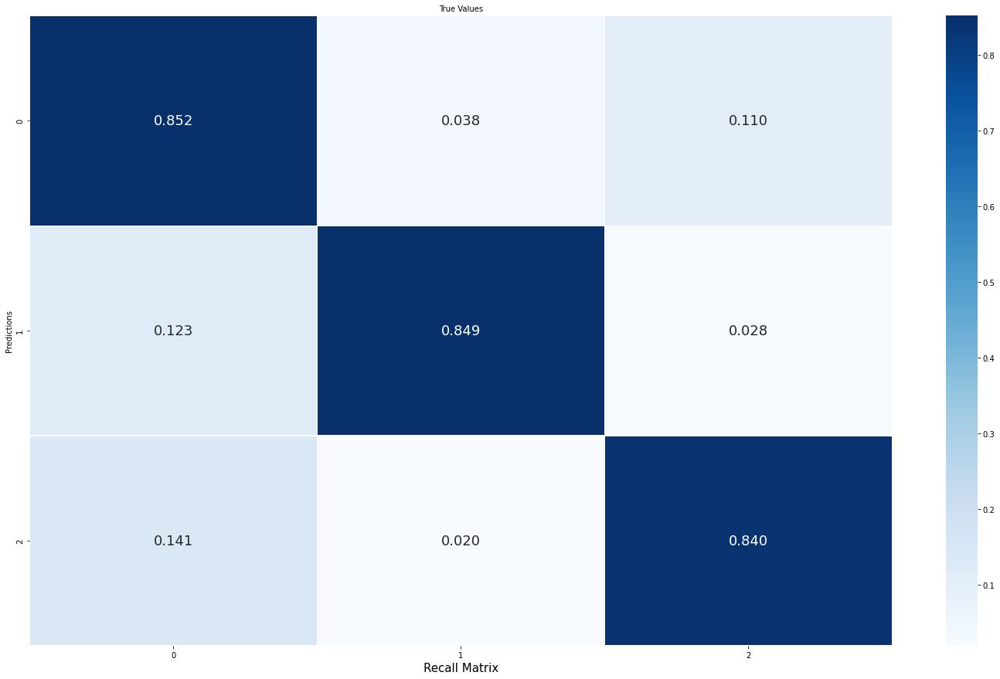

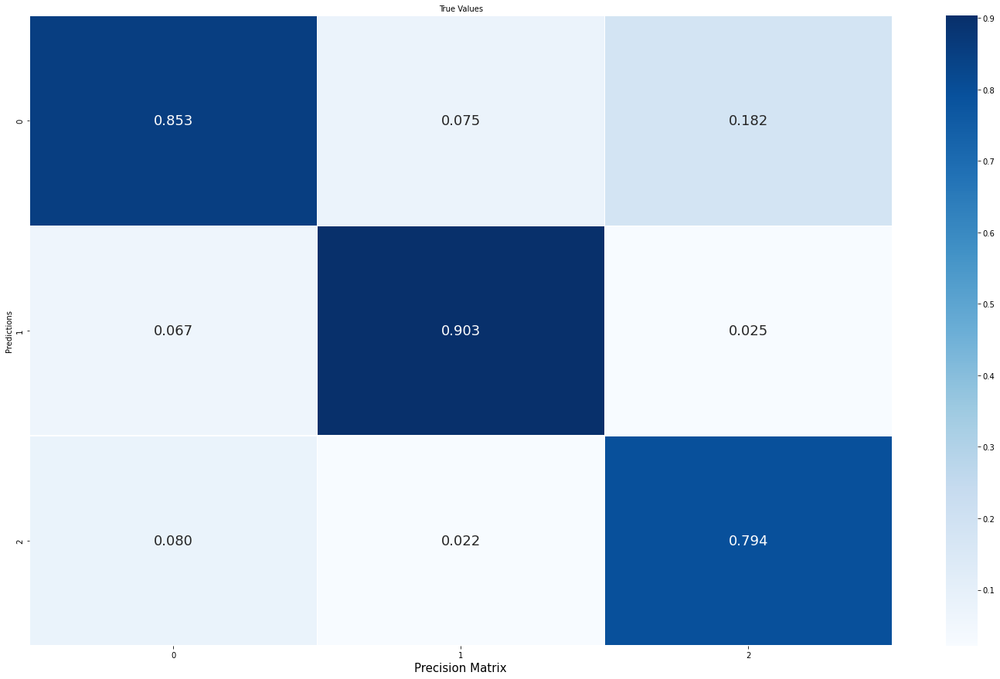

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y185, y_predrf_vl18)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Random Grid Search en clasificador RF sobre datos de 2019

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [100, 200, 300]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [10,12,14,16,18]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
#Class weight or not
class_weight=[None, 'balanced_subsample']
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'class_weight': class_weight}

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from numpy import mean
from numpy import std
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, scoring='balanced_accuracy',verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(train_X195, train_Y195)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 48.5min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 104.0min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 151.7min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rf_random.cv_results_

{'mean_fit_time': array([ 33.0287302 ,  88.17103176, 131.34459853,  29.33375072,
         97.46464968,  69.78800554,  91.79235687,  45.92109623,
         50.18252749, 127.40814419,  98.23727226,  88.44382267,
         69.42179418,  82.74192095,  88.86588635,  69.75939479,
         29.55715275,  37.59180913,  36.94241905, 110.53421335,
         73.63476443,  49.0695837 , 106.16664853,  66.41242132,
         37.6209198 ,  46.55115623,  32.42636905,  90.70329523,
         51.4205616 ,  97.74929481, 118.34497981,  80.02563977,
         21.35322266,  53.62786231,  31.24546237, 104.09765468,
        144.26797404,  72.64969645,  26.68895597, 146.64633088,
         97.67092671,  87.5576468 , 117.6846488 ,  42.14057527,
        138.51462855,  55.75976105,  49.4491529 ,  42.8540535 ,
         96.58715138,  29.95904102,  31.11387186,  75.48705764,
         33.17124581,  61.47159157,  35.24847469,  63.46219106,
         42.21617436,  40.14292889,  35.58786945,  37.54594111,
        105.97612896,  

In [ ]:
rf_random.best_estimator_

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=300, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [ ]:
model_rf=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=300, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)
model_rf.fit(train_X195, train_Y195)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=300, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

##Resultados obtenidos en RF sobre datos de 2019

In [ ]:
from sklearn.metrics import classification_report

y_predrf_tr19=model_rf.predict(train_X195)
y_predrf_vl19=model_rf.predict(val_X195)


print(classification_report(train_Y195, y_predrf_tr19))
print(classification_report(val_Y195, y_predrf_vl19))


              precision    recall  f1-score   support

           0       0.94      0.95      0.94     15712
           1       0.98      0.95      0.96     11707
           2       0.95      0.96      0.96     17058

    accuracy                           0.95     44477
   macro avg       0.95      0.95      0.95     44477
weighted avg       0.95      0.95      0.95     44477

              precision    recall  f1-score   support

           0       0.79      0.81      0.80    299737
           1       0.89      0.84      0.86    220733
           2       0.85      0.87      0.86    324605

    accuracy                           0.84    845075
   macro avg       0.84      0.84      0.84    845075
weighted avg       0.84      0.84      0.84    845075



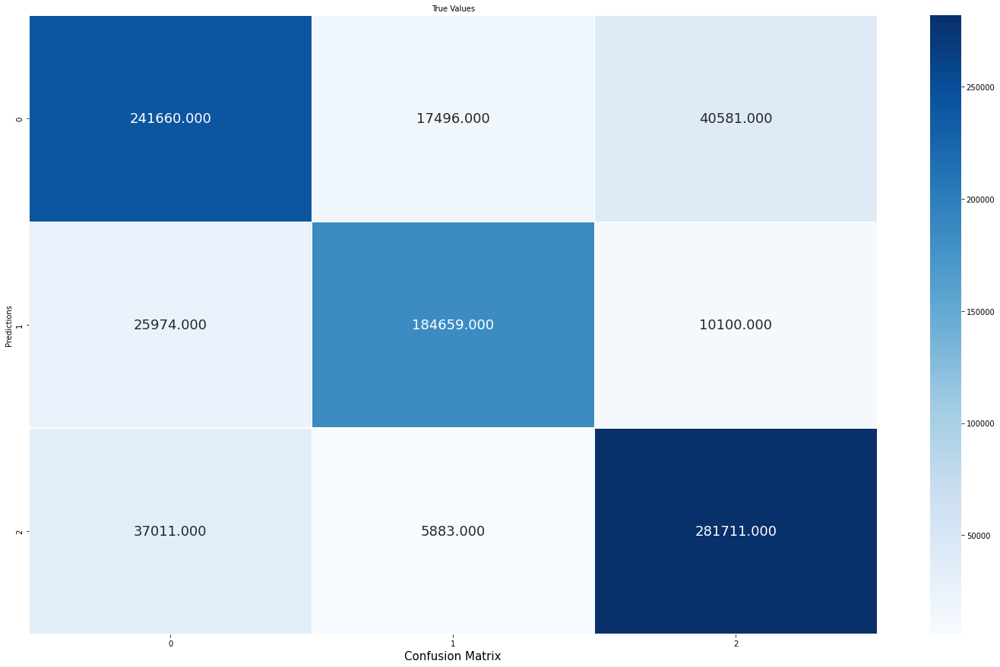

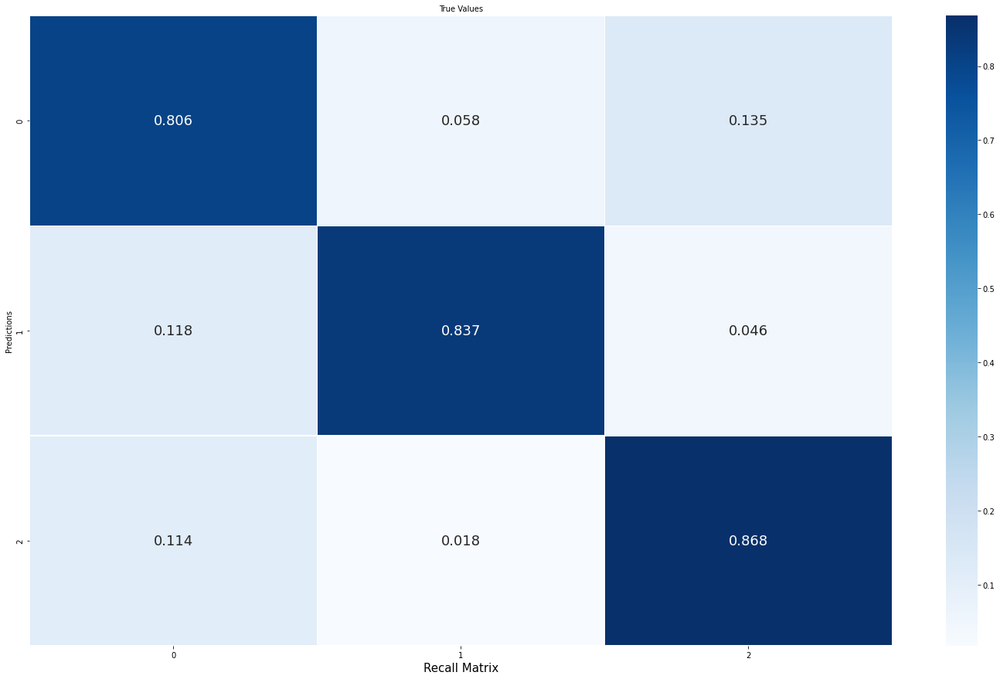

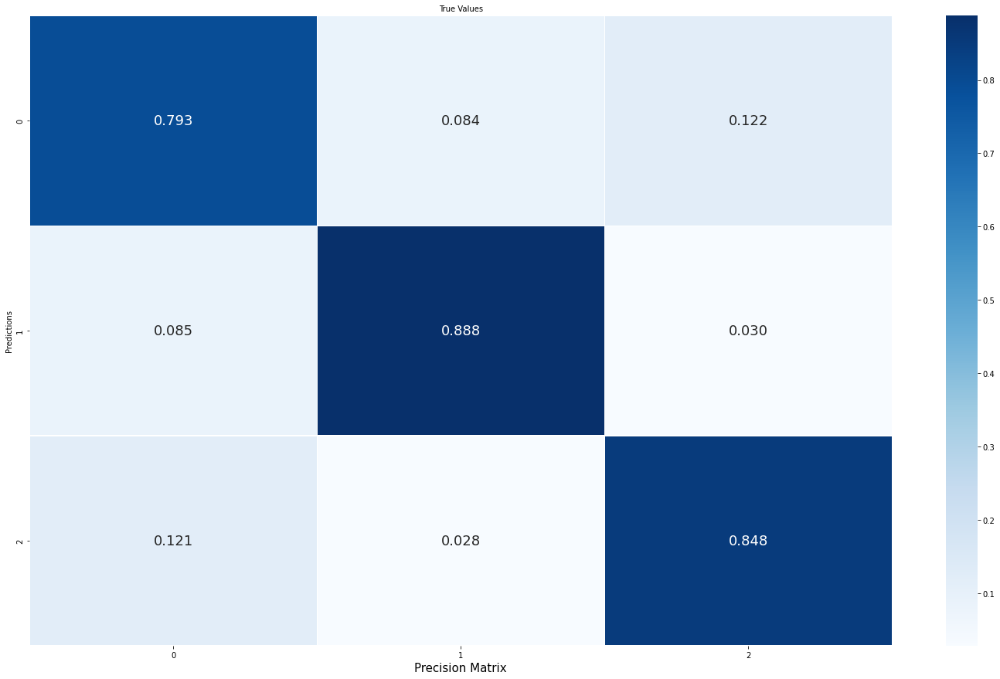

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y195, y_predrf_vl19)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

# Red neuronal profunda densa

In [ ]:
# Algunos hiper-parámetros
lr = .00001
batch_size = 32
n_epochs = 50
n_class=3
dt=0.3
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

# Crear modelo
model = Sequential()
model.add(Dense(units=256, activation='relu', input_shape=(train_X175.shape[1],)))
model.add(Dropout(dt))
model.add(Dense(128, activation='relu'))
model.add(Dropout(dt))
model.add(Dense(64, activation='relu'))
model.add(Dropout(dt))
model.add(Dense(32, activation='relu'))
model.add(Dropout(dt))
model.add(Dense(n_class, activation='softmax'))

# Visualizar arquitectura y dimensiones
model.summary()

# Compilamos el modelo: ¿Qué función de coste hay que utilizar?
model.compile(loss='sparse_categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 256)               6912      
_________________________________________________________________
dropout_12 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_16 (Dense)             (None, 128)               32896     
_________________________________________________________________
dropout_13 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_17 (Dense)             (None, 64)                8256      
_________________________________________________________________
dropout_14 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_18 (Dense)             (None, 32)               

##Pasando a tensor los datos

In [ ]:
TX_train175=tf.convert_to_tensor(train_X175, dtype=float, dtype_hint=None, name=None)

TX_val175=tf.convert_to_tensor(val_X175,dtype=float, dtype_hint=None, name=None)

TX_train185=tf.convert_to_tensor(train_X185, dtype=float, dtype_hint=None, name=None)

TX_val185=tf.convert_to_tensor(val_X185,dtype=float, dtype_hint=None, name=None)

TX_train195=tf.convert_to_tensor(train_X195, dtype=float, dtype_hint=None, name=None)

TX_val195=tf.convert_to_tensor(val_X195,dtype=float, dtype_hint=None, name=None)

##Entrenamiento DNN con datos 2017 y resultados obtenidos

In [ ]:
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

hist = model.fit(TX_train175, 
                 train_Y175, 
                 batch_size=batch_size, 
                 epochs=n_epochs, 
                 verbose=1, 
                 shuffle=True,
                 class_weight=class_dictW175,
                 validation_data=(TX_val175, val_Y175),
                 callbacks=[cp_callback])

Epoch 1/50
1389/1389 [==============================] - 27s 19ms/step - loss: 1.2960 - accuracy: 0.2701 - val_loss: 1.1296 - val_accuracy: 0.1839

Epoch 00001: saving model to training_1/cp.ckpt
Epoch 2/50
1389/1389 [==============================] - 27s 19ms/step - loss: 1.2706 - accuracy: 0.2501 - val_loss: 1.1249 - val_accuracy: 0.3006

Epoch 00002: saving model to training_1/cp.ckpt
Epoch 3/50
1389/1389 [==============================] - 44s 32ms/step - loss: 1.2318 - accuracy: 0.2951 - val_loss: 1.0875 - val_accuracy: 0.3516

Epoch 00003: saving model to training_1/cp.ckpt
Epoch 4/50
1389/1389 [==============================] - 44s 32ms/step - loss: 1.1684 - accuracy: 0.3378 - val_loss: 1.0285 - val_accuracy: 0.3714

Epoch 00004: saving model to training_1/cp.ckpt
Epoch 5/50
1389/1389 [==============================] - 44s 32ms/step - loss: 1.0927 - accuracy: 0.3719 - val_loss: 0.9710 - val_accuracy: 0.3821

Epoch 00005: saving model to training_1/cp.ckpt
Epoch 6/50
1389/1389 [===

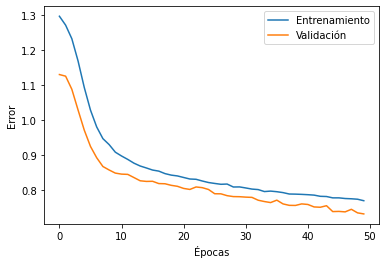

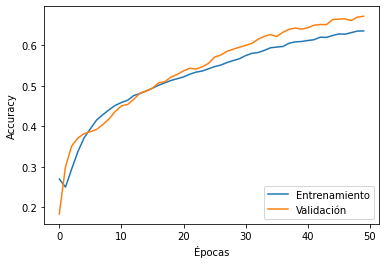

In [ ]:
def plot_curves(history):
  plt.figure()
  plt.xlabel('Épocas')
  plt.ylabel('Error')
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.legend(['Entrenamiento', 'Validación'])

  plt.figure()
  plt.xlabel('Épocas')
  plt.ylabel('Accuracy')
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.legend(['Entrenamiento', 'Validación'], loc='lower right');

plot_curves(hist.history)

In [ ]:
y_pred_train=model.predict(TX_train175)
y_pred_val=model.predict(TX_val175)
#y_pred_test=model.predict(TX_test)

In [ ]:
y_pred_train_un=np.argmax(y_pred_train, axis=1)
y_pred_val_un=np.argmax(y_pred_val, axis=1)
#y_pred_test_un=np.argmax(y_pred_test, axis=1)

In [ ]:
 from sklearn.metrics import classification_report

print(classification_report(train_Y175, y_pred_train_un))
print(classification_report(val_Y175, y_pred_val_un))
#print(classification_report(test_Y, y_pred_test_un))


              precision    recall  f1-score   support

           0       0.83      0.56      0.67     24700
           1       0.78      0.87      0.82     11540
           2       0.40      0.73      0.52      8188

    accuracy                           0.67     44428
   macro avg       0.67      0.72      0.67     44428
weighted avg       0.74      0.67      0.68     44428

              precision    recall  f1-score   support

           0       0.83      0.56      0.67    469403
           1       0.77      0.87      0.82    219765
           2       0.41      0.73      0.52    154969

    accuracy                           0.67    844137
   macro avg       0.67      0.72      0.67    844137
weighted avg       0.74      0.67      0.68    844137



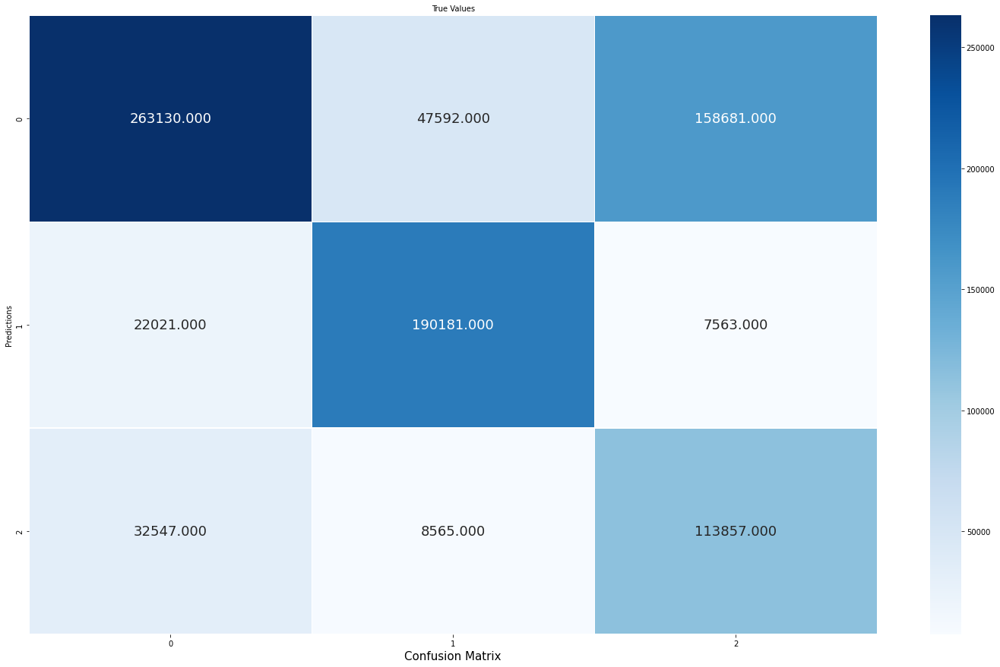

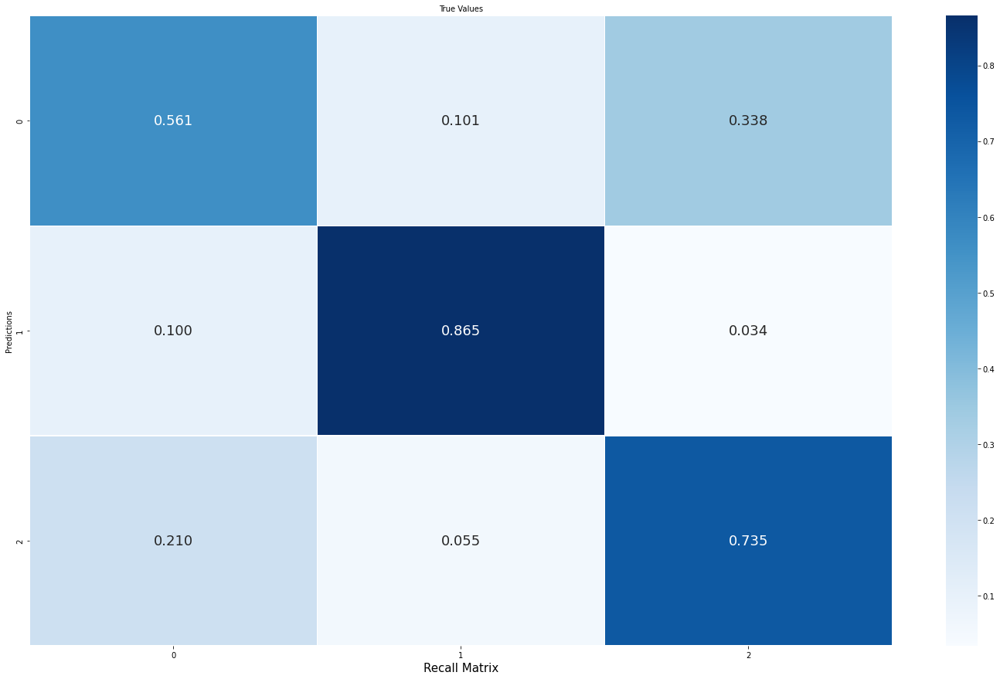

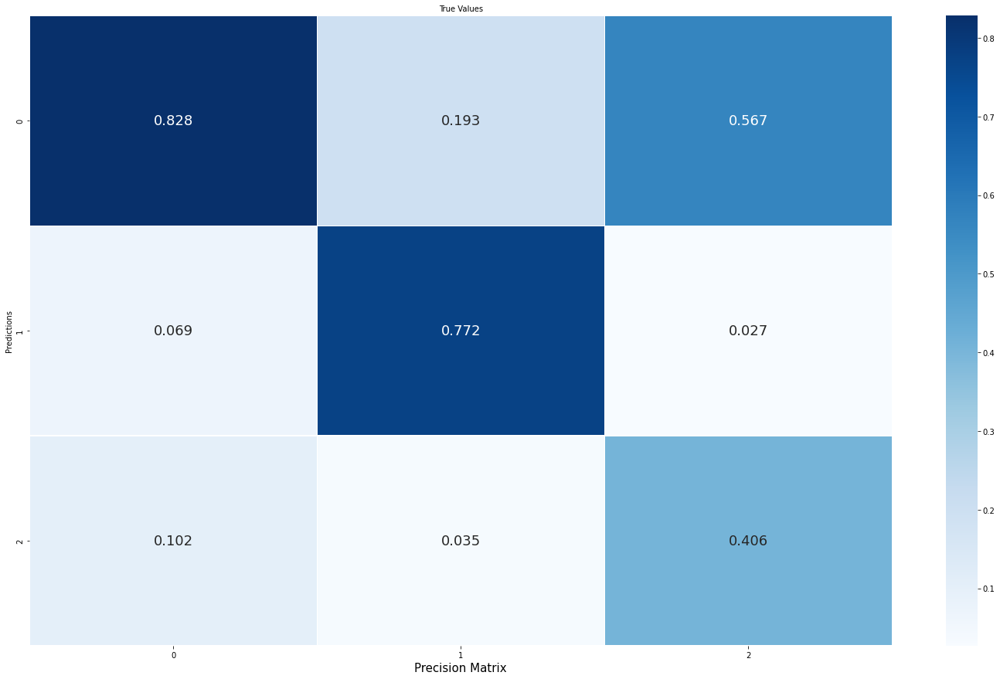

In [ ]:
confm=pd.crosstab(val_Y175, y_pred_val_un)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm ,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Entrenamiento DNN con datos 2018 y resultados obtenidos

In [ ]:
import os

checkpoint_path = "training_2/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

hist = model.fit(TX_train185, 
                 train_Y185, 
                 batch_size=batch_size, 
                 epochs=n_epochs, 
                 verbose=1, 
                 shuffle=True,
                 validation_data=(TX_val185, val_Y185),
                 class_weight=class_dictW185,
                 callbacks=[cp_callback])

Epoch 1/25
1389/1389 [==============================] - 45s 33ms/step - loss: 0.7723 - accuracy: 0.6849 - val_loss: 0.6543 - val_accuracy: 0.7335

Epoch 00001: saving model to training_2/cp.ckpt
Epoch 2/25
1389/1389 [==============================] - 29s 21ms/step - loss: 0.7389 - accuracy: 0.7107 - val_loss: 0.6334 - val_accuracy: 0.7404

Epoch 00002: saving model to training_2/cp.ckpt
Epoch 3/25
1389/1389 [==============================] - 29s 21ms/step - loss: 0.7251 - accuracy: 0.7182 - val_loss: 0.6170 - val_accuracy: 0.7467

Epoch 00003: saving model to training_2/cp.ckpt
Epoch 4/25
1389/1389 [==============================] - 45s 33ms/step - loss: 0.7131 - accuracy: 0.7237 - val_loss: 0.6067 - val_accuracy: 0.7499

Epoch 00004: saving model to training_2/cp.ckpt
Epoch 5/25
1389/1389 [==============================] - 45s 32ms/step - loss: 0.7058 - accuracy: 0.7290 - val_loss: 0.5909 - val_accuracy: 0.7576

Epoch 00005: saving model to training_2/cp.ckpt
Epoch 6/25
1389/1389 [===

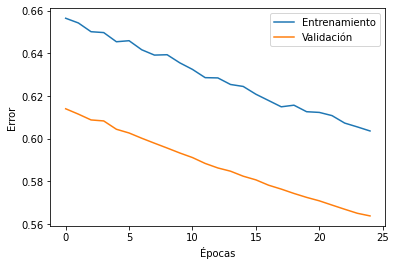

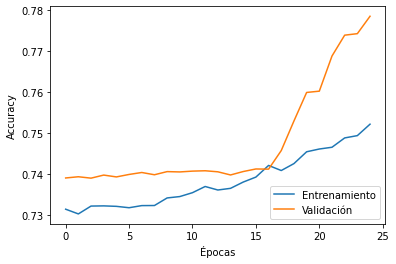

In [ ]:
plot_curves(hist.history)

In [ ]:
y_pred_train=model.predict(TX_train185)
y_pred_val=model.predict(TX_val185)
#y_pred_test=model.predict(TX_test)

In [ ]:
y_pred_train_un=np.argmax(y_pred_train, axis=1)
y_pred_val_un=np.argmax(y_pred_val, axis=1)
#y_pred_test_un=np.argmax(y_pred_test, axis=1)

In [ ]:
 from sklearn.metrics import classification_report

print(classification_report(train_Y185, y_pred_train_un))
print(classification_report(val_Y185, y_pred_val_un))
#print(classification_report(test_Y, y_pred_test_un))

              precision    recall  f1-score   support

           0       0.88      0.66      0.75     21228
           1       0.81      0.81      0.81     11322
           2       0.63      0.92      0.75     11883

    accuracy                           0.77     44433
   macro avg       0.77      0.80      0.77     44433
weighted avg       0.80      0.77      0.77     44433

              precision    recall  f1-score   support

           0       0.88      0.66      0.75    399993
           1       0.81      0.81      0.81    215755
           2       0.64      0.91      0.75    228493

    accuracy                           0.77    844241
   macro avg       0.78      0.80      0.77    844241
weighted avg       0.80      0.77      0.77    844241



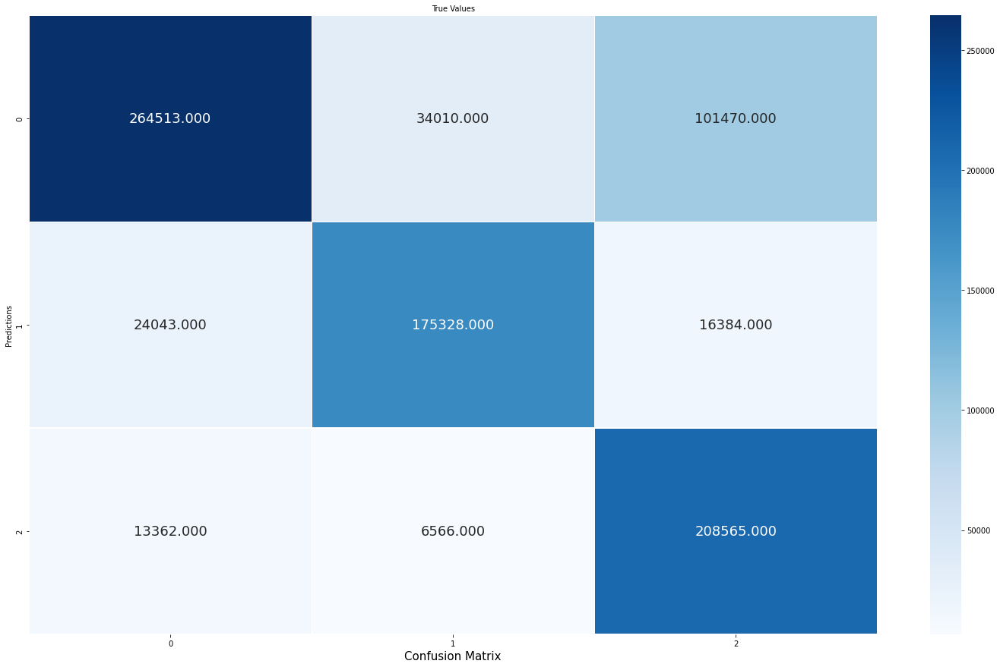

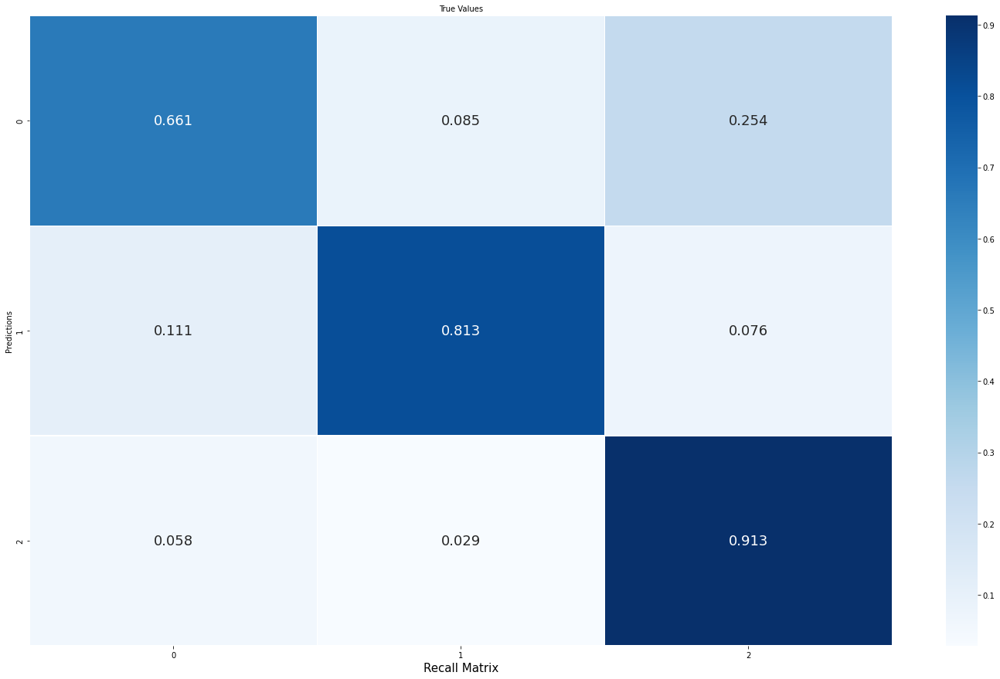

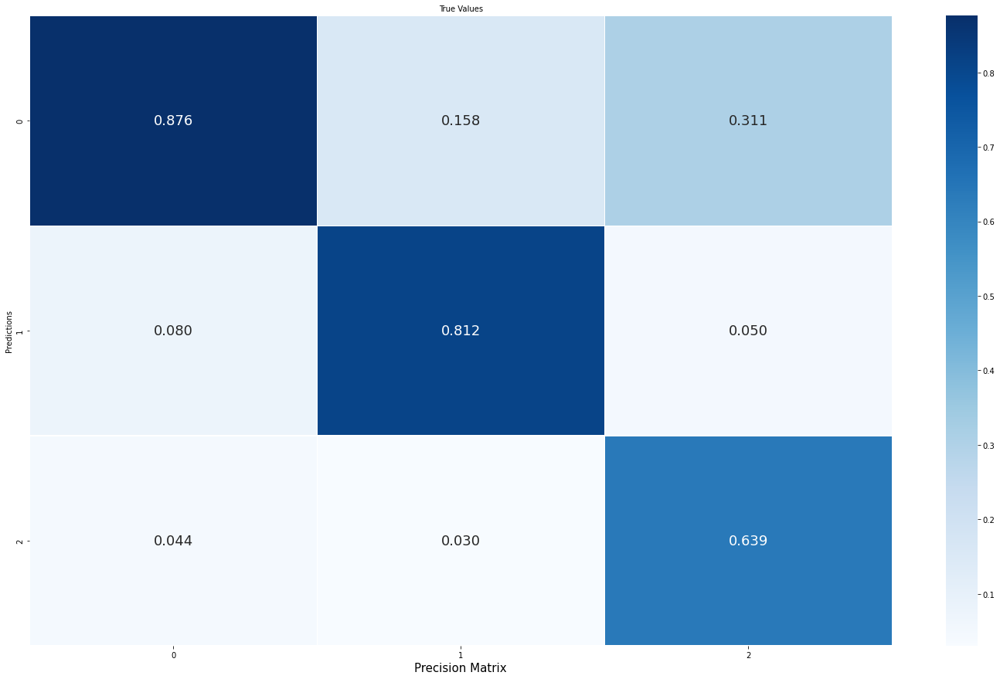

In [ ]:
confm=pd.crosstab(val_Y185, y_pred_val_un)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm ,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Entrenamiento DNN con datos 2019 y resultados obtenidos

In [ ]:
import os

checkpoint_path = "training_3/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

hist = model.fit(TX_train195, 
                 train_Y195, 
                 batch_size=batch_size, 
                 epochs=n_epochs, 
                 verbose=1, 
                 shuffle=True,
                 validation_data=(TX_val195, val_Y195),
                 class_weight=class_dictW195,
                 callbacks=[cp_callback])

Epoch 1/50
1390/1390 [==============================] - 29s 21ms/step - loss: 0.9498 - accuracy: 0.6893 - val_loss: 0.7070 - val_accuracy: 0.7215

Epoch 00001: saving model to training_3/cp.ckpt
Epoch 2/50
1390/1390 [==============================] - 28s 20ms/step - loss: 0.8997 - accuracy: 0.7063 - val_loss: 0.6810 - val_accuracy: 0.7344

Epoch 00002: saving model to training_3/cp.ckpt
Epoch 3/50
1390/1390 [==============================] - 44s 32ms/step - loss: 0.8777 - accuracy: 0.7120 - val_loss: 0.6663 - val_accuracy: 0.7416

Epoch 00003: saving model to training_3/cp.ckpt
Epoch 4/50
1390/1390 [==============================] - 28s 20ms/step - loss: 0.8677 - accuracy: 0.7190 - val_loss: 0.6607 - val_accuracy: 0.7423

Epoch 00004: saving model to training_3/cp.ckpt
Epoch 5/50
1390/1390 [==============================] - 28s 20ms/step - loss: 0.8570 - accuracy: 0.7252 - val_loss: 0.6494 - val_accuracy: 0.7467

Epoch 00005: saving model to training_3/cp.ckpt
Epoch 6/50
1390/1390 [===

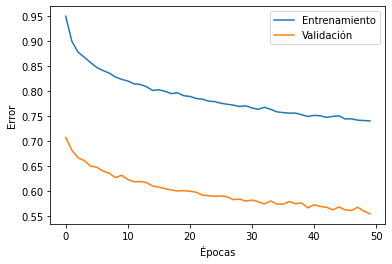

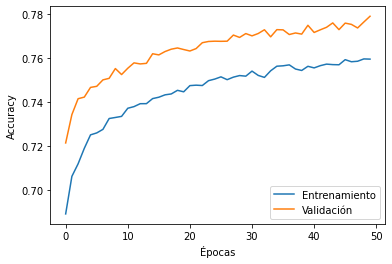

In [ ]:
plot_curves(hist.history)

In [ ]:
y_pred_train=model.predict(TX_train195)
y_pred_val=model.predict(TX_val195)
#y_pred_test=model.predict(TX_test)

In [ ]:
y_pred_train_un=np.argmax(y_pred_train, axis=1)
y_pred_val_un=np.argmax(y_pred_val, axis=1)
#y_pred_test_un=np.argmax(y_pred_test, axis=1)

In [ ]:
 from sklearn.metrics import classification_report

print(classification_report(train_Y195, y_pred_train_un))
print(classification_report(val_Y195, y_pred_val_un))
#print(classification_report(test_Y, y_pred_test_un))

              precision    recall  f1-score   support

           0       0.77      0.65      0.70     15712
           1       0.83      0.77      0.80     11707
           2       0.75      0.90      0.82     17058

    accuracy                           0.78     44477
   macro avg       0.78      0.77      0.77     44477
weighted avg       0.78      0.78      0.77     44477

              precision    recall  f1-score   support

           0       0.77      0.66      0.71    299737
           1       0.83      0.77      0.80    220733
           2       0.76      0.90      0.82    324605

    accuracy                           0.78    845075
   macro avg       0.79      0.78      0.78    845075
weighted avg       0.78      0.78      0.78    845075



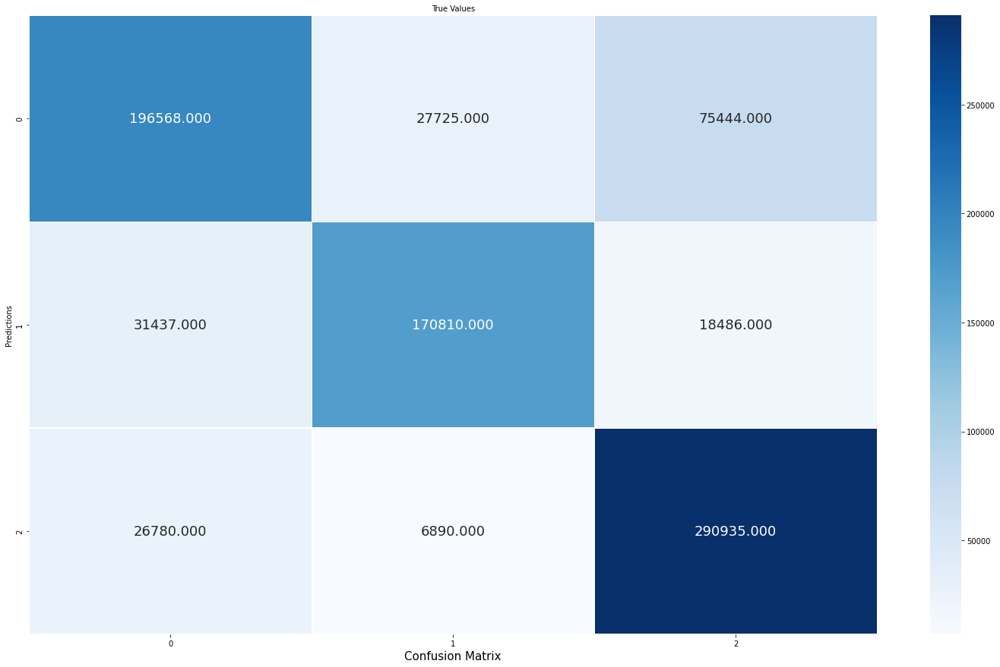

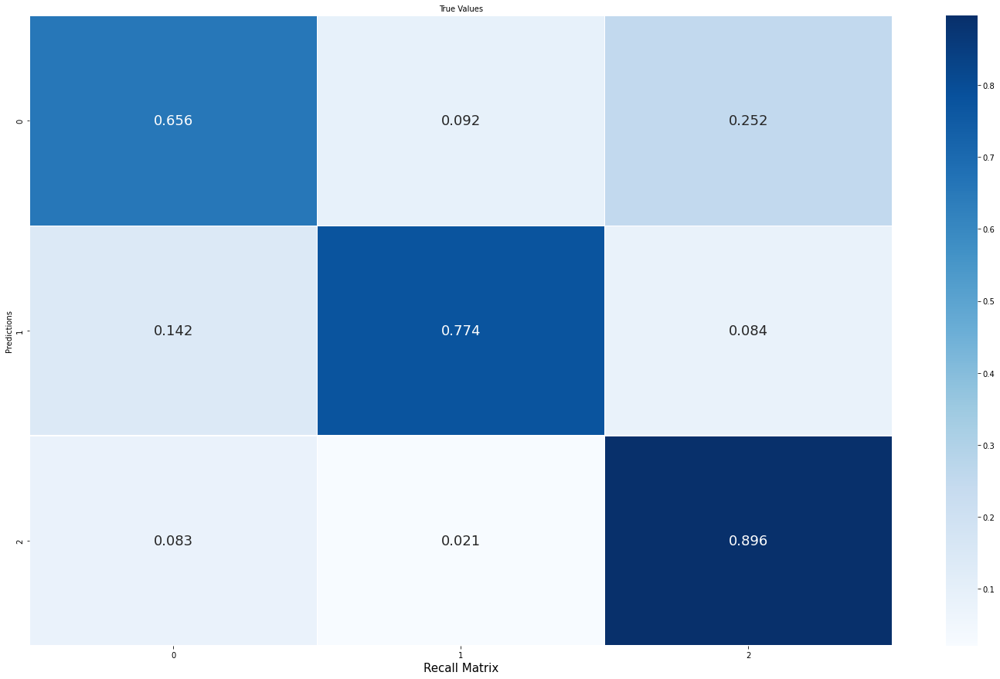

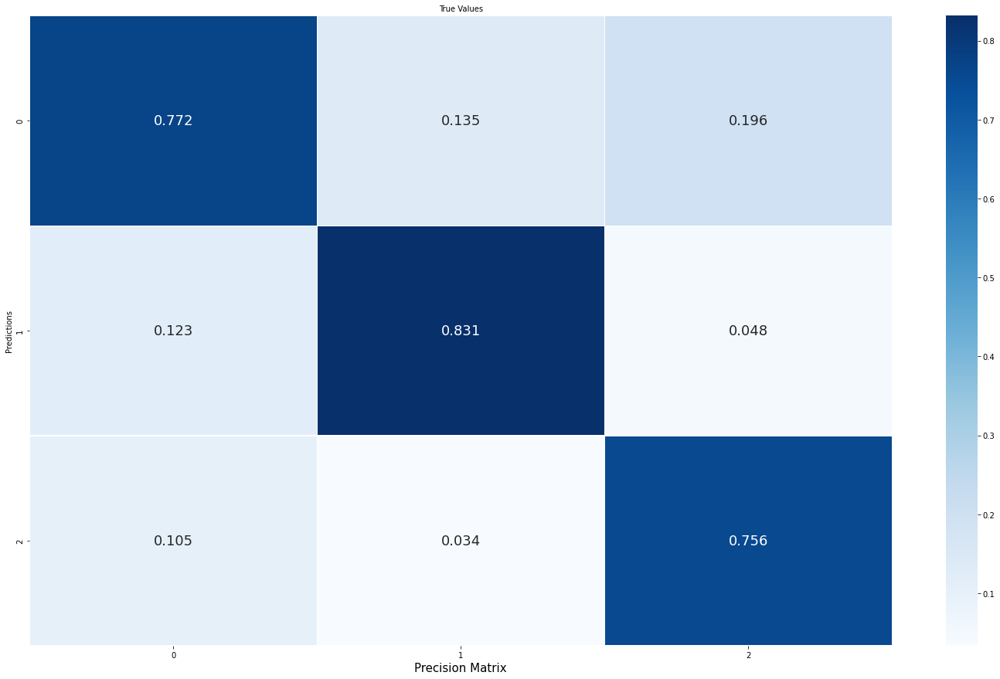

In [ ]:
confm=pd.crosstab(val_Y195, y_pred_val_un)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm ,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

#Modelo 2-biLSTM


##Entrenamiento y resultados obtenidos con los datos de 2017

In [ ]:
lr = 0.001
batch_size = 256
n_epochs = 100
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

import os

checkpoint_path = "training_4/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

#REGULARIZACIÓN L2 CON 0.01
num_feat=3
model = Sequential()
model.add(Bidirectional(LSTM(40,return_sequences=True, activation='tanh', recurrent_activation='sigmoid' , kernel_regularizer=regularizers.l2(0.01),use_bias=False)))
model.add(Bidirectional(LSTM(40,activation='tanh', recurrent_activation='sigmoid', kernel_regularizer=regularizers.l2(0.01) ,use_bias=False)))
model.add(Dense(num_feat, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer= optimizer, metrics=['accuracy'])
histograma1=model.fit(TX_train175[:,:, None], pd.get_dummies(train_Y175), validation_data=(TX_val175[:,:, None], pd.get_dummies(val_Y175)), 
                      class_weight=class_dictW175, epochs=n_epochs, batch_size=batch_size, callbacks=[cp_callback])
#
#
##SPLIT DATA FOR CROSS VALIDATION (CON StratifiedKFold)
#folds = StratifiedKFold(n_splits=7)
#results_CV=[]
#for train_index, test_index in kf.split(X_CV):
# X_train, X_test, y_train, y_test = X_CV.iloc[train_index, :], X_CV.iloc[test_index, :], Y_CV.iloc[train_index, :], Y_CV.iloc[test_index, :]
# results_CV.append(get_score(model, X_train, X_test, y_train, y_test))

Epoch 1/100
174/174 [==============================] - 92s 504ms/step - loss: 1.7264 - accuracy: 0.3351 - val_loss: 0.9134 - val_accuracy: 0.5128

Epoch 00001: saving model to training_4/cp.ckpt
Epoch 2/100
174/174 [==============================] - 89s 516ms/step - loss: 0.8936 - accuracy: 0.5336 - val_loss: 0.8840 - val_accuracy: 0.5386

Epoch 00002: saving model to training_4/cp.ckpt
Epoch 3/100
174/174 [==============================] - 86s 496ms/step - loss: 0.8648 - accuracy: 0.5618 - val_loss: 0.8474 - val_accuracy: 0.5433

Epoch 00003: saving model to training_4/cp.ckpt
Epoch 4/100
174/174 [==============================] - 88s 511ms/step - loss: 0.8500 - accuracy: 0.5637 - val_loss: 0.8164 - val_accuracy: 0.5961

Epoch 00004: saving model to training_4/cp.ckpt
Epoch 5/100
174/174 [==============================] - 85s 489ms/step - loss: 0.8339 - accuracy: 0.5831 - val_loss: 0.8865 - val_accuracy: 0.5040

Epoch 00005: saving model to training_4/cp.ckpt
Epoch 6/100
174/174 [====

##Función para visualizar el proceso de entrenamiento y validación

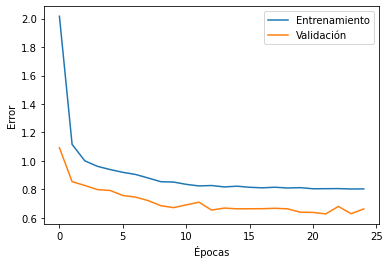

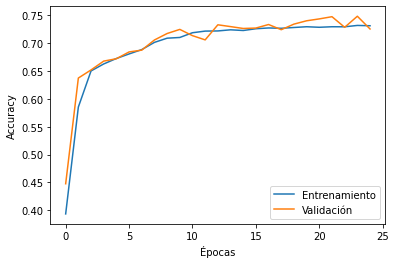

In [ ]:
def plot_curves(history):
  plt.figure()
  plt.xlabel('Épocas')
  plt.ylabel('Error')
  plt.plot(history['loss'])
  plt.plot(history['val_loss']) 
  plt.legend(['Entrenamiento', 'Validación'])

  plt.figure()
  plt.xlabel('Épocas')
  plt.ylabel('Accuracy')
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.legend(['Entrenamiento', 'Validación'], loc='lower right');

plot_curves(histograma1.history)

In [ ]:
#predicciones del modelo
from sklearn.metrics import classification_report


predictions_train=model.predict(TX_train175[:,:,None])
resultados_train=np.argmax(predictions_train, axis=1)

predictions_val = model.predict(TX_val175[:,:,None])
resultados_val=np.argmax(predictions_val, axis=1)

print(classification_report(train_Y175, resultados_train))
print(classification_report(val_Y175, resultados_val))







              precision    recall  f1-score   support

           0       0.85      0.63      0.72     24700
           1       0.79      0.85      0.82     11540
           2       0.44      0.74      0.55      8188

    accuracy                           0.71     44428
   macro avg       0.69      0.74      0.70     44428
weighted avg       0.76      0.71      0.71     44428

              precision    recall  f1-score   support

           0       0.85      0.63      0.72    469403
           1       0.79      0.85      0.82    219765
           2       0.44      0.74      0.55    154969

    accuracy                           0.70    844137
   macro avg       0.69      0.74      0.70    844137
weighted avg       0.76      0.70      0.71    844137



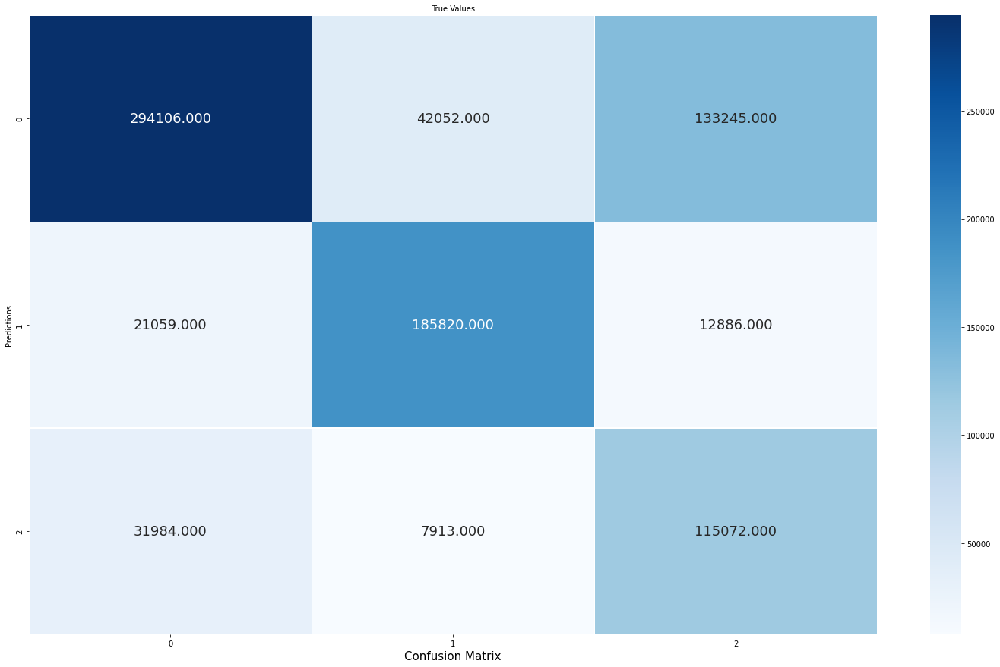

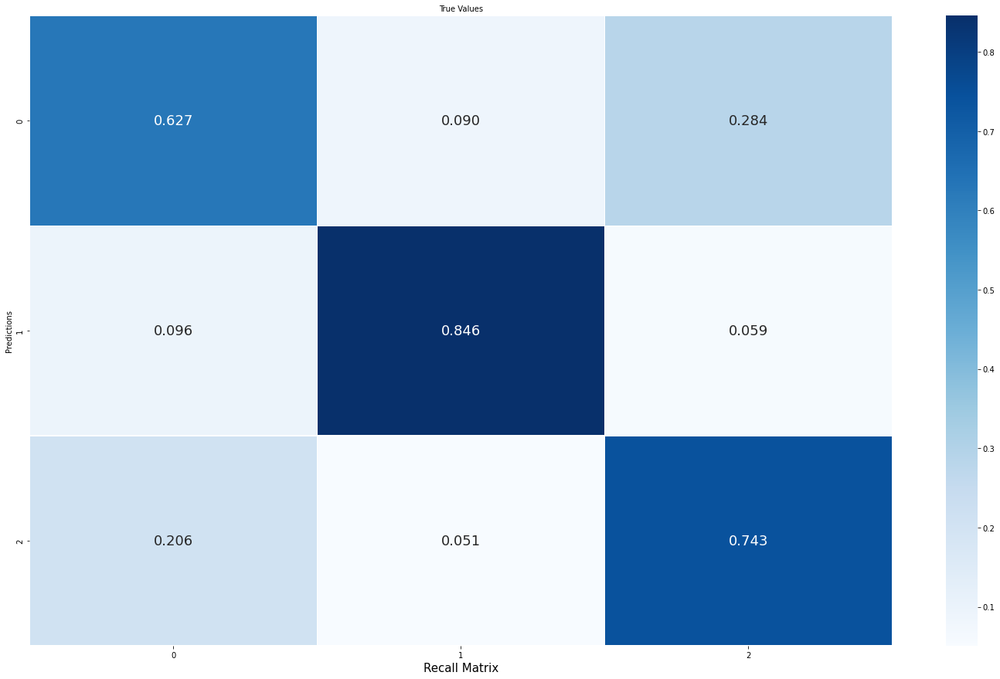

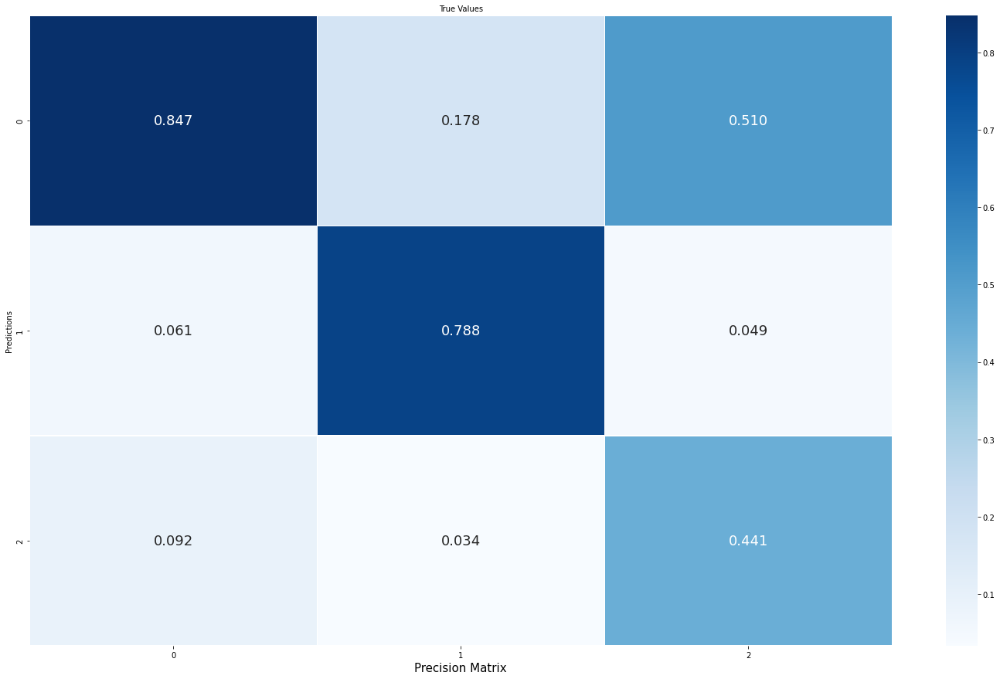

In [ ]:
confm=pd.crosstab(val_Y175, resultados_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm ,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Entrenamiento y resultados obtenidos con los datos de 2018

In [ ]:
lr = 0.001
batch_size = 256
n_epochs = 100
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

import os

checkpoint_path = "training_5/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

#REGULARIZACIÓN L2 CON 0.01
num_feat=3
model = Sequential()
model.add(Bidirectional(LSTM(40,return_sequences=True, activation='tanh', recurrent_activation='sigmoid' , kernel_regularizer=regularizers.l2(0.01),use_bias=False)))
model.add(Bidirectional(LSTM(40,activation='tanh', recurrent_activation='sigmoid', kernel_regularizer=regularizers.l2(0.01) ,use_bias=False)))
model.add(Dense(num_feat, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer= optimizer, metrics=['accuracy'])
histograma1=model.fit(TX_train185[:,:, None], pd.get_dummies(train_Y185), validation_data=(TX_val185[:,:, None], pd.get_dummies(val_Y185)), 
                      class_weight=class_dictW185, epochs=n_epochs, batch_size=batch_size, callbacks=[cp_callback])
#
#
##SPLIT DATA FOR CROSS VALIDATION (CON StratifiedKFold)
#folds = StratifiedKFold(n_splits=7)
#results_CV=[]
#for train_index, test_index in kf.split(X_CV):
# X_train, X_test, y_train, y_test = X_CV.iloc[train_index, :], X_CV.iloc[test_index, :], Y_CV.iloc[train_index, :], Y_CV.iloc[test_index, :]

Epoch 1/100
174/174 [==============================] - 153s 513ms/step - loss: 1.7859 - accuracy: 0.3817 - val_loss: 1.0100 - val_accuracy: 0.4672

Epoch 00001: saving model to training_5/cp.ckpt
Epoch 2/100
174/174 [==============================] - 87s 505ms/step - loss: 0.9421 - accuracy: 0.5500 - val_loss: 0.8882 - val_accuracy: 0.5466

Epoch 00002: saving model to training_5/cp.ckpt
Epoch 3/100
174/174 [==============================] - 86s 496ms/step - loss: 0.8578 - accuracy: 0.6131 - val_loss: 0.7641 - val_accuracy: 0.6635

Epoch 00003: saving model to training_5/cp.ckpt
Epoch 4/100
174/174 [==============================] - 86s 498ms/step - loss: 0.8175 - accuracy: 0.6622 - val_loss: 0.7440 - val_accuracy: 0.6869

Epoch 00004: saving model to training_5/cp.ckpt
Epoch 5/100
174/174 [==============================] - 87s 501ms/step - loss: 0.7696 - accuracy: 0.6926 - val_loss: 0.7071 - val_accuracy: 0.7047

Epoch 00005: saving model to training_5/cp.ckpt
Epoch 6/100
174/174 [===

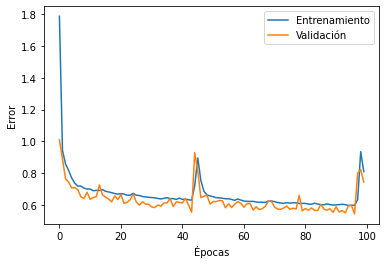

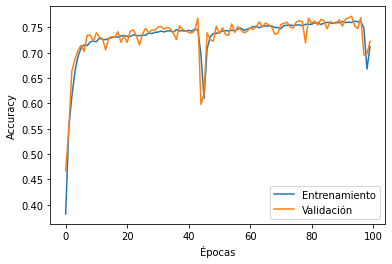

In [ ]:
plot_curves(histograma1.history)

In [ ]:
#predicciones del modelo
from sklearn.metrics import classification_report


predictions_train=model.predict(TX_train185[:,:,None])
resultados_train=np.argmax(predictions_train, axis=1)

predictions_val = model.predict(TX_val185[:,:,None])
resultados_val=np.argmax(predictions_val, axis=1)

print(classification_report(train_Y185, resultados_train))
print(classification_report(val_Y185, resultados_val))


              precision    recall  f1-score   support

           0       0.85      0.58      0.69     21228
           1       0.80      0.78      0.79     11322
           2       0.57      0.92      0.71     11883

    accuracy                           0.72     44433
   macro avg       0.74      0.76      0.73     44433
weighted avg       0.76      0.72      0.72     44433

              precision    recall  f1-score   support

           0       0.85      0.58      0.69    399993
           1       0.81      0.78      0.79    215755
           2       0.58      0.91      0.71    228493

    accuracy                           0.72    844241
   macro avg       0.74      0.76      0.73    844241
weighted avg       0.76      0.72      0.72    844241



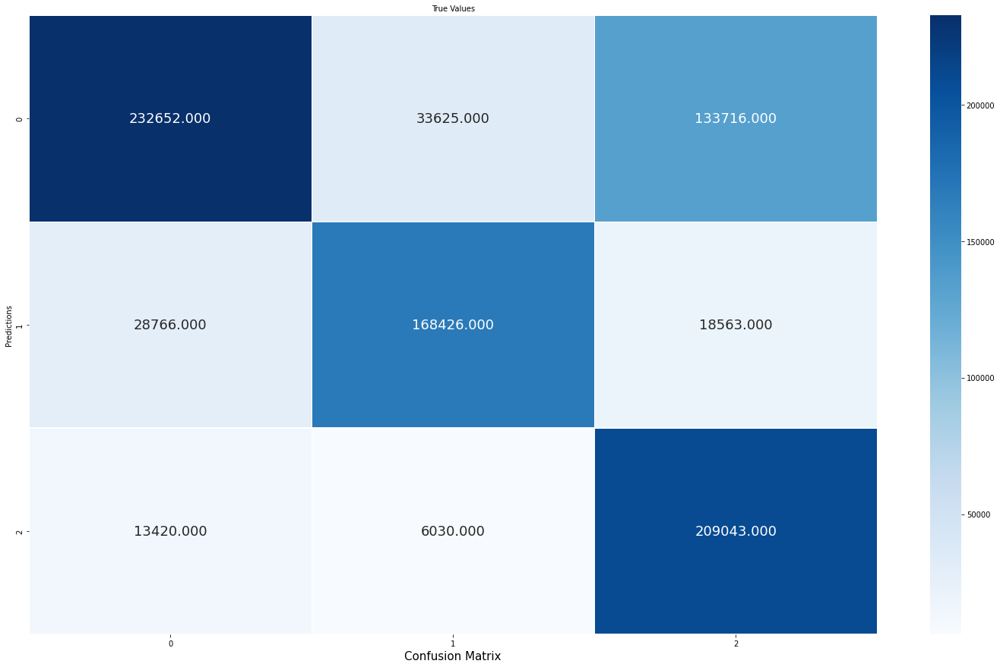

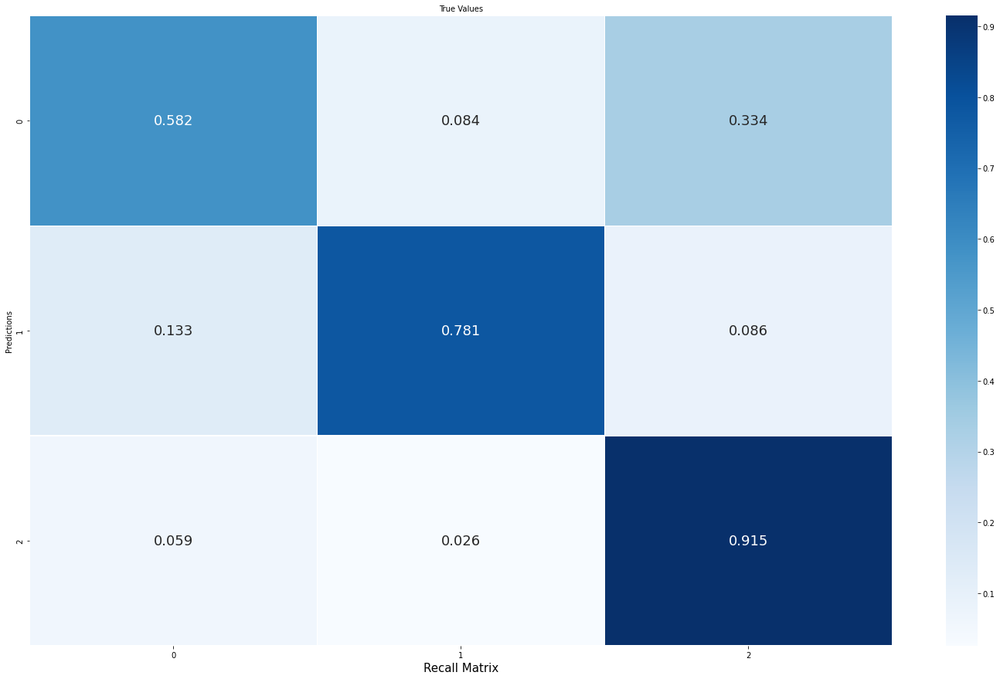

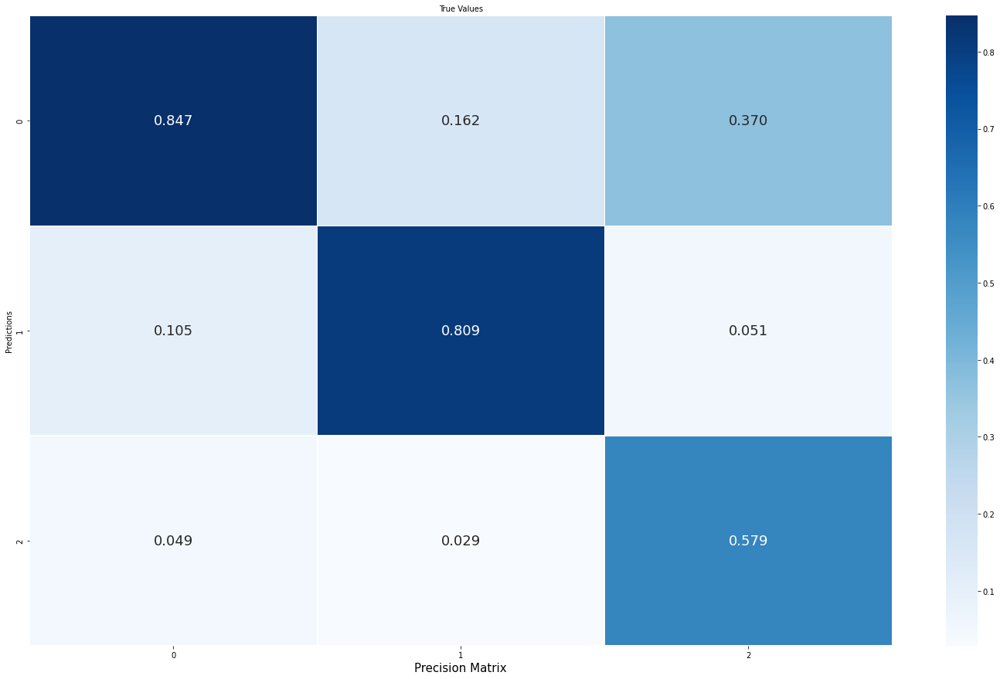

In [ ]:
confm=pd.crosstab(val_Y185, resultados_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm ,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Entrenamiento y resultados obtenidos con los datos de 2019

In [ ]:
lr = 0.001
batch_size = 256
n_epochs = 25
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

import os

checkpoint_path = "training_6/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

#REGULARIZACIÓN L2 CON 0.01
num_feat=3
model = Sequential()
model.add(Bidirectional(LSTM(40,return_sequences=True, activation='tanh', recurrent_activation='sigmoid' , kernel_regularizer=regularizers.l2(0.01),use_bias=False)))
model.add(Bidirectional(LSTM(40,activation='tanh', recurrent_activation='sigmoid', kernel_regularizer=regularizers.l2(0.01) ,use_bias=False)))
model.add(Dense(num_feat, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer= optimizer, metrics=['accuracy'])
histograma1=model.fit(TX_train195[:,:, None], pd.get_dummies(train_Y195), validation_data=(TX_val195[:,:, None], pd.get_dummies(val_Y195)), 
                      class_weight=class_dictW195, epochs=n_epochs, batch_size=batch_size, callbacks=[cp_callback])
#
#
##SPLIT DATA FOR CROSS VALIDATION (CON StratifiedKFold)
#folds = StratifiedKFold(n_splits=7)
#results_CV=[]
#for train_index, test_index in kf.split(X_CV):
# X_train, X_test, y_train, y_test = X_CV.iloc[train_index, :], X_CV.iloc[test_index, :], Y_CV.iloc[train_index, :], Y_CV.iloc[test_index, :]

Epoch 1/25
174/174 [==============================] - 93s 512ms/step - loss: 2.0168 - accuracy: 0.3936 - val_loss: 1.0920 - val_accuracy: 0.4477

Epoch 00001: saving model to training_6/cp.ckpt
Epoch 2/25
174/174 [==============================] - 88s 509ms/step - loss: 1.1158 - accuracy: 0.5853 - val_loss: 0.8534 - val_accuracy: 0.6373

Epoch 00002: saving model to training_6/cp.ckpt
Epoch 3/25
174/174 [==============================] - 88s 508ms/step - loss: 1.0000 - accuracy: 0.6500 - val_loss: 0.8268 - val_accuracy: 0.6518

Epoch 00003: saving model to training_6/cp.ckpt
Epoch 4/25
174/174 [==============================] - 89s 514ms/step - loss: 0.9612 - accuracy: 0.6626 - val_loss: 0.7976 - val_accuracy: 0.6677

Epoch 00004: saving model to training_6/cp.ckpt
Epoch 5/25
174/174 [==============================] - 87s 505ms/step - loss: 0.9385 - accuracy: 0.6724 - val_loss: 0.7915 - val_accuracy: 0.6719

Epoch 00005: saving model to training_6/cp.ckpt
Epoch 6/25
174/174 [==========

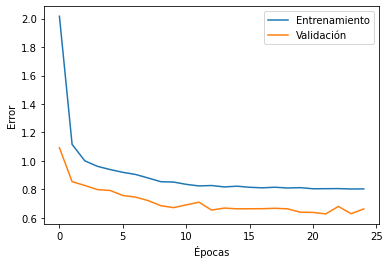

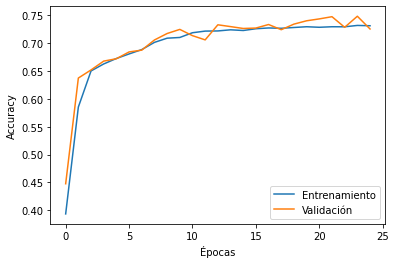

In [ ]:
plot_curves(histograma1.history)

In [ ]:
#predicciones del modelo
from sklearn.metrics import classification_report


predictions_train=model.predict(TX_train195[:,:,None])
resultados_train=np.argmax(predictions_train, axis=1)

predictions_val = model.predict(TX_val195[:,:,None])
resultados_val=np.argmax(predictions_val, axis=1)

print(classification_report(train_Y195, resultados_train))
print(classification_report(val_Y195, resultados_val))


              precision    recall  f1-score   support

           0       0.72      0.54      0.62     15712
           1       0.84      0.69      0.76     11707
           2       0.68      0.91      0.78     17058

    accuracy                           0.72     44477
   macro avg       0.74      0.71      0.72     44477
weighted avg       0.73      0.72      0.72     44477

              precision    recall  f1-score   support

           0       0.72      0.54      0.62    299737
           1       0.84      0.70      0.76    220733
           2       0.68      0.91      0.78    324605

    accuracy                           0.73    845075
   macro avg       0.75      0.72      0.72    845075
weighted avg       0.74      0.73      0.72    845075



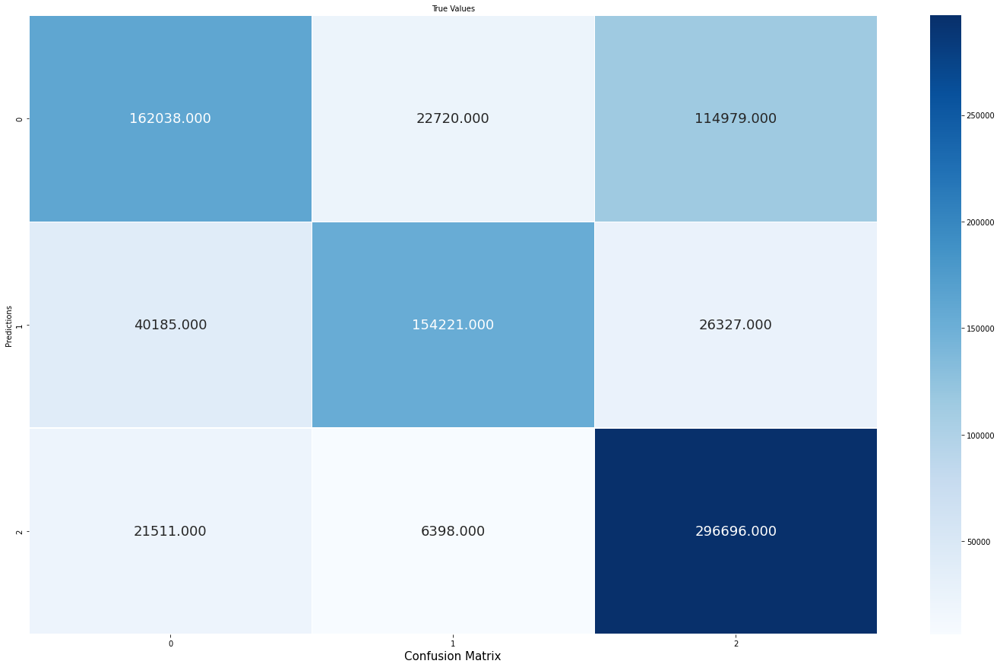

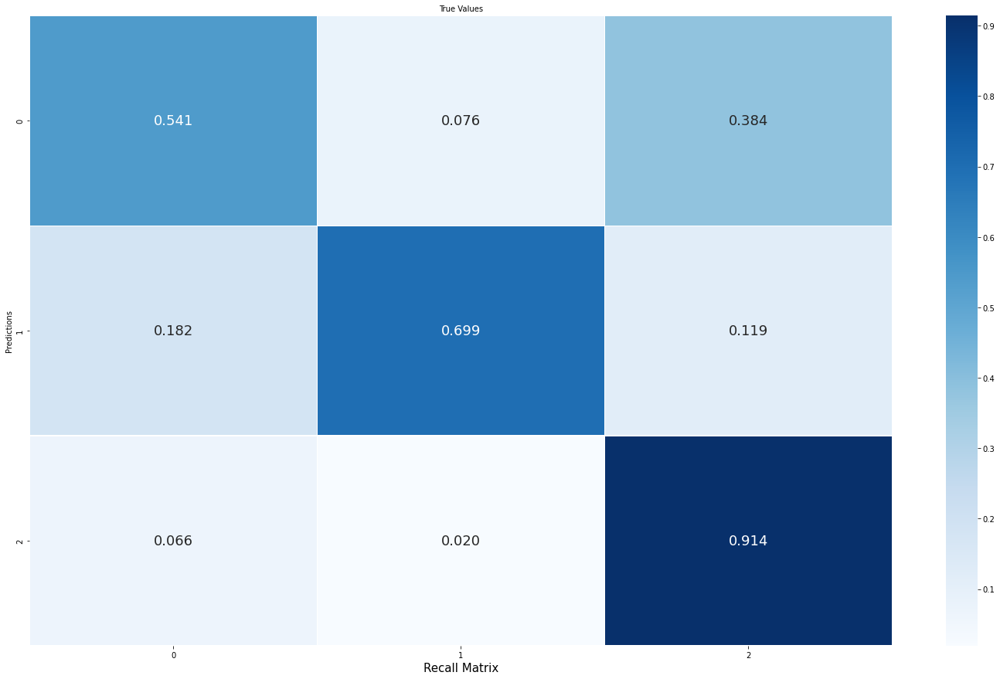

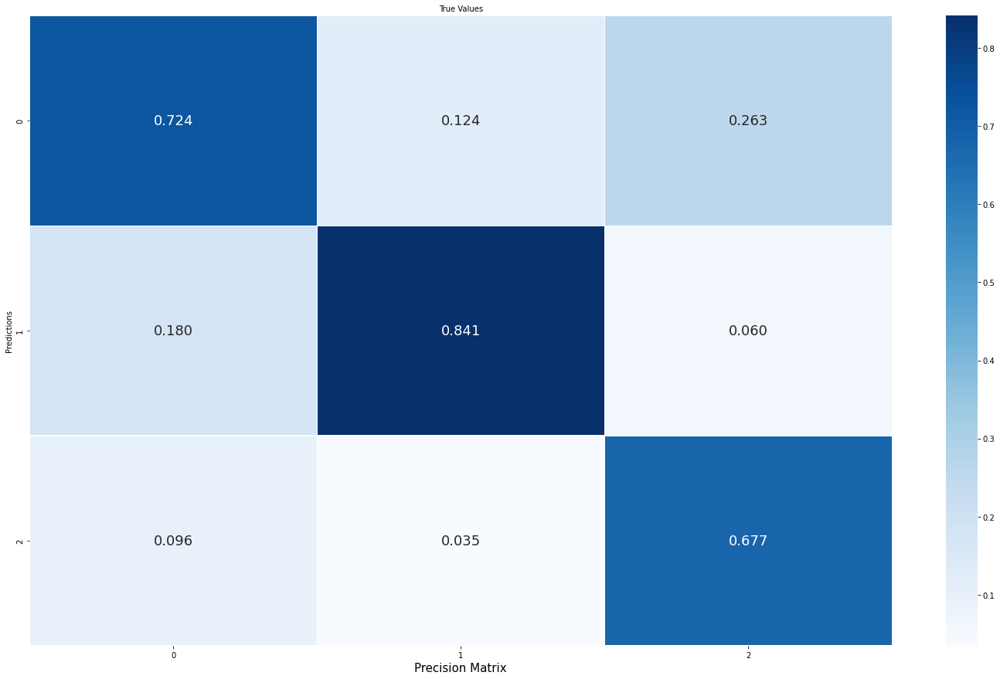

In [ ]:
confm=pd.crosstab(val_Y195, resultados_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm ,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()